# Model Development

In [1]:
import os
import pandas as pd
import numpy as np
import pickle
import sys
from pandas import HDFStore,DataFrame
from datetime import date, datetime
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
import yaml
import math
import time

import matplotlib.pyplot as plt
import seaborn as sns
#from matplotlib_venn import venn2


cfg = None
    #' load config.yaml file in the root dir 
with open("../config.yaml", 'r') as ymlfile:
    cfg = yaml.load(ymlfile, Loader=yaml.FullLoader)

# Use 3 decimal places in output display
pd.set_option("display.precision", 3)

# Don't wrap repr(DataFrame) across additional lines
pd.set_option("display.expand_frame_repr", False)

# Set max rows displayed in output to 25
pd.set_option("display.max_rows", 25)

pd.set_option('display.float_format', lambda x: '%.2f' % x)

product_level = 'Product Level 2'

colors = ['#1F77B4', '#FF7F0E', 'orangered']

path_to_hdf_datastore = '../'+cfg['path_to_hdf_datastore']

NA_VALUES_LIST = ['Unassigned', 'Unknown','nan', 'N.A', 'N.A.', 'NaN', 'Nan', '00-00-00', '0-00-00']


In [2]:
# customer ids cols
ECH_ecrid_col = 'ecrid'
journals_ecrid_col = 'SIS Id  (Agreement SIS)'
other_ecrid_col = 'SIS Id  (Agreement SIS)'
churn_activities_ecrid_col = 'ECR Id'
churn_risks_ecrid_col = 'Account Name: ECR Id'
account_assignment_ecrid_col = 'ECRID'
NPS_ecrid_col = 'ECR_ID'
usage_ecrid_col = 'ECR_ID'
interactions_ecrid_col = 'ECR_ID'
cancellations_ecrid_col = 'SIS Id  (Agreement SIS)'

MERGE_ID = 'SIS Id  (Agreement SIS)'

In [3]:
def get_data_frame_summary(data_frame):
        unique_values = data_frame.apply(lambda x: [x.unique()])
        unique_counts = data_frame.apply(lambda x: len(x.unique()))
        na_counts = data_frame.apply(lambda x: sum(x.isna()))
        percent_missing = data_frame.apply(lambda x: sum(pd.isnull(x))/len(x)*100)
        data_type = data_frame.dtypes 

        return pd.DataFrame(dict(unique_values = unique_values, 
                                 unique_counts = unique_counts,
                                 na_counts = na_counts,
                                 data_type = data_type,
                                 percent_missing = percent_missing,
                                )).reset_index().sort_values(by='percent_missing', ascending=False)
    
# Function to scale features of numeric columns
def scale_numeric_features(data_frame, exclude=[], 
                           method='standardize',
                           inplace=False):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    num_cols = data_frame.select_dtypes(include=numerics).columns

    num_cols = num_cols.difference(exclude)
    print(f'********************* - Scaling following {len(num_cols)} features - **********************')
    for colname in num_cols:
        new_colname = colname if inplace else colname+'_'+method+'d'
        print(f' {colname} {method}d to {new_colname}')
        
        if method == 'standardize':              
              data_frame[new_colname] = (data_frame[colname] - data_frame[colname].mean()) / data_frame[colname].std()
        elif method == 'normalize':
              data_frame[new_colname] = (data_frame[colname] - data_frame[colname].min()) / (data_frame[colname].max() - data_frame[colname].min())
        else:
              print(f'Unknown method {method} specified, please select one of "standardize" or "normalize"')

      
    return data_frame


# number of agreements per ecr per product

def get_rfm_features_from_contracts(dataframe, groupcols):    

    dataframe = dataframe.groupby(
                groupcols
    ).agg(bookings=("Bookings - Final Net Price - Agent Discount Amount(Rep)", sum),
          mean_bookings = ("Bookings - Final Net Price - Agent Discount Amount(Rep)", 'mean'),
          num_agrmts=('Agreement Number', pd.Series.nunique), 
        num_agrmts_with_parent = ('Parent Agreement Number', pd.Series.nunique),
        last_agreement = ('Agreement Start Date', max),
        first_agreement = ('Agreement Start Date', min)
    ).sort_values('bookings', ascending=False)

    dataframe['last_agreement'] = pd.to_datetime(dataframe['last_agreement'], format='%Y-%m-%d')
    dataframe['first_agreement'] = pd.to_datetime(dataframe['first_agreement'], format='%Y-%m-%d')
    
    dataframe['days_since_last_agreement'] = dataframe['last_agreement'].apply(
        lambda x: (datetime.today() - x).days
        )
    dataframe['days_since_first_agreement'] = dataframe['first_agreement'].apply(
        lambda x: (datetime.today() - x).days
        )
    dataframe['length_of_relationship'] = (dataframe['days_since_first_agreement'] - 
                                           dataframe['days_since_last_agreement'])/365 
    dataframe['length_of_relationship'] = dataframe['length_of_relationship'].apply(math.ceil).clip(lower=1)
        
    dataframe['bookings_per_year'] = dataframe['bookings'] / dataframe['length_of_relationship']
    
    dataframe = dataframe.drop(['last_agreement', 'first_agreement'], axis=1)
    
    return dataframe


def plot_2d_space(X, y, label='Classes'):   
    colors = ['#1F77B4', '#FF7F0E']
    markers = ['o', 's']
    for l, c, m in zip(np.unique(y), colors, markers):
        plt.scatter(
            X[y==l, 0],
            X[y==l, 1],
            c=c, label=l, marker=m
        )
    plt.title(label)
    plt.legend(loc='upper right')
    plt.show()
    
    
def encode_columns(df, columns_to_encode):
    for column in columns_to_encode:
        encoded_columns = pd.get_dummies(df[column])
        print(f'Encoding columns : {column} to {len(encoded_columns.columns)} new encoded columns')
        df = df.join(encoded_columns, rsuffix='_'+column).drop(column, axis=1)
    
    return df


# Function to drop outliers of numeric columns
def drop_outliers(data_frame, exclude=[], include=[]):
    numerics = ['int16', 'int32', 'int64', 'float16', 'float32', 'float64']
    num_cols = data_frame.select_dtypes(include=numerics).columns

    if len(include) > 0:
        num_cols = np.intersect1d(num_cols, include)
    elif len (exclude) > 0:
        num_cols = num_cols.difference(exclude)
    
    data_frame['DROP'] = False
    for colname in num_cols:
        upper_lim = data_frame[colname].quantile(.95)
        lower_lim = data_frame[colname].quantile(.05)
        
        print(f'Dropping outliers for {colname} upper limit = {upper_lim} and lower limit = {lower_lim}')
        #data_frame = data_frame[(data_frame[colname] < upper_lim) & (data_frame[colname] > lower_lim)]
        data_frame['DROP'] = data_frame['DROP'] | (data_frame[colname] > upper_lim) | (data_frame[colname] < lower_lim)
        
    
    data_frame = data_frame.loc[~data_frame['DROP']]
    print(f'Rows Remaining {data_frame.shape[0]}')
    data_frame = data_frame.drop(['DROP'], axis=1)    
    return data_frame


def get_trend_feature(df, new_colname, groupcols, timecols, prefix=''):
    SECOND_PERIOD = 1
    
    tempdf = df[groupcols + timecols]
    
    tempdf = tempdf.groupby(groupcols).sum()
    
    # increasing trend customers - - all customers with value True
    increasing_cust = (tempdf.diff(axis=1) > 0)[timecols[SECOND_PERIOD:]].apply(all, axis=1)
    increasing_cust_index = increasing_cust[increasing_cust].index
    
    print("INCREASING TREND")
    print(increasing_cust.value_counts())
    # decreasing trend customers - all customers with value False
    decreasing_cust = (tempdf.diff(axis=1) > 0)[timecols[SECOND_PERIOD:]].apply(any, axis=1)
    decreasing_cust_index = decreasing_cust[~decreasing_cust].index
    
    print("DECREASING TREND")
    print(decreasing_cust.value_counts())
    
    #df[new_colname] = 'updown_trend'
    df.loc[:,new_colname] = prefix+'updown_trend'
    df = df.set_index(groupcols)
    
    df.loc[increasing_cust_index, new_colname] = prefix+'increasing_trend'

    df.loc[decreasing_cust_index, new_colname] = prefix+'decreasing_trend'
    
    df = df.reset_index()
    
    return df


# Label Encoder

from sklearn import preprocessing

def encode_labels(df, cols_to_encode):
    
    le_dict = {}
    for col in cols_to_encode:
        le = preprocessing.LabelEncoder()
        le.fit(df[col])
        df[col] = le.transform(df[col])
        le_dict[col] = le
        
    return df, le_dict
        

def print_counts(df):
    print(df.shape)
    try:
        print(len(all_contracts_rfm['SIS Id  (Agreement SIS)'].unique()))
    except:
        print('No customer col')
    
    try:
        print(len(all_contracts_rfm["Product Line Level 2"].unique()))
    except:
        print('No Product col')

### Read Contracts Data

In [4]:
#all_contracts = pd.read_pickle('../data/pickle/all_contracts_dev.pickle')
all_contracts = pd.read_pickle('../data/hdf/all_contracts_dev.pickle')

In [5]:
# Unique Customer x Product Level 2 Combinations

In [6]:
print(f'Unique Customers : {len(all_contracts["SIS Id  (Agreement SIS)"].unique())}')
print(f'Unique Products at Level 2 : {len(all_contracts["Product Line Level 2"].unique())}')
print(f'Unique Customer Product Combinations : {len(all_contracts[["SIS Id  (Agreement SIS)", "Product Line Level 2"]].drop_duplicates())}')

Unique Customers : 14053
Unique Products at Level 2 : 29
Unique Customer Product Combinations : 28002


### Total Bookings value over entire period

In [7]:
print(f' Total Bookings value all year in the data {all_contracts["Bookings - Final Net Price - Agent Discount Amount(Rep)"].sum()}')

 Total Bookings value all year in the data 9678412735.308037


### Total Bookings Value Spread over years

In [8]:
all_contracts.groupby(
    ['Subscription Start Year']
).agg(bookings=("Bookings - Final Net Price - Agent Discount Amount(Rep)", sum)
    ).sort_values('bookings', ascending=False).reset_index().sort_values(
    'Subscription Start Year').set_index('Subscription Start Year').T


Subscription Start Year,2015,2016,2017,2018,2019,2020
bookings,1930629657.88,1945240938.66,1967744108.34,2055965162.26,1778827101.17,5767.00


## Load ECH and Hierarchy dataset

In [9]:
ech = pd.read_hdf(path_to_hdf_datastore, cfg['ech_hdf_file'])
hierarchy = pd.read_hdf(path_to_hdf_datastore, cfg['hierarchy_file'])

active_cust_hierarchy = pd.merge(ech[['ecrid', 'Classification']] , 
                                 hierarchy, left_on='ecrid', right_on='CHILD_ECR', how='inner')

active_cust_hierarchy = active_cust_hierarchy.drop(['ecrid', ], axis=1)

### calculate hierarchy features 

In [10]:
active_cust_hierarchy_agg = active_cust_hierarchy.groupby('PARENT_ECR').agg(
    num_child = ('CHILD_ECR', pd.Series.nunique),
    max_hier = ('HIER_LEVEL', max)
).sort_values('num_child', ascending=False)

In [11]:
active_cust_hierarchy_agg.head()

,num_child,max_hier
PARENT_ECR,,
ECR-10081512,4111,7
ECR-392273,4045,6
ECR-452899,3137,7
ECR-10002610,3094,7
ECR-334967,2169,6


In [12]:
active_cust_hierarchy = pd.merge(active_cust_hierarchy, active_cust_hierarchy_agg, 
                                 on='PARENT_ECR')

### @TODO Add country GEDR if necessary

In [13]:
active_cust_hierarchy.head()

,Classification,CHILD_ECR,CHILD_NAME,CONSORTIUM,COUNTRY_CHILD,COUNTRY_PARENT,HIERARCHY_TYPE,HIER_LEVEL,PARENT_ECR,PARENT_NAME,num_child,max_hier
0,Academic,ECR-560156,National Institute for Research-Development in...,NON-CONS,Romania,Romania,RINGGOLD,1,ECR-601641,Ministry of National Education and Scientific ...,18,2
1,Academic,ECR-560161,National Institute for Research and Developmen...,NON-CONS,Romania,Romania,RINGGOLD,1,ECR-601641,Ministry of National Education and Scientific ...,18,2
2,Government,ECR-601656,National Authority for Scientific Research,NON-CONS,Romania,Romania,RINGGOLD,1,ECR-601641,Ministry of National Education and Scientific ...,18,2
3,Academic,ECR-1161375,National Institute for Aerospace Research Elie...,NON-CONS,Romania,Romania,RINGGOLD,2,ECR-601641,Ministry of National Education and Scientific ...,18,2
4,Academic,ECR-1207316,National Institute for Metals and Radioactive ...,NON-CONS,Romania,Romania,RINGGOLD,1,ECR-601641,Ministry of National Education and Scientific ...,18,2


## Compute RFM (Recency , Frequency, Money) Variable from contracts data

In [14]:
all_contracts_rfm_cust = get_rfm_features_from_contracts(all_contracts, 
                                                         groupcols =['SIS Id  (Agreement SIS)', 'TYPE'])

In [15]:
all_contracts_rfm_cust = all_contracts_rfm_cust.rename(columns={"bookings": "total_bookings", 
                                       "mean_bookings": "total_mean_bookings",
                                       "num_agrmts": "total_num_agrmts",
                                       "num_agrmts_with_parent": "total_num_agrmts_with_parents",
                                       "days_since_last_agreement": "total_days_since_last_agreement",
                                       "days_since_first_agreement": "total_days_since_first_agreement",
                                       "length_of_relationship": "total_length_of_relationship",
                                       "bookings_per_year": "total_bookings_per_year"
                                      }).reset_index()

In [16]:
print(f'Unique Customers : {len(all_contracts_rfm_cust["SIS Id  (Agreement SIS)"].unique())}')

Unique Customers : 14053


In [17]:
all_contracts_rfm_cust.head()

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year
0,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15
1,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77
2,ECR-71655,JOURNALS,90079946.57,4578.86,17,15,1192,1923,3,30026648.86
3,ECR-248281,JOURNALS,68692943.70,3118.58,10,5,462,2288,6,11448823.95
4,ECR-380603,JOURNALS,66257735.60,148893.79,31,30,281,1558,4,16564433.90


In [18]:
all_contracts_rfm_cust['total_length_of_relationship'].unique()

array([ 6,  5,  3,  4,  7,  2,  1,  8,  9, 10], dtype=int64)

## Calssify High Value Customers  / per year revenue

In [19]:
all_contracts_rfm_cust['over_million_year'] = all_contracts_rfm_cust['total_bookings_per_year'] > 1000000

In [20]:
all_contracts_rfm_cust['over_million_year'].value_counts()

False    17977
True       390
Name: over_million_year, dtype: int64

In [21]:
all_contracts_rfm_cust_prod = get_rfm_features_from_contracts(all_contracts, 
                                                         groupcols =['SIS Id  (Agreement SIS)', 'Product Line Level 2', 'TYPE'])

In [22]:
all_contracts_rfm_cust_prod = all_contracts_rfm_cust_prod.rename(columns={"bookings": "prod_bookings", 
                                       "mean_bookings": "prod_mean_bookings", 
                                       "num_agrmts": "prod_num_agrmts",
                                       "num_agrmts_with_parent": "prod_num_agrmts_with_parents",
                                       "days_since_last_agreement": "prod_days_since_last_agreement",
                                       "days_since_first_agreement": "prod_days_since_first_agreement",
                                       "length_of_relationship": "prod_length_of_relationship",
                                       "bookings_per_year": "prod_bookings_per_year"
                                      }).reset_index()

In [23]:
all_contracts_rfm_cust_prod.head()

,SIS Id (Agreement SIS),Product Line Level 2,TYPE,prod_bookings,prod_mean_bookings,prod_num_agrmts,prod_num_agrmts_with_parents,prod_days_since_last_agreement,prod_days_since_first_agreement,prod_length_of_relationship,prod_bookings_per_year
0,ECR-490216,Journals Electronic Subscriptions,JOURNALS,499813635.10,59487.46,15,6,462,2288,6,83302272.52
1,ECR-310775,Journals Electronic Subscriptions,JOURNALS,167643160.30,11539.31,82,61,493,1923,4,41910790.08
2,ECR-71655,Journals Electronic Subscriptions,JOURNALS,87163621.62,4650.96,17,15,1192,1923,3,29054540.54
3,ECR-248281,Journals Electronic Subscriptions,JOURNALS,68233567.40,3163.21,9,5,462,2288,6,11372261.23
4,ECR-380603,Journals Electronic Subscriptions,JOURNALS,64974034.53,1225925.18,21,20,281,1558,4,16243508.63


In [24]:
all_contracts_rfm = pd.merge(all_contracts_rfm_cust, all_contracts_rfm_cust_prod, 
                             on=['SIS Id  (Agreement SIS)','TYPE'], how='inner')

In [25]:
print(all_contracts_rfm_cust.shape)
print(all_contracts_rfm_cust_prod.shape)
print(all_contracts_rfm.shape)

(18367, 11)
(28002, 11)
(28002, 20)


In [26]:
del all_contracts_rfm_cust, all_contracts_rfm_cust_prod

In [27]:
all_contracts_rfm.head()

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,over_million_year,Product Line Level 2,prod_bookings,prod_mean_bookings,prod_num_agrmts,prod_num_agrmts_with_parents,prod_days_since_last_agreement,prod_days_since_first_agreement,prod_length_of_relationship,prod_bookings_per_year
0,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,True,Journals Electronic Subscriptions,499813635.10,59487.46,15,6,462,2288,6,83302272.52
1,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,True,Journal Level Sales,895293.82,14211.01,5,2,462,2288,6,149215.64
2,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,True,Journals Electronic Subscriptions,167643160.30,11539.31,82,61,493,1923,4,41910790.08
3,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,True,Journal Level Sales,10631753.54,20445.68,49,35,462,1923,5,2126350.71
4,ECR-71655,JOURNALS,90079946.57,4578.86,17,15,1192,1923,3,30026648.86,True,Journals Electronic Subscriptions,87163621.62,4650.96,17,15,1192,1923,3,29054540.54


### Append Customer Hierarchy data to Contracts data

In [28]:
print_counts(all_contracts_rfm)

(28002, 20)
14053
29


In [29]:
contracts_cust = pd.concat([pd.merge(all_contracts_rfm, active_cust_hierarchy, 
                                     left_on='SIS Id  (Agreement SIS)', right_on='PARENT_ECR'),
                            pd.merge(all_contracts_rfm,active_cust_hierarchy, 
                                     left_on='SIS Id  (Agreement SIS)', right_on='CHILD_ECR')])

In [30]:
print_counts(contracts_cust)

(322447, 32)
14053
29


In [31]:
contracts_cust.head()

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,CHILD_NAME,CONSORTIUM,COUNTRY_CHILD,COUNTRY_PARENT,HIERARCHY_TYPE,HIER_LEVEL,PARENT_ECR,PARENT_NAME,num_child,max_hier
0,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,Institute of Intercultural Management and Comm...,CONSORTIUM,France,France,ELS,1,ECR-490216,University Consortium for Digital Journals,1532,6
1,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,University Hospital Centre Nancy Trauma and Ar...,CONSORTIUM,France,France,ELS,5,ECR-490216,University Consortium for Digital Journals,1532,6
2,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,Claude Huriez Hospital,CONSORTIUM,France,France,ELS,4,ECR-490216,University Consortium for Digital Journals,1532,6
3,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,Interaction-Universite-Economie de Franche-Comte,CONSORTIUM,France,France,RINGGOLD,2,ECR-490216,University Consortium for Digital Journals,1532,6
4,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,CNRS Delegation Centre-Est,CONSORTIUM,France,France,ELS,2,ECR-490216,University Consortium for Digital Journals,1532,6


In [32]:
contracts_cust.columns

Index(['SIS Id  (Agreement SIS)', 'TYPE', 'total_bookings',
       'total_mean_bookings', 'total_num_agrmts',
       'total_num_agrmts_with_parents', 'total_days_since_last_agreement',
       'total_days_since_first_agreement', 'total_length_of_relationship',
       'total_bookings_per_year', 'over_million_year', 'Product Line Level 2',
       'prod_bookings', 'prod_mean_bookings', 'prod_num_agrmts',
       'prod_num_agrmts_with_parents', 'prod_days_since_last_agreement',
       'prod_days_since_first_agreement', 'prod_length_of_relationship',
       'prod_bookings_per_year', 'Classification', 'CHILD_ECR', 'CHILD_NAME',
       'CONSORTIUM', 'COUNTRY_CHILD', 'COUNTRY_PARENT', 'HIERARCHY_TYPE',
       'HIER_LEVEL', 'PARENT_ECR', 'PARENT_NAME', 'num_child', 'max_hier'],
      dtype='object')

In [33]:
get_data_frame_summary(contracts_cust[['SIS Id  (Agreement SIS)', 'CHILD_ECR', 'PARENT_ECR']])

,index,unique_values,unique_counts,na_counts,data_type,percent_missing
0,SIS Id (Agreement SIS),"[[ECR-490216, ECR-310775, ECR-71655, ECR-24828...",14040,0,object,0.00
1,CHILD_ECR,"[[ECR-10044014, ECR-10241653, ECR-372615, ECR-...",44294,0,object,0.00
2,PARENT_ECR,"[[ECR-490216, ECR-310775, ECR-71655, ECR-24828...",17880,0,object,0.00


In [34]:
print(len(pd.unique(contracts_cust[['SIS Id  (Agreement SIS)', 'Product Line Level 2']].values.ravel('K'))))
print(len(pd.unique(contracts_cust[['PARENT_ECR', 'Product Line Level 2']].values.ravel('K'))))
print(len(pd.unique(contracts_cust[['CHILD_ECR', 'Product Line Level 2']].values.ravel('K'))))

14069
17909
44323


In [35]:
# We keep one row per Customer X Product combination

In [36]:
contracts_cust = contracts_cust.drop_duplicates(['SIS Id  (Agreement SIS)', 'Product Line Level 2'])
get_data_frame_summary(contracts_cust[['SIS Id  (Agreement SIS)', 'CHILD_ECR', 'PARENT_ECR']])

,index,unique_values,unique_counts,na_counts,data_type,percent_missing
0,SIS Id (Agreement SIS),"[[ECR-490216, ECR-310775, ECR-71655, ECR-24828...",14040,0,object,0.00
1,CHILD_ECR,"[[ECR-10044014, ECR-474180, ECR-462249, ECR-43...",13538,0,object,0.00
2,PARENT_ECR,"[[ECR-490216, ECR-310775, ECR-71655, ECR-24828...",14040,0,object,0.00


In [37]:
contracts_cust.shape

(27987, 32)

## CHURN LABEL

The label CHURN is based on a cancelled contract, however from the workshop we discovered that CHURN lable can be calculated based on the downspin of booking value of customer for a given product

based on this logic we have the labels: 

UPSOLD          
LOST            
TOTAL_CHURN     
PARTIAL_CHURN   
RETAINED        


for every year,

We will attach these labels to our data.


In [38]:
#churn_label = pd.read_hdf(path_to_hdf_datastore, key='churn_label')
churn_label = pd.read_pickle('../data/hdf/churn_label_dev.pickle')
churn_year = 'churn_2018'

In [39]:
# Append churn lable to Customer x Product combinations

contracts_cust = pd.merge(contracts_cust, churn_label[['SIS Id  (Agreement SIS)', 
                                                       'Product Line Level 2', 'cust_booking_trend',
                                                       'cust_prod_booking_trend', churn_year]], 
             left_on=['SIS Id  (Agreement SIS)','Product Line Level 2'], 
             right_on=['SIS Id  (Agreement SIS)', 'Product Line Level 2'],
             how='inner')

contracts_cust.shape

(27987, 35)

In [40]:
print(contracts_cust['SIS Id  (Agreement SIS)'].isnull().value_counts(dropna=False))
print(contracts_cust['PARENT_ECR'].isnull().value_counts(dropna=False))
print(contracts_cust['CHILD_ECR'].isnull().value_counts(dropna=False))


False    27987
Name: SIS Id  (Agreement SIS), dtype: int64
False    27987
Name: PARENT_ECR, dtype: int64
False    27987
Name: CHILD_ECR, dtype: int64


In [41]:
print(len(pd.unique(contracts_cust[['SIS Id  (Agreement SIS)', 'Product Line Level 2']].values.ravel('K'))))
print(len(pd.unique(contracts_cust[['PARENT_ECR', 'Product Line Level 2']].values.ravel('K'))))
print(len(pd.unique(contracts_cust[['CHILD_ECR', 'Product Line Level 2']].values.ravel('K'))))

print_counts(contracts_cust)

14069
14069
13567
(27987, 35)
14053
29


In [42]:
contracts_cust.head()

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,COUNTRY_PARENT,HIERARCHY_TYPE,HIER_LEVEL,PARENT_ECR,PARENT_NAME,num_child,max_hier,cust_booking_trend,cust_prod_booking_trend,churn_2018
0,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,France,ELS,1,ECR-490216,University Consortium for Digital Journals,1532,6,cust_booking_updown_trend,cust_prod_booking_updown_trend,UPSOLD
1,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,France,ELS,1,ECR-490216,University Consortium for Digital Journals,1532,6,cust_booking_updown_trend,cust_prod_booking_updown_trend,LOST
2,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,...,Brazil,ELS,1,ECR-310775,Coordination of Higher Education Personnel Imp...,662,5,cust_booking_updown_trend,cust_prod_booking_updown_trend,PARTIAL_CHURN
3,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,...,Brazil,ELS,1,ECR-310775,Coordination of Higher Education Personnel Imp...,662,5,cust_booking_updown_trend,cust_prod_booking_updown_trend,PARTIAL_CHURN
4,ECR-310775,SOLUTIONS,43689779.07,285554.11,71,45,372,1923,5,8737955.81,...,Brazil,ELS,1,ECR-310775,Coordination of Higher Education Personnel Imp...,662,5,cust_booking_updown_trend,cust_prod_booking_updown_trend,UPSOLD


In [43]:
print(f"=========== {churn_year} ===========")
print(f' Churn figures for Customer X Product combinations in the year {churn_year}')
print(contracts_cust[churn_year].value_counts(dropna=False))
print(100. * contracts_cust[churn_year].value_counts(dropna=False) / len(contracts_cust[churn_year]))

=========== churn_2018 ===========
 Churn figures for Customer X Product combinations in the year churn_2018
UPSOLD           14621
LOST              7539
TOTAL_CHURN       3322
PARTIAL_CHURN     2071
RETAINED           434
Name: churn_2018, dtype: int64
UPSOLD          52.24
LOST            26.94
TOTAL_CHURN     11.87
PARTIAL_CHURN    7.40
RETAINED         1.55
Name: churn_2018, dtype: float64


### We ignore Lost Customers, as these are not customers in the last cycle and they have already totally churned in the last year

In [44]:
# We Ignore customes that have Status LOST
# We classify Retained and Upsold as NOT CHURNED  and
# we classify TOTAL_CHURN and PARTIAL_CHURN as
contracts_cust['CHURN_TYPE'] = contracts_cust[churn_year]
contracts_cust = contracts_cust[~contracts_cust['CHURN_TYPE'].isin(['LOST'])]

is_partial_churn = contracts_cust[churn_year].isin(['PARTIAL_CHURN'])
is_total_churn = contracts_cust[churn_year].isin(['TOTAL_CHURN'])

no_churn = contracts_cust[churn_year].isin(['UPSOLD', 'RETAINED'])

is_partial_churn.value_counts()
no_churn.value_counts()

True     15055
False     5393
Name: churn_2018, dtype: int64

<b> If you wanted to do Binary classification you can lablel target variable as below </b>

In [45]:

# is_churn = contracts_cust[churn_year].isin(['PARTIAL_CHURN', 'TOTAL_CHURN'])
# no_churn = contracts_cust[churn_year].isin(['UPSOLD', 'RETAINED'])

# is_churn.value_counts()
# no_churn.value_counts()


# contracts_cust.loc[is_churn, 'CHURN'] = 'YES'
# contracts_cust.loc[no_churn, 'CHURN'] = 'NO'

# print(f'=========== {churn_year} ===========')
# print(contracts_cust['CHURN'].value_counts(dropna=False))

# print(100. * contracts_cust['CHURN'].value_counts(dropna=False) / len(contracts_cust['CHURN']))

<b> We will be using multiclass classification as below </b>

In [46]:
contracts_cust.loc[is_partial_churn, 'CHURN_TYPE'] = 'PARTIAL'
contracts_cust.loc[is_total_churn, 'CHURN_TYPE'] = 'TOTAL'
contracts_cust.loc[no_churn, 'CHURN_TYPE'] = 'NONE'


print(f'=========== {churn_year} ===========')
print(contracts_cust['CHURN_TYPE'].value_counts(dropna=False))
print(100. * contracts_cust['CHURN_TYPE'].value_counts(dropna=False) / len(contracts_cust['CHURN_TYPE']))

=========== churn_2018 ===========
NONE       15055
TOTAL       3322
PARTIAL     2071
Name: CHURN_TYPE, dtype: int64
NONE      73.63
TOTAL     16.25
PARTIAL   10.13
Name: CHURN_TYPE, dtype: float64


In [47]:
contracts_cust = contracts_cust.drop([churn_year], axis=1)

## Science Direct Data

We read SD Usage data for JES and JLS aggregated at ECR ID level. for custsomers with no JES or JLS subscription we will set usage as 0

In [48]:
#sd_usage = pd.read_hdf(path_to_hdf_datastore, key='sd_cust_prod_usage')
sd_usage = pd.read_pickle('../data/hdf/sd_cust_prod_usage.pickle')
sd_usage.head()

,ecr,Product Line Level 2,2013,2014,2015,2016,2017,2018,jnl_usage_trend,3_yr_mean_usage,3_yr_usg_change_pct,3_yr_usg_change
0,ECR-1,Journal Level Sales,751,902,1428,722,1242,941,updown_trend,987.50,30.33,over_25pc_usg_inc
1,ECR-1,Journals Electronic Subscriptions,99500,100664,106520,56687,85358,59515,updown_trend,66702.30,4.99,less_25pc_usg_inc
2,ECR-1000,Journal Level Sales,2642,3781,4511,5943,6115,8232,increasing_trend,7139.10,38.52,over_25pc_usg_inc
3,ECR-1000,Journals Electronic Subscriptions,152884,191022,206858,218457,211762,242622,updown_trend,228531.00,11.06,less_25pc_usg_inc
4,ECR-10000212,Journal Level Sales,0,0,0,0,0,21,updown_trend,10.50,21.00,less_25pc_usg_inc


In [49]:
sd_usage['3_yr_usg_change'].value_counts(dropna=False)

over_75pc_usg_inc    9545
less_25pc_usg_dec    7718
less_25pc_usg_inc    7017
over_25pc_usg_inc    3788
over_50pc_usg_inc    2353
over_25pc_usg_dec    2068
over_50pc_usg_dec    1698
over_75pc_usg_dec    1576
NaN                     1
Name: 3_yr_usg_change, dtype: int64

In [50]:
contracts_cust_usage = pd.merge(contracts_cust, sd_usage.drop([2013,2014,2015,2016,2017,2018],axis=1), 
                                left_on=[MERGE_ID,'Product Line Level 2'], 
                                right_on=['ecr', 'Product Line Level 2'],
                                how='left')

contracts_cust_usage.drop(['ecr'], axis=1, inplace=True)

<b> NAs introduced as jounals usage data is not available only for </b>

In [51]:
contracts_cust_usage.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,PARENT_NAME,num_child,max_hier,cust_booking_trend,cust_prod_booking_trend,CHURN_TYPE,jnl_usage_trend,3_yr_mean_usage,3_yr_usg_change_pct,3_yr_usg_change
False,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,...,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,8927,8927,8927,8927
True,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,11521,11521,11521,11521


In [52]:
contracts_cust_usage['jnl_usage_trend'] = contracts_cust_usage['jnl_usage_trend'].fillna('no_usage_data')

In [53]:
contracts_cust_usage['3_yr_usg_change'] = contracts_cust_usage['3_yr_usg_change'].astype(str).replace('nan', np.NaN)
contracts_cust_usage['3_yr_usg_change'] = contracts_cust_usage['3_yr_usg_change'].fillna('no_usage_data')
contracts_cust_usage['3_yr_usg_change'].value_counts(dropna=False)

no_usage_data        11521
less_25pc_usg_inc     2420
over_75pc_usg_inc     1970
less_25pc_usg_dec     1457
over_25pc_usg_inc     1369
over_50pc_usg_inc      632
over_25pc_usg_dec      523
over_50pc_usg_dec      329
over_75pc_usg_dec      227
Name: 3_yr_usg_change, dtype: int64

In [54]:
# Fill nan values with zero
contracts_cust_usage = contracts_cust_usage.fillna(0)
contracts_cust_usage.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,PARENT_NAME,num_child,max_hier,cust_booking_trend,cust_prod_booking_trend,CHURN_TYPE,jnl_usage_trend,3_yr_mean_usage,3_yr_usg_change_pct,3_yr_usg_change
False,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448,...,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448


In [55]:
contracts_cust_usage.jnl_usage_trend.value_counts()

no_usage_data       11521
updown_trend         7472
increasing_trend     1408
decreasing_trend       47
Name: jnl_usage_trend, dtype: int64

In [56]:
sd_usage.head()

,ecr,Product Line Level 2,2013,2014,2015,2016,2017,2018,jnl_usage_trend,3_yr_mean_usage,3_yr_usg_change_pct,3_yr_usg_change
0,ECR-1,Journal Level Sales,751,902,1428,722,1242,941,updown_trend,987.50,30.33,over_25pc_usg_inc
1,ECR-1,Journals Electronic Subscriptions,99500,100664,106520,56687,85358,59515,updown_trend,66702.30,4.99,less_25pc_usg_inc
2,ECR-1000,Journal Level Sales,2642,3781,4511,5943,6115,8232,increasing_trend,7139.10,38.52,over_25pc_usg_inc
3,ECR-1000,Journals Electronic Subscriptions,152884,191022,206858,218457,211762,242622,updown_trend,228531.00,11.06,less_25pc_usg_inc
4,ECR-10000212,Journal Level Sales,0,0,0,0,0,21,updown_trend,10.50,21.00,less_25pc_usg_inc


In [57]:
#sd_usage = pd.read_hdf(path_to_hdf_datastore, key='sd_usage')
#sd_usage.head()

In [58]:
#contracts_cust_usage = pd.merge(contracts_cust, sd_usage, left_on=MERGE_ID, right_on='ecr', how='left')

In [59]:
#contracts_cust_usage = contracts_cust_usage.drop(['ecr'], axis=1)

In [60]:
#contracts_cust_usage.isnull().apply(lambda x: x.value_counts())

<b>*** Left join will introduce NaN in usage stats for customers with no usage details.
we replace NaN with 0</b>


In [61]:
#contracts_cust_usage = contracts_cust_usage.fillna(0)
#contracts_cust_usage.isnull().apply(lambda x: x.value_counts())

## Web Traffic Data

We read the web traffic data from Adobe Analytics to add web trafic metrics to model features

In [62]:
traffic = pd.read_hdf(path_to_hdf_datastore, key=cfg['usage_file'])

In [63]:
traffic['PROD_NAME'].value_counts(dropna=False)

SCIENCEDIRECT          970110
JBS                    753795
SCOPUS                 694170
SERVICE CLOUD          649260
EVISE                  644760
PURE                   539307
SSRN                   514008
SCIVAL                 283374
ENGINEERING VILLAGE    238326
ENHANCED READER        184437
REAXYS                  93560
EES                     83424
E-PIC                   66125
HIVEBENCH               39810
FUNDING INST            10350
PHARMAPENDIUM            8924
Name: PROD_NAME, dtype: int64

In [64]:
traffic.replace(NA_VALUES_LIST, np.nan, inplace=True)

In [65]:
numeric_cols = ['ACT_CLICK_DEPTH', 'ACT_DWELL_TIME_VISIT_MIN',
       'LOY_DWELL_TIME_USER_MIN', 'LOY_RETURN_RATE', 'POP_ACTIVE_USERS',
       'POP_PAGE_VIEWS', 'POP_TIME_SPENT_HRS', 'POP_VISITS']

traffic[numeric_cols] = traffic[numeric_cols].astype(float)

traffic.head()

,ACT_CLICK_DEPTH,ACT_DWELL_TIME_VISIT_MIN,ECR_ID,LOY_DWELL_TIME_USER_MIN,LOY_RETURN_RATE,POP_ACTIVE_USERS,POP_PAGE_VIEWS,POP_TIME_SPENT_HRS,POP_VISITS,PROD_NAME,REPORT_AGG,REPORT_DT
0,1.80,2.36,ECR-1000,9.31,3.94,36.00,256.00,5.59,142.00,EVISE,MONTH,2017-04-01
1,1.00,0.00,ECR-10000391,0.00,1.00,1.00,1.00,0.00,1.00,EVISE,MONTH,2017-04-01
2,1.00,0.00,ECR-10027076,0.00,1.00,1.00,1.00,0.00,1.00,EVISE,MONTH,2017-04-01
3,2.29,6.23,ECR-10000523,21.20,3.40,10.00,78.00,3.53,34.00,EVISE,MONTH,2017-04-01
4,1.00,0.00,ECR-100054,0.00,1.00,1.00,1.00,0.00,1.00,EVISE,MONTH,2017-04-01


In [66]:
traffic.isnull().apply(lambda x: x.value_counts())

,ACT_CLICK_DEPTH,ACT_DWELL_TIME_VISIT_MIN,ECR_ID,LOY_DWELL_TIME_USER_MIN,LOY_RETURN_RATE,POP_ACTIVE_USERS,POP_PAGE_VIEWS,POP_TIME_SPENT_HRS,POP_VISITS,PROD_NAME,REPORT_AGG,REPORT_DT
False,5773740.00,5773740.00,5773233,5773740.00,5773740.00,5773740.00,5773740.00,5773740.00,5773740.00,5773740.00,5773740.00,5773740.00
True,nan,nan,507,nan,nan,nan,nan,nan,nan,nan,nan,nan


In [67]:
# Fill nan values with Mode
traffic = traffic.fillna(traffic.mode().iloc[0])
traffic.isnull().apply(lambda x: x.value_counts())

,ACT_CLICK_DEPTH,ACT_DWELL_TIME_VISIT_MIN,ECR_ID,LOY_DWELL_TIME_USER_MIN,LOY_RETURN_RATE,POP_ACTIVE_USERS,POP_PAGE_VIEWS,POP_TIME_SPENT_HRS,POP_VISITS,PROD_NAME,REPORT_AGG,REPORT_DT
False,5773740,5773740,5773740,5773740,5773740,5773740,5773740,5773740,5773740,5773740,5773740,5773740


In [68]:
traffic['REPORT_DT']  = pd.to_datetime(traffic['REPORT_DT']).dt.strftime('%Y-%m-%d')
traffic['REPORT_DT']  = pd.to_datetime(traffic['REPORT_DT'], format='%Y-%m-%d')
traffic['REPORT_YEAR'] = traffic['REPORT_DT'].map(lambda x: x.year )
traffic['REPORT_MONTH'] = traffic['REPORT_DT'].map(lambda x: x.month )


In [69]:
traffic.head()

,ACT_CLICK_DEPTH,ACT_DWELL_TIME_VISIT_MIN,ECR_ID,LOY_DWELL_TIME_USER_MIN,LOY_RETURN_RATE,POP_ACTIVE_USERS,POP_PAGE_VIEWS,POP_TIME_SPENT_HRS,POP_VISITS,PROD_NAME,REPORT_AGG,REPORT_DT,REPORT_YEAR,REPORT_MONTH
0,1.80,2.36,ECR-1000,9.31,3.94,36.00,256.00,5.59,142.00,EVISE,MONTH,2017-04-01,2017,4
1,1.00,0.00,ECR-10000391,0.00,1.00,1.00,1.00,0.00,1.00,EVISE,MONTH,2017-04-01,2017,4
2,1.00,0.00,ECR-10027076,0.00,1.00,1.00,1.00,0.00,1.00,EVISE,MONTH,2017-04-01,2017,4
3,2.29,6.23,ECR-10000523,21.20,3.40,10.00,78.00,3.53,34.00,EVISE,MONTH,2017-04-01,2017,4
4,1.00,0.00,ECR-100054,0.00,1.00,1.00,1.00,0.00,1.00,EVISE,MONTH,2017-04-01,2017,4


In [70]:
traffic_agg = traffic.groupby(['ECR_ID','PROD_NAME', 'REPORT_YEAR']).agg(
    mean_visits=('POP_VISITS', 'mean'),
    mean_time_spent=('POP_TIME_SPENT_HRS', 'mean'),
    mean_page_views=('POP_PAGE_VIEWS', 'mean'),
    mean_active_users=('POP_ACTIVE_USERS', 'mean')
    )

traffic_agg

mean_visits  mean_time_spent  mean_page_views  mean_active_users
ECR_ID  PROD_NAME           REPORT_YEAR                                                                  
ECR-1   E-PIC               2018                0.36             0.05             2.55               0.27
                            2019                0.00             0.00             0.00               0.00
        EES                 2019                1.50             0.03             5.88               1.38
        ENGINEERING VILLAGE 2016               23.50             3.25           165.40              17.10
                            2017               17.33             2.79           145.25              12.50
...                                              ...              ...              ...                ...
ECR-997 SSRN                2018              715.42            50.21          2049.17             268.00
                            2019              644.92            40.06          1793.25             264.25
ECR-998 SERVICE CLOUD       2017                0.00             0.00             0.00               0.00
                            2018                0.00             0.00             0.00               0.00
                            2019                0.08             0.00             0.08               0.08

[517256 rows x 4 columns]

In [71]:
traffic_agg_visits = pd.pivot_table(traffic_agg, 
                       index=['ECR_ID','PROD_NAME'], 
                       columns=['REPORT_YEAR'], 
                       values=['mean_visits'], 
                       aggfunc=sum, fill_value=0, margins=False).reset_index()

traffic_agg_time = pd.pivot_table(traffic_agg.reset_index(), 
                       index=['ECR_ID','PROD_NAME'], 
                       columns=['REPORT_YEAR'], 
                       values=['mean_time_spent'], 
                       aggfunc=sum, fill_value=0, margins=False).reset_index()


traffic_agg_pageviews = pd.pivot_table(traffic_agg.reset_index(), 
                       index=['ECR_ID','PROD_NAME'], 
                       columns=['REPORT_YEAR'], 
                       values=['mean_page_views'], 
                       aggfunc=sum, fill_value=0, margins=False).reset_index()


traffic_agg_users = pd.pivot_table(traffic_agg.reset_index(), 
                       index=['ECR_ID','PROD_NAME'], 
                       columns=['REPORT_YEAR'], 
                       values=['mean_active_users'], 
                       aggfunc=sum, fill_value=0, margins=False).reset_index()



traffic_agg_visits.columns = pd.Index([(e[0] if not e[1] else e[1]) for e in traffic_agg_visits.columns.tolist()])
traffic_agg_time.columns = pd.Index([(e[0] if not e[1] else e[1]) for e in traffic_agg_time.columns.tolist()])
traffic_agg_pageviews.columns = pd.Index([(e[0] if not e[1] else e[1]) for e in traffic_agg_pageviews.columns.tolist()])
traffic_agg_users.columns = pd.Index([(e[0] if not e[1] else e[1]) for e in traffic_agg_users.columns.tolist()])

In [72]:
traffic_agg_visits

,ECR_ID,PROD_NAME,2016,2017,2018,2019
0,ECR-1,E-PIC,0.00,0.00,0.36,0.00
1,ECR-1,EES,0.00,0.00,0.00,1.50
2,ECR-1,ENGINEERING VILLAGE,23.50,17.33,0.42,0.50
3,ECR-1,ENHANCED READER,0.00,0.00,0.00,353.45
4,ECR-1,EVISE,0.67,2.42,2.42,3.50
...,...,...,...,...,...,...
164186,ECR-997,SCIVAL,0.00,2.42,3.50,3.50
164187,ECR-997,SCOPUS,676.44,693.50,946.17,902.42
164188,ECR-997,SERVICE CLOUD,0.00,61.33,124.17,119.42
164189,ECR-997,SSRN,0.00,652.58,715.42,644.92


In [73]:
traffic_agg_visits = get_trend_feature(traffic_agg_visits, 'visits_trend', 
                      groupcols = ['ECR_ID', 'PROD_NAME'], 
                      timecols = [2016,2017,2018,2019],
                      prefix='visits_'
                     )

traffic_agg_time = get_trend_feature(traffic_agg_time, 'time_trend', 
                      groupcols = ['ECR_ID', 'PROD_NAME'], 
                      timecols = [2016,2017,2018,2019],
                      prefix='time_'
                     )


traffic_agg_pageviews = get_trend_feature(traffic_agg_pageviews, 'pageviews_trend', 
                      groupcols = ['ECR_ID', 'PROD_NAME'], 
                      timecols = [2016,2017,2018,2019],
                      prefix='pageviews_'
                     )


traffic_agg_users = get_trend_feature(traffic_agg_users, 'user_trend', 
                      groupcols = ['ECR_ID', 'PROD_NAME'], 
                      timecols = [2016,2017,2018,2019],
                      prefix='users_'
                     )

INCREASING TREND
False    141488
True      22703
dtype: int64
DECREASING TREND
True     157856
False      6335
dtype: int64
INCREASING TREND
False    147417
True      16774
dtype: int64
DECREASING TREND
True     146936
False     17255
dtype: int64
INCREASING TREND
False    143649
True      20542
dtype: int64
DECREASING TREND
True     150465
False     13726
dtype: int64
INCREASING TREND
False    139770
True      24421
dtype: int64
DECREASING TREND
True     157963
False      6228
dtype: int64


In [74]:
print('TRAFFIC VISITS TREND')
print(traffic_agg_visits['visits_trend'].value_counts(dropna=False))
print('TRAFFIC TIME SPENT TREND')
print(traffic_agg_time['time_trend'].value_counts(dropna=False))
print('TRAFFIC PAGE VIEWS TREND')
print(traffic_agg_pageviews['pageviews_trend'].value_counts(dropna=False))
print('TRAFFIC USER TREND')
print(traffic_agg_users['user_trend'].value_counts(dropna=False))


TRAFFIC VISITS TREND
visits_updown_trend        135153
visits_increasing_trend     22703
visits_decreasing_trend      6335
Name: visits_trend, dtype: int64
TRAFFIC TIME SPENT TREND
time_updown_trend        130162
time_decreasing_trend     17255
time_increasing_trend     16774
Name: time_trend, dtype: int64
TRAFFIC PAGE VIEWS TREND
pageviews_updown_trend        129923
pageviews_increasing_trend     20542
pageviews_decreasing_trend     13726
Name: pageviews_trend, dtype: int64
TRAFFIC USER TREND
users_updown_trend        133542
users_increasing_trend     24421
users_decreasing_trend      6228
Name: user_trend, dtype: int64


In [75]:
def pct_change(df, period1, period2):
    if df[period2] == 0:
        return 0
    elif df[period1] == 0:
        return df[period2]
    else:
        return (df[period2] - df[period1])*100 / df[period1]

In [76]:
traffic_agg_visits['visits_3_year_change'] = traffic_agg_visits.apply(lambda x: pct_change(x, 2017, 2019), axis=1)

In [77]:
traffic_agg_time['time_3_year_change'] = traffic_agg_time.apply(lambda x: pct_change(x, 2017, 2019), axis=1)

In [78]:
traffic_agg_pageviews['pageviews_3_year_change'] = traffic_agg_pageviews.apply(lambda x: pct_change(x, 2017, 2019), axis=1)

In [79]:
traffic_agg_users['users_3_year_change'] = traffic_agg_users.apply(lambda x: pct_change(x, 2017, 2019), axis=1)

In [80]:
traffic_agg_visits

,ECR_ID,PROD_NAME,2016,2017,2018,2019,visits_trend,visits_3_year_change
0,ECR-1,E-PIC,0.00,0.00,0.36,0.00,visits_updown_trend,0.00
1,ECR-1,EES,0.00,0.00,0.00,1.50,visits_updown_trend,1.50
2,ECR-1,ENGINEERING VILLAGE,23.50,17.33,0.42,0.50,visits_updown_trend,-97.12
3,ECR-1,ENHANCED READER,0.00,0.00,0.00,353.45,visits_updown_trend,353.45
4,ECR-1,EVISE,0.67,2.42,2.42,3.50,visits_updown_trend,44.83
...,...,...,...,...,...,...,...,...
164186,ECR-997,SCIVAL,0.00,2.42,3.50,3.50,visits_updown_trend,44.83
164187,ECR-997,SCOPUS,676.44,693.50,946.17,902.42,visits_updown_trend,30.12
164188,ECR-997,SERVICE CLOUD,0.00,61.33,124.17,119.42,visits_updown_trend,94.70
164189,ECR-997,SSRN,0.00,652.58,715.42,644.92,visits_updown_trend,-1.17


In [81]:
traffic_agg_time

,ECR_ID,PROD_NAME,2016,2017,2018,2019,time_trend,time_3_year_change
0,ECR-1,E-PIC,0.00,0.00,0.05,0.00,time_updown_trend,0.00
1,ECR-1,EES,0.00,0.00,0.00,0.03,time_updown_trend,0.03
2,ECR-1,ENGINEERING VILLAGE,3.25,2.79,0.00,0.03,time_updown_trend,-98.98
3,ECR-1,ENHANCED READER,0.00,0.00,0.00,30.11,time_updown_trend,30.11
4,ECR-1,EVISE,0.02,0.11,0.30,0.27,time_updown_trend,149.39
...,...,...,...,...,...,...,...,...
164186,ECR-997,SCIVAL,0.00,0.09,0.12,0.12,time_increasing_trend,30.90
164187,ECR-997,SCOPUS,72.61,81.27,105.71,154.99,time_increasing_trend,90.71
164188,ECR-997,SERVICE CLOUD,0.00,3.44,6.96,5.75,time_updown_trend,67.51
164189,ECR-997,SSRN,0.00,50.02,50.21,40.06,time_updown_trend,-19.91


In [82]:
traffic_trends = pd.merge(traffic_agg_visits.drop([2016,2017,2018,2019], axis=1), 
                          traffic_agg_time.drop([2016,2017,2018,2019], axis=1),
                          on=['ECR_ID','PROD_NAME']
                         )

traffic_trends = pd.merge(traffic_trends, 
                          traffic_agg_pageviews.drop([2016,2017,2018,2019], axis=1),
                          on=['ECR_ID','PROD_NAME']
                         )

traffic_trends = pd.merge(traffic_trends, 
                          traffic_agg_users.drop([2016,2017,2018,2019], axis=1),
                          on=['ECR_ID','PROD_NAME']
                         )

In [83]:
traffic_trends

,ECR_ID,PROD_NAME,visits_trend,visits_3_year_change,time_trend,time_3_year_change,pageviews_trend,pageviews_3_year_change,user_trend,users_3_year_change
0,ECR-1,E-PIC,visits_updown_trend,0.00,time_updown_trend,0.00,pageviews_updown_trend,0.00,users_updown_trend,0.00
1,ECR-1,EES,visits_updown_trend,1.50,time_updown_trend,0.03,pageviews_updown_trend,5.88,users_updown_trend,1.38
2,ECR-1,ENGINEERING VILLAGE,visits_updown_trend,-97.12,time_updown_trend,-98.98,pageviews_decreasing_trend,-99.66,users_updown_trend,-96.00
3,ECR-1,ENHANCED READER,visits_updown_trend,353.45,time_updown_trend,30.11,pageviews_updown_trend,1149.45,users_updown_trend,221.45
4,ECR-1,EVISE,visits_updown_trend,44.83,time_updown_trend,149.39,pageviews_increasing_trend,78.67,users_updown_trend,16.00
...,...,...,...,...,...,...,...,...,...,...
164186,ECR-997,SCIVAL,visits_updown_trend,44.83,time_increasing_trend,30.90,pageviews_increasing_trend,92.41,users_updown_trend,34.48
164187,ECR-997,SCOPUS,visits_updown_trend,30.12,time_increasing_trend,90.71,pageviews_updown_trend,46.90,users_updown_trend,20.08
164188,ECR-997,SERVICE CLOUD,visits_updown_trend,94.70,time_updown_trend,67.51,pageviews_updown_trend,78.90,users_increasing_trend,102.08
164189,ECR-997,SSRN,visits_updown_trend,-1.17,time_updown_trend,-19.91,pageviews_updown_trend,3.02,users_updown_trend,11.85


In [84]:
contracts_cust_usage = pd.merge(contracts_cust_usage, traffic_trends, 
                                left_on=['SIS Id  (Agreement SIS)','Product Line Level 2'], 
                                right_on=['ECR_ID', 'PROD_NAME'],
                                how='left'
                               )
contracts_cust_usage.drop(['ECR_ID', 'PROD_NAME'], axis=1, inplace=True)

<b>*** Left join will introduce NaN in usage stats for customers with no usage details.
we replace NaN with 0</b>


In [85]:
contracts_cust_usage.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,3_yr_usg_change_pct,3_yr_usg_change,visits_trend,visits_3_year_change,time_trend,time_3_year_change,pageviews_trend,pageviews_3_year_change,user_trend,users_3_year_change
False,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,...,20448.00,20448.00,2412,2412,2412,2412,2412,2412,2412,2412
True,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,18036,18036,18036,18036,18036,18036,18036,18036


In [86]:
# Fill nan values with Mode

contracts_cust_usage['visits_trend'] = contracts_cust_usage['visits_trend'].fillna('no_traffic_data')
contracts_cust_usage['time_trend'] = contracts_cust_usage['time_trend'].fillna('no_traffic_data')
contracts_cust_usage['pageviews_trend'] = contracts_cust_usage['pageviews_trend'].fillna('no_traffic_data')
contracts_cust_usage['user_trend'] = contracts_cust_usage['user_trend'].fillna('no_traffic_data')


contracts_cust_usage = contracts_cust_usage.fillna(0)
contracts_cust_usage.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,3_yr_usg_change_pct,3_yr_usg_change,visits_trend,visits_3_year_change,time_trend,time_3_year_change,pageviews_trend,pageviews_3_year_change,user_trend,users_3_year_change
False,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448,...,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448


In [87]:
contracts_cust_usage['visits_trend'].value_counts()

no_traffic_data            18036
visits_updown_trend         1637
visits_increasing_trend      614
visits_decreasing_trend      161
Name: visits_trend, dtype: int64

In [88]:
contracts_cust_usage.head()

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,3_yr_usg_change_pct,3_yr_usg_change,visits_trend,visits_3_year_change,time_trend,time_3_year_change,pageviews_trend,pageviews_3_year_change,user_trend,users_3_year_change
0,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,0.00,no_usage_data,no_traffic_data,0.00,no_traffic_data,0.00,no_traffic_data,0.00,no_traffic_data,0.00
1,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,...,-80.50,over_75pc_usg_dec,no_traffic_data,0.00,no_traffic_data,0.00,no_traffic_data,0.00,no_traffic_data,0.00
2,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,...,-85.68,over_75pc_usg_dec,no_traffic_data,0.00,no_traffic_data,0.00,no_traffic_data,0.00,no_traffic_data,0.00
3,ECR-310775,SOLUTIONS,43689779.07,285554.11,71,45,372,1923,5,8737955.81,...,0.00,no_usage_data,visits_increasing_trend,127.98,time_increasing_trend,101.86,pageviews_increasing_trend,76.77,users_increasing_trend,97.92
4,ECR-310775,SOLUTIONS,43689779.07,285554.11,71,45,372,1923,5,8737955.81,...,0.00,no_usage_data,no_traffic_data,0.00,no_traffic_data,0.00,no_traffic_data,0.00,no_traffic_data,0.00


## Churn Activites

Role mapping of assigned person
distributon over time


In [89]:
# Read Data
churn_activities = pd.read_hdf(path_to_hdf_datastore, cfg['churn_activities_hdf_file'])

In [90]:
churn_activities.head()

,Opportunity,Created By,Account ID,Company / Account,Contact,Lead,Priority,Activity Type,Task,Task/Event Record Type,...,Assigned,Date,Product Name,Assigned Role,Assigned Role Display,Created Date,Start,End,ECR Id,Parent ECR-ID
0,nan,Chinami Takebe,0010Y00001FvC5o,National Hospital Organization Hokkaido Medica...,???? Amano,nan,nan,Face to Face,0,Event,...,Chinami Takebe,2019-07-04T00:00,nan,HS-APAC-JP_N,nan,2019-07-04T00:00,2019-07-04T02:00,2019-07-04T02:30,ECR-593174,ECR-593174
1,SY_ELS_CK_2020_Mito Medical Center,Shiho Yakabe,0010Y00001FwK3c,Mito Medical Center,?? ??,nan,nan,nan,0,Event,...,Shiho Yakabe,2019-11-15T00:00,nan,HS-APAC-JP_C,nan,2019-12-04T00:00,2019-11-15T03:00,2019-11-15T04:00,ECR-202329,ECR-10122302
2,nan,David Lee,0010Y00001D1OCN,Yonsei University,???? ????,nan,nan,Virtual,0,Event,...,David Lee,2019-04-26T00:00,nan,A&G-APAC-KOREA-TAIWAN-CORE,nan,2019-04-29T00:00,2019-04-26T01:00,2019-04-26T02:00,ECR-137560,ECR-137560
3,DL_BF 19_Yonsei,David Lee,0010Y00001D1OCN,Yonsei University,???? ????,nan,nan,Face to Face,0,Event,...,David Lee,2019-04-17T00:00,nan,A&G-APAC-KOREA-TAIWAN-CORE,nan,2019-04-22T00:00,2019-04-17T06:00,2019-04-17T07:00,ECR-137560,ECR-137560
4,nan,Grace Kim,0013z00002LttHV,Daejeon Sun Hospital,???,nan,nan,Face to Face,0,Event,...,Grace Kim,2019-09-26T00:00,nan,RM-HS-APAC-KR,nan,2019-09-29T00:00,2019-09-26T02:30,2019-09-26T06:00,ECR-10325865,ECR-10325865


In [91]:
churn_activities['Product Name'].value_counts(dropna=True)

nan                                                  317790
Embase                                                    1
Digital Commons - Recurring                               1
AACN- Essentials of Critical Care Orientation 3.7         1
Knovel Technical Reference                                1
Name: Product Name, dtype: int64

<b>*** Ignore product as its empty. We aggregate chunr activities data at customer level</b>

In [92]:
churn_activities_agg = churn_activities.groupby(
    [churn_activities_ecrid_col, 'Activity Type', 'Assigned', 'Assigned Role']
).agg(num_activities=("Task", 'count')
    ).sort_values('num_activities', ascending=False).reset_index()

In [93]:
churn_activities_agg = churn_activities_agg.replace('nan',np.NaN)

churn_activities_agg[churn_activities_ecrid_col].value_counts(dropna=False)

churn_activities_agg = churn_activities_agg[~churn_activities_agg[churn_activities_ecrid_col].isnull()]

In [94]:
churn_activities_agg.head()

,ECR Id,Activity Type,Assigned,Assigned Role,num_activities
27,ECR-56966,NaN,David Everard,PS-RM-NOAM-1,286
33,ECR-1038939,Other,ConfigEnv Informatica,CEO,240
38,ECR-433882,NaN,Kate Pollara,A&G-NOAM-INSIDE-2,204
39,ECR-546135,NaN,Jamie Bridewell,A&G-NOAM-INSIDE-2,200
40,ECR-754766,NaN,Jamie Bridewell,A&G-NOAM-INSIDE-2,199


<b>** Impute Activity Type </b>

In [95]:
churn_activities_agg['Activity Type'].value_counts(dropna=False)

NaN             30729
Virtual         20764
Face to Face    19130
Phone            5615
Other            5216
Online           2642
Email             327
Name: Activity Type, dtype: int64

In [96]:
import random
nans = churn_activities_agg['Activity Type'].isna()
length = sum(nans)
replacement = random.choices(['Virtual', 'Face to Face','Phone','Online'], weights=[.4, .3, .2, .1], k=length)
churn_activities_agg.loc[nans,'Activity Type'] = replacement

churn_activities_agg['Activity Type'].value_counts(dropna=False)

Virtual         33070
Face to Face    28202
Phone           11858
Online           5750
Other            5216
Email             327
Name: Activity Type, dtype: int64

In [97]:
# impute column with most frequent values
churn_activities_agg.isnull().apply(lambda x: x.value_counts())

,ECR Id,Activity Type,Assigned,Assigned Role,num_activities
False,84423.00,84423.00,84423.00,83112,84423.00
True,nan,nan,nan,1311,nan


In [98]:
churn_activities_agg = churn_activities_agg.fillna(churn_activities_agg.mode().iloc[0])

In [99]:
churn_activities_agg.isnull().apply(lambda x: x.value_counts())

,ECR Id,Activity Type,Assigned,Assigned Role,num_activities
False,84423,84423,84423,84423,84423


In [100]:
churn_activities_agg.apply(lambda x: len(x.unique()))

ECR Id            25902
Activity Type         6
Assigned           1154
Assigned Role       307
num_activities      122
dtype: int64

In [101]:
churn_activities_agg = churn_activities_agg.groupby(['ECR Id', 'Activity Type']).sum().unstack(fill_value=0).reset_index()

churn_activities_agg.columns = ['_'.join(col).strip() for col in churn_activities_agg.columns.values]

churn_activities_agg.head()

,ECR Id_,num_activities_Email,num_activities_Face to Face,num_activities_Online,num_activities_Other,num_activities_Phone,num_activities_Virtual
0,ECR-1,0,59,3,1,1,42
1,ECR-1000,0,8,1,1,1,26
2,ECR-10000022,0,0,0,0,1,5
3,ECR-10000025,0,0,0,0,0,1
4,ECR-10000110,0,2,0,0,0,0


### Merge with Base table

In [102]:
contracts_cust_usage_activ = pd.merge(contracts_cust_usage, churn_activities_agg,
                                     left_on=MERGE_ID, right_on='ECR Id_',
                                     how='left')
contracts_cust_usage_activ.drop('ECR Id_', axis=1, inplace=True)

<b> Check if null are introduced in any column </b>

In [103]:
contracts_cust_usage_activ.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,pageviews_trend,pageviews_3_year_change,user_trend,users_3_year_change,num_activities_Email,num_activities_Face to Face,num_activities_Online,num_activities_Other,num_activities_Phone,num_activities_Virtual
False,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,...,20448.00,20448.00,20448.00,20448.00,17617,17617,17617,17617,17617,17617
True,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,2831,2831,2831,2831,2831,2831


In [104]:
contracts_cust_usage_activ = contracts_cust_usage_activ.fillna(churn_activities_agg.mode().iloc[0])
contracts_cust_usage_activ.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,pageviews_trend,pageviews_3_year_change,user_trend,users_3_year_change,num_activities_Email,num_activities_Face to Face,num_activities_Online,num_activities_Other,num_activities_Phone,num_activities_Virtual
False,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448,...,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448


## Churn Risks

In [105]:
#churn_risks = pd.read_hdf(path_to_hdf_datastore, cfg['churn_risks_hdf_file'])

churn_risks = pd.read_hdf(path_to_hdf_datastore, 'churn_risks_V02')

In [106]:
churn_risks_agg = churn_risks.groupby(
    [churn_risks_ecrid_col, 'Severity']
).agg(num_risks=('Opportunity ID', 'count')
    ).sort_values('num_risks', ascending=False).reset_index()

churn_risks_agg = churn_risks_agg.replace(NA_VALUES_LIST,np.NaN)

del churn_risks

In [107]:
churn_risks_agg['Severity'].value_counts(dropna=False)

NaN         39786
Low          3777
High         2560
Medium       2039
Critical      350
Very Low       10
Name: Severity, dtype: int64

In [108]:
### Impute Severity proportionally

In [109]:
import random
nans = churn_risks_agg['Severity'].isna()
length = sum(nans)
replacement = random.choices(['Low', 'High','Medium','Critical'], weights=[.4, .3, .2, .1], k=length)
churn_risks_agg.loc[nans,'Severity'] = replacement

churn_risks_agg['Severity'].value_counts(dropna=False)

Low         19625
High        14571
Medium      10024
Critical     4292
Very Low       10
Name: Severity, dtype: int64

In [110]:
churn_risks_agg = churn_risks_agg.groupby(['Account Name: ECR Id', 'Severity']).sum().unstack(fill_value=0).reset_index()

churn_risks_agg.columns = ['_'.join(col).strip() for col in churn_risks_agg.columns.values]

churn_risks_agg

,Account Name: ECR Id_,num_risks_Critical,num_risks_High,num_risks_Low,num_risks_Medium,num_risks_Very Low
0,ECR-1,0,5,35,5,0
1,ECR-1000,0,4,27,4,0
2,ECR-10000022,0,0,1,0,0
3,ECR-10000025,0,0,0,8,0
4,ECR-10000140,0,0,0,3,0
...,...,...,...,...,...,...
40003,ECR-993,0,6,2,0,0
40004,ECR-994,0,22,2,1,0
40005,ECR-996,0,53,12,0,0
40006,ECR-997,0,1,24,0,0


<b> Merge with basetable </b>

In [111]:
contracts_cust_usage_activ_risks = pd.merge(contracts_cust_usage_activ, churn_risks_agg,
                                     left_on=MERGE_ID, right_on='Account Name: ECR Id_',
                                     how='left')
contracts_cust_usage_activ_risks.drop('Account Name: ECR Id_', axis=1, inplace=True)

In [112]:
contracts_cust_usage_activ_risks.head()

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,num_activities_Face to Face,num_activities_Online,num_activities_Other,num_activities_Phone,num_activities_Virtual,num_risks_Critical,num_risks_High,num_risks_Low,num_risks_Medium,num_risks_Very Low
0,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,6.00,0.00,0.00,9.00,51.00,0.00,1.00,23.00,0.00,0.00
1,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,...,78.00,1.00,3.00,1.00,103.00,0.00,6.00,137.00,1.00,0.00
2,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,...,78.00,1.00,3.00,1.00,103.00,0.00,6.00,137.00,1.00,0.00
3,ECR-310775,SOLUTIONS,43689779.07,285554.11,71,45,372,1923,5,8737955.81,...,78.00,1.00,3.00,1.00,103.00,0.00,6.00,137.00,1.00,0.00
4,ECR-310775,SOLUTIONS,43689779.07,285554.11,71,45,372,1923,5,8737955.81,...,78.00,1.00,3.00,1.00,103.00,0.00,6.00,137.00,1.00,0.00


In [113]:
contracts_cust_usage_activ_risks.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,num_activities_Face to Face,num_activities_Online,num_activities_Other,num_activities_Phone,num_activities_Virtual,num_risks_Critical,num_risks_High,num_risks_Low,num_risks_Medium,num_risks_Very Low
False,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,...,20448.00,20448.00,20448.00,20448.00,20448.00,20315,20315,20315,20315,20315
True,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,133,133,133,133,133


In [114]:
contracts_cust_usage_activ_risks = contracts_cust_usage_activ_risks.fillna(contracts_cust_usage_activ_risks.mode().iloc[0])
contracts_cust_usage_activ_risks.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,num_activities_Face to Face,num_activities_Online,num_activities_Other,num_activities_Phone,num_activities_Virtual,num_risks_Critical,num_risks_High,num_risks_Low,num_risks_Medium,num_risks_Very Low
False,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448,...,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448


## Interactions




In [115]:
interactions = pd.read_hdf(path_to_hdf_datastore,  cfg['interactions_file'])

In [116]:
interactions = interactions.replace('nan',np.NaN)
interactions['CREATED_TO_CLOSED_DAYS'] = interactions['CREATED_TO_CLOSED_DAYS'].astype(float)
interactions['CREATED_TO_INITIAL_RESPONSE_DAYS'] = interactions['CREATED_TO_INITIAL_RESPONSE_DAYS'].astype(float)

In [117]:
interactions_agg = interactions.groupby(
    [interactions_ecrid_col]
).agg(num_incidents=('INCIDENT_ID', 'count'),
      mean_days_to_close=('CREATED_TO_CLOSED_DAYS', 'mean'),
      max_days_to_close=('CREATED_TO_CLOSED_DAYS', 'max'),
      max_days_to_initial_response=('CREATED_TO_INITIAL_RESPONSE_DAYS', 'max'),
      mean_days_to_initial_response=('CREATED_TO_INITIAL_RESPONSE_DAYS', 'mean'),
      num_owners=('OWNER_ID', pd.Series.nunique)
    ).sort_values('num_incidents', ascending=False).reset_index()

In [118]:
interactions_agg.head()

,ECR_ID,num_incidents,mean_days_to_close,max_days_to_close,max_days_to_initial_response,mean_days_to_initial_response,num_owners
0,ECR-10018297,63812,0.96,1200.52,67.11,1.45,83
1,ECR-159027,51917,0.03,687.30,14.59,1.24,29
2,ECR-10257631,26052,1.58,68.24,41.83,1.20,19
3,ECR-1004,18117,3.03,839.61,80.49,1.48,88
4,ECR-10268769,13256,3.35,843.60,105.28,1.62,68


In [119]:
contracts_cust_usage_activ_risks_interaction = pd.merge(contracts_cust_usage_activ_risks, interactions_agg,
                                     left_on=MERGE_ID, right_on=interactions_ecrid_col,
                                     how='left')
contracts_cust_usage_activ_risks_interaction.drop(interactions_ecrid_col, axis=1, inplace=True)


### Check if NAs introduced and impute

In [120]:
contracts_cust_usage_activ_risks_interaction.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,num_risks_High,num_risks_Low,num_risks_Medium,num_risks_Very Low,num_incidents,mean_days_to_close,max_days_to_close,max_days_to_initial_response,mean_days_to_initial_response,num_owners
False,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,...,20448.00,20448.00,20448.00,20448.00,11083,11078,11078,10526,10526,11083
True,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,9365,9370,9370,9922,9922,9365


In [121]:
contracts_cust_usage_activ_risks_interaction = contracts_cust_usage_activ_risks_interaction.fillna(
    contracts_cust_usage_activ_risks_interaction.mode().iloc[0])
contracts_cust_usage_activ_risks_interaction.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,num_risks_High,num_risks_Low,num_risks_Medium,num_risks_Very Low,num_incidents,mean_days_to_close,max_days_to_close,max_days_to_initial_response,mean_days_to_initial_response,num_owners
False,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448,...,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448


## NPS

In [122]:
nps = pd.read_hdf(path_to_hdf_datastore, cfg['nps_file'])

In [123]:
nps.isnull().apply(lambda x: x.value_counts())

,ECR_ID,RESPONSEID,WAVE,DATE_OF_INTERVIEW,ORG_NAME,COUNTRY,ORGANIZATION,PRODUCT_NAME_ROLLUP,PRODUCT_DETAIL,JOB_ROLE,...,COMPETITOR_NAME,DEPARTMENT,INFLUENCE,CSAT,CSAT_COMMENT,NPS_SCORE,NPS_COMMENT,AT_RISK,VALUE_FOR_MONEY_SCORE,SHARE_WITH_CUST_DETAILS
False,50531.00,50531.00,48650,50531.00,50531.00,50531.00,50531.00,50531.00,50531.00,50531.00,...,50531.00,50531.00,50531.00,50531.00,50531.00,46954,50531.00,50531.00,50531.00,50531.00
True,nan,nan,1881,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,3577,nan,nan,nan,nan


In [124]:
nps = nps.fillna(nps.mode().iloc[0])
nps.isnull().apply(lambda x: x.value_counts())

,ECR_ID,RESPONSEID,WAVE,DATE_OF_INTERVIEW,ORG_NAME,COUNTRY,ORGANIZATION,PRODUCT_NAME_ROLLUP,PRODUCT_DETAIL,JOB_ROLE,...,COMPETITOR_NAME,DEPARTMENT,INFLUENCE,CSAT,CSAT_COMMENT,NPS_SCORE,NPS_COMMENT,AT_RISK,VALUE_FOR_MONEY_SCORE,SHARE_WITH_CUST_DETAILS
False,50531,50531,50531,50531,50531,50531,50531,50531,50531,50531,...,50531,50531,50531,50531,50531,50531,50531,50531,50531,50531


In [125]:
nps_agg = nps.groupby(
    [NPS_ecrid_col]
).agg(num_nps=('NPS_SCORE', 'count'),
      mean_nps=('NPS_SCORE', 'mean'),
      min_nps=('NPS_SCORE', 'min'),
      max_nps=('NPS_SCORE', 'max')
    ).sort_values('mean_nps', ascending=False).astype(int).reset_index()

In [126]:
get_data_frame_summary(nps_agg)

,index,unique_values,unique_counts,na_counts,data_type,percent_missing
0,ECR_ID,"[[ECR-589660, ECR-157396, ECR-947569, ECR-9479...",8464,0,object,0.00
1,num_nps,"[[1, 2, 3, 4, 5, 6, 12, 7, 18, 15, 8, 9, 86, 1...",31,0,int32,0.00
2,mean_nps,"[[10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]]",11,0,int32,0.00
3,min_nps,"[[10, 9, 8, 7, 5, 6, 0, 4, 3, 2, 1]]",11,0,int32,0.00
4,max_nps,"[[10, 9, 8, 7, 6, 5, 4, 3, 2, 1, 0]]",11,0,int32,0.00


In [127]:
contracts_cust_usage_activ_risks_interaction_nps = pd.merge(contracts_cust_usage_activ_risks_interaction, nps_agg,
                                     left_on=MERGE_ID, right_on=NPS_ecrid_col,
                                     how='left')
contracts_cust_usage_activ_risks_interaction_nps.drop(NPS_ecrid_col, axis=1, inplace=True)

In [128]:
contracts_cust_usage_activ_risks_interaction_nps.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,num_incidents,mean_days_to_close,max_days_to_close,max_days_to_initial_response,mean_days_to_initial_response,num_owners,num_nps,mean_nps,min_nps,max_nps
False,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,...,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,10381,10381,10381,10381
True,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,10067,10067,10067,10067


In [129]:
contracts_cust_usage_activ_risks_interaction_nps = contracts_cust_usage_activ_risks_interaction_nps.fillna(
    contracts_cust_usage_activ_risks_interaction_nps.mode().iloc[0])
contracts_cust_usage_activ_risks_interaction_nps.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,num_incidents,mean_days_to_close,max_days_to_close,max_days_to_initial_response,mean_days_to_initial_response,num_owners,num_nps,mean_nps,min_nps,max_nps
False,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448,...,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448


# Accounts Assignment Data

In [130]:
accounts_assignment = pd.read_hdf(path_to_hdf_datastore, cfg['account_assignment_file'])

In [131]:
# Replace NA Value with np.nan
accounts_assignment.replace(NA_VALUES_LIST, np.nan, inplace=True)

In [132]:
get_data_frame_summary(accounts_assignment)

,index,unique_values,unique_counts,na_counts,data_type,percent_missing
9,PROVINCE,"[[nan, Maharashtra, SANTA CLARA, Gangnam-gu, K...",2294,499102,object,58.78
16,TIER,"[[nan, T1 - RF, T2 - RE, T3 - ER, T4 - EF]]",5,331256,object,39.01
8,ORGANIZATION_TYPE,"[[> $10B, nan, Medical/Health, > $1B-10B, Acad...",15,221704,object,26.11
11,STATE,"[[Minnesota, MAHARASHTRA, California, nan, SEO...",912,150276,object,17.70
10,SIZE,"[[Large (=Key Accounts), Medium (=Direct), nan...",5,12194,object,1.44
3,ECRID,"[[ECR-1, ECR-378272, ECR-378115, ECR-380044, E...",68078,5326,object,0.63
4,LEVEL_12,"[[CCSD-CP-NOAM-2, CC-PS-BOOKS-APAC-MATURE-1, S...",509,0,object,0.00
5,LEVEL_13,"[[CCSD-CP-NOAM-2, CCM-PS-BOOKS-APAC-1, RM-PS-R...",403,0,object,0.00
6,LEVEL_14,"[[CCSD-CP-NOAM-2, RSSD-PS-BOOKS-APAC, RSSD-PS-...",61,0,object,0.00
7,LEVEL_15,"[[SD-CORPORATE, SD-PS-BOOKS, SD-PS-RM, SD-PS-L...",10,0,object,0.00


# Getting Role for Accounts Assignment

AGENT <br>
AM – Account Manager <br>
CC – Customer Consultant <br>
CCSD – Customer Consultant Science Direct <br>
CMD – Customer Marketing Director <br>
CMM – Customer Marketing Manager <br>
RAD – Regional Account Director <br>
RM – Regional Manager <br>
RSSD – Research Solutions Sales Director <br>
SD – Sales Director <br>
SSM - Solutions Sales Manager <br>
SSMCC – Solutions Sales Manager & Customer Consultant (double role) <br>


In [133]:
accounts_assignment['ROLE'] = accounts_assignment['TERRITORY'].apply(lambda x: x.split("-")[0])

In [134]:
accounts_role = accounts_assignment[['ECRID', 'ROLE',
                                     'TERRITORY_OWNER']].drop_duplicates().groupby(
    ['ECRID','ROLE']).count().unstack(fill_value=0).reset_index()
accounts_role

ECRID TERRITORY_OWNER                                            
ROLE                          AGENT AM CC CCSD CMD CMM RAD RM RSSD SD SSM SSMCC
0             ECR-1               0  2  5    1   1   0   0  0    0  1   5     2
1            ECR-10               0  2  5    1   1   0   0  0    0  1   5     2
2          ECR-1000               0  2  6    1   2   4   0  0    0  1   9     2
3      ECR-10000022               0  0  0    0   0   0   0  0    1  0   0     0
4      ECR-10000025               0  2  6    0   2   4   0  0    1  2  10     2
...             ...             ... .. ..  ...  ..  ..  .. ..  ... ..  ..   ...
68072       ECR-990               0  2  6    1   2   4   0  0    0  1   9     2
68073       ECR-992               0  2  6    1   2   4   0  0    0  1   9     2
68074       ECR-994               0  2  6    1   2   4   0  0    0  1   9     2
68075       ECR-996               0  2  6    1   2   4   0  0    0  1   9     2
68076       ECR-998               0  2  6    1   2   4   0  0    0  1   9     2

[68077 rows x 13 columns]

In [135]:
accounts_role.columns = pd.Index([e[0] + e[1] for e in accounts_role.columns.tolist()])
accounts_role

,ECRID,TERRITORY_OWNERAGENT,TERRITORY_OWNERAM,TERRITORY_OWNERCC,TERRITORY_OWNERCCSD,TERRITORY_OWNERCMD,TERRITORY_OWNERCMM,TERRITORY_OWNERRAD,TERRITORY_OWNERRM,TERRITORY_OWNERRSSD,TERRITORY_OWNERSD,TERRITORY_OWNERSSM,TERRITORY_OWNERSSMCC
0,ECR-1,0,2,5,1,1,0,0,0,0,1,5,2
1,ECR-10,0,2,5,1,1,0,0,0,0,1,5,2
2,ECR-1000,0,2,6,1,2,4,0,0,0,1,9,2
3,ECR-10000022,0,0,0,0,0,0,0,0,1,0,0,0
4,ECR-10000025,0,2,6,0,2,4,0,0,1,2,10,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...
68072,ECR-990,0,2,6,1,2,4,0,0,0,1,9,2
68073,ECR-992,0,2,6,1,2,4,0,0,0,1,9,2
68074,ECR-994,0,2,6,1,2,4,0,0,0,1,9,2
68075,ECR-996,0,2,6,1,2,4,0,0,0,1,9,2


In [136]:
accounts_assignment.groupby('SIZE').agg(ECRS = ('ECRID', pd.Series.nunique)).sort_values(by='ECRS', ascending=False)

,ECRS
SIZE,
Medium (=Direct),28969
Small (=Telesales),26101
Large (=Key Accounts),451
Very Small (=Agents),432


In [137]:
accounts_assignment['SIZE'].value_counts(dropna=False)

Medium (=Direct)         414131
Small (=Telesales)       412124
NaN                       12194
Very Small (=Agents)       7021
Large (=Key Accounts)      3678
Name: SIZE, dtype: int64

In [138]:
# Impute SIZE proportionally

import random
nans = accounts_assignment['SIZE'].isna()
length = sum(nans)
replacement = random.choices(['Medium (=Direct)', 'Small (=Telesales)',
                              'Large (=Key Accounts)','Very Small (=Agents)'], weights=[.5, .45, .025, .025], k=length)
accounts_assignment.loc[nans,'SIZE'] = replacement

accounts_assignment['SIZE'].value_counts(dropna=False)

Medium (=Direct)         420224
Small (=Telesales)       417659
Very Small (=Agents)       7301
Large (=Key Accounts)      3964
Name: SIZE, dtype: int64

<b> TIER </b>

The higher the tier (T1-RF being the highest) the more research-intensive the account is regarded to be, probably based on some analysis of how many scientific publications they generate on a yearly basis

In [139]:
# There are higg number of NaNs in Tier column we need to redistribute NaNs proportionally

In [140]:
accounts_assignment['TIER'].value_counts(dropna=False, normalize=True)

T4 - EF   0.51
NaN       0.39
T1 - RF   0.05
T2 - RE   0.03
T3 - ER   0.02
Name: TIER, dtype: float64

In [141]:
accounts_assignment.groupby('TIER').agg(ECRS = ('ECRID', pd.Series.nunique)).sort_values(by='ECRS', ascending=False)

,ECRS
TIER,
T4 - EF,22638
T1 - RF,2302
T2 - RE,1425
T3 - ER,998


In [142]:
nans = accounts_assignment['TIER'].isna()
length = sum(nans)
replacement = random.choices(['T4 - EF', 'T1 - RF',
                              'T2 - RE','T2 - RE'], weights=[.8, .1, .05, .05], k=length)
accounts_assignment.loc[nans,'TIER'] = replacement

accounts_assignment['TIER'].value_counts(dropna=False, normalize=True)

T4 - EF   0.82
T1 - RF   0.09
T2 - RE   0.07
T3 - ER   0.02
Name: TIER, dtype: float64

<font color="red"><b>* ECR to Territory Owner have a many to many mapping </b></font> 
and cannot be mapped one to one to the  base table as we have one row per ECR X Product combination.
we will map count of territory owners

In [143]:
accounts_assignment.groupby(['ECRID', 'LEVEL_15']).agg(
    sales_reps = ('TERRITORY_OWNER', pd.Series.nunique)).sort_values(by='sales_reps', ascending=False)

,,sales_reps
ECRID,LEVEL_15,
ECR-1239496,SD-A&G-CORP-INSIDE,8
ECR-595420,SD-A&G-CORP-INSIDE,8
ECR-45563,SD-A&G-CORP-INSIDE,8
ECR-10300240,SD-A&G-CORP-INSIDE,8
ECR-455992,SD-A&G-CORP-INSIDE,8
...,...,...
ECR-511694,SD-CORPORATE,1
ECR-511671,SD-CORPORATE,1
ECR-1151435,SD-PS-ENG,1


In [144]:
accounts_assignment.groupby(['ECRID']).agg(
    sales_reps = ('TERRITORY_OWNER', pd.Series.nunique)).sort_values(by='sales_reps', ascending=False)

,sales_reps
ECRID,
ECR-417637,28
ECR-194309,28
ECR-421506,28
ECR-42084,28
ECR-10093442,28
...,...
ECR-627866,1
ECR-62774,1
ECR-62773,1


In [145]:
accounts_assignment.groupby('TERRITORY_OWNER').agg(sales_reps = ('ECRID', pd.Series.nunique))

,sales_reps
TERRITORY_OWNER,
Abdul Sawah,49
Adam Goh,6177
Adam Podlas,2014
Agne Karose,1892
Ahmed Abd Elnaby,1457
...,...
Ying Wang,94
Yooseok Kim,114
Yoshimi Yanagisawa,886


In [146]:
accounts_assignment.groupby(['ECRID']).agg(
    tiers = ('TIER', pd.Series.nunique)).sort_values(by='tiers', ascending=False)

,tiers
ECRID,
ECR-1,3
ECR-843526,3
ECR-1193579,3
ECR-843546,3
ECR-1193575,3
...,...
ECR-27019395,1
ECR-27019397,1
ECR-27019401,1


In [147]:
accounts_assignment.groupby(['ECRID']).agg(
    sizes = ('SIZE', pd.Series.nunique)).sort_values(by='sizes', ascending=False)

,sizes
ECRID,
ECR-1207068,2
ECR-454144,2
ECR-427780,2
ECR-499583,1
ECR-500246,1
...,...
ECR-204764,1
ECR-204768,1
ECR-204774,1


In [148]:
# We need to drop some duplicates and keep one row per ECRID x TERRITORY_OWNER Combination

In [149]:
accounts_assignment_unique = accounts_assignment[['ECRID', 'SIZE', 'TIER']].drop_duplicates(['ECRID'], keep='first')

In [150]:
accounts_assignment_unique.head()

,ECRID,SIZE,TIER
0,ECR-1,Large (=Key Accounts),T1 - RF
1,ECR-378272,Medium (=Direct),T1 - RF
2,ECR-378115,Medium (=Direct),T4 - EF
3,ECR-380044,Medium (=Direct),T1 - RF
6,ECR-377462,Medium (=Direct),T4 - EF


In [151]:
accounts_assignment_owners = accounts_assignment.groupby(['ECRID']).agg(
    num_owners = ('TERRITORY_OWNER', pd.Series.nunique)).sort_values(by='num_owners', ascending=False).reset_index()

In [152]:
accounts_assignment_agg = pd.merge(accounts_assignment_unique, accounts_assignment_owners, on='ECRID', how='inner')

In [153]:
accounts_assignment_agg.head()

,ECRID,SIZE,TIER,num_owners
0,ECR-1,Large (=Key Accounts),T1 - RF,17
1,ECR-378272,Medium (=Direct),T1 - RF,10
2,ECR-378115,Medium (=Direct),T4 - EF,17
3,ECR-380044,Medium (=Direct),T1 - RF,15
4,ECR-377462,Medium (=Direct),T4 - EF,12


In [154]:
accounts_assignment_agg = pd.merge(accounts_assignment_agg, accounts_role, on='ECRID', how='inner')
accounts_assignment_agg

,ECRID,SIZE,TIER,num_owners,TERRITORY_OWNERAGENT,TERRITORY_OWNERAM,TERRITORY_OWNERCC,TERRITORY_OWNERCCSD,TERRITORY_OWNERCMD,TERRITORY_OWNERCMM,TERRITORY_OWNERRAD,TERRITORY_OWNERRM,TERRITORY_OWNERRSSD,TERRITORY_OWNERSD,TERRITORY_OWNERSSM,TERRITORY_OWNERSSMCC
0,ECR-1,Large (=Key Accounts),T1 - RF,17,0,2,5,1,1,0,0,0,0,1,5,2
1,ECR-378272,Medium (=Direct),T1 - RF,10,0,1,3,0,1,1,0,0,1,2,0,1
2,ECR-378115,Medium (=Direct),T4 - EF,17,0,2,5,1,1,0,0,0,0,1,5,2
3,ECR-380044,Medium (=Direct),T1 - RF,15,0,1,4,1,1,1,0,0,0,1,3,3
4,ECR-377462,Medium (=Direct),T4 - EF,12,0,1,3,1,1,0,0,0,1,1,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
68072,ECR-33718879,Small (=Telesales),T4 - EF,1,0,0,0,0,0,0,0,0,1,0,0,0
68073,ECR-33670551,Medium (=Direct),T4 - EF,1,0,0,0,0,0,0,0,0,1,0,0,0
68074,ECR-33661928,Medium (=Direct),T4 - EF,1,0,0,0,0,0,0,0,0,1,0,0,0
68075,ECR-33661943,Medium (=Direct),T4 - EF,1,0,0,0,0,0,0,0,0,1,0,0,0


In [155]:
accounts_assignment_agg.isnull().apply(lambda x: x.value_counts())

,ECRID,SIZE,TIER,num_owners,TERRITORY_OWNERAGENT,TERRITORY_OWNERAM,TERRITORY_OWNERCC,TERRITORY_OWNERCCSD,TERRITORY_OWNERCMD,TERRITORY_OWNERCMM,TERRITORY_OWNERRAD,TERRITORY_OWNERRM,TERRITORY_OWNERRSSD,TERRITORY_OWNERSD,TERRITORY_OWNERSSM,TERRITORY_OWNERSSMCC
False,68077,68077,68077,68077,68077,68077,68077,68077,68077,68077,68077,68077,68077,68077,68077,68077


In [156]:
contracts_cust_usage_activ_risks_interaction_nps_acc_assign = pd.merge(
    contracts_cust_usage_activ_risks_interaction_nps, accounts_assignment_agg,
     left_on=MERGE_ID, right_on='ECRID',
     how='left')
contracts_cust_usage_activ_risks_interaction_nps_acc_assign.drop('ECRID', axis=1, inplace=True)

contracts_cust_usage_activ_risks_interaction_nps_acc_assign.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,TERRITORY_OWNERCC,TERRITORY_OWNERCCSD,TERRITORY_OWNERCMD,TERRITORY_OWNERCMM,TERRITORY_OWNERRAD,TERRITORY_OWNERRM,TERRITORY_OWNERRSSD,TERRITORY_OWNERSD,TERRITORY_OWNERSSM,TERRITORY_OWNERSSMCC
False,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,20448.00,...,18110,18110,18110,18110,18110,18110,18110,18110,18110,18110
True,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,2338,2338,2338,2338,2338,2338,2338,2338,2338,2338


In [157]:
# impute nans with mode
contracts_cust_usage_activ_risks_interaction_nps_acc_assign = contracts_cust_usage_activ_risks_interaction_nps_acc_assign.fillna(
    contracts_cust_usage_activ_risks_interaction_nps_acc_assign.mode().iloc[0])
contracts_cust_usage_activ_risks_interaction_nps_acc_assign.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,TERRITORY_OWNERCC,TERRITORY_OWNERCCSD,TERRITORY_OWNERCMD,TERRITORY_OWNERCMM,TERRITORY_OWNERRAD,TERRITORY_OWNERRM,TERRITORY_OWNERRSSD,TERRITORY_OWNERSD,TERRITORY_OWNERSSM,TERRITORY_OWNERSSMCC
False,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448,...,20448,20448,20448,20448,20448,20448,20448,20448,20448,20448


### GERD data

In [158]:
keep_columns = ['Country', 'Indicator', '2015','2016','2017','2018', '2019']

gerd = pd.read_csv('../data/02. Data collection/05. Other/GERD.csv')
berd = pd.read_csv('../data/02. Data collection/05. Other/BERD.csv')
herd = pd.read_csv('../data/02. Data collection/05. Other/HERD.csv')
goverd = pd.read_csv('../data/02. Data collection/05. Other/GOVERD.csv')

In [159]:
gerd_trend = gerd.loc[gerd.Indicator != 'GERD', keep_columns]
gerd = gerd.loc[gerd.Indicator == 'GERD', keep_columns]

In [160]:
gerd = get_trend_feature(gerd, new_colname='gerd_trend', groupcols=['Country'] ,timecols= ['2015','2016','2017','2018', '2019'])

INCREASING TREND
True     34
False    29
dtype: int64
DECREASING TREND
True     61
False     2
dtype: int64


In [161]:
gerd_trend = gerd_trend[['Country', '2018']]
gerd_trend.columns = ['Country', 'gerd_yoy_change']
gerd_trend

,Country,gerd_yoy_change
1,Argentina,-0.07
2,Argentina,0.01
4,Australia,0.00
5,Australia,0.02
7,Austria,0.04
...,...,...
181,United States of America,0.03
183,Uruguay,0.07
184,Uruguay,0.00
186,Viet Nam,0.07


In [162]:
gerd = gerd[['Country', '2018', 'gerd_trend']]
gerd.columns = ['Country', 'gerd_churn_year', 'gerd_trend']

In [163]:
gerd =  pd.merge(gerd, gerd_trend, on='Country')

In [164]:
contracts_cust_usage_activ_risks_interaction_nps_acc_assign_gerd = pd.merge(contracts_cust_usage_activ_risks_interaction_nps_acc_assign,
                                                                           gerd, left_on='COUNTRY_CHILD', right_on='Country',
                                                                           how='left')

contracts_cust_usage_activ_risks_interaction_nps_acc_assign_gerd.drop(['Country'], axis=1, inplace=True)

In [165]:
# NAs introduced

In [166]:
contracts_cust_usage_activ_risks_interaction_nps_acc_assign_gerd.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,TERRITORY_OWNERCMM,TERRITORY_OWNERRAD,TERRITORY_OWNERRM,TERRITORY_OWNERRSSD,TERRITORY_OWNERSD,TERRITORY_OWNERSSM,TERRITORY_OWNERSSMCC,gerd_churn_year,gerd_trend,gerd_yoy_change
False,33633.00,33633.00,33633.00,33633.00,33633.00,33633.00,33633.00,33633.00,33633.00,33633.00,...,33633.00,33633.00,33633.00,33633.00,33633.00,33633.00,33633.00,26370,26370,26370
True,nan,nan,nan,nan,nan,nan,nan,nan,nan,nan,...,nan,nan,nan,nan,nan,nan,nan,7263,7263,7263


In [167]:
# impute with mode
contracts_cust_usage_activ_risks_interaction_nps_acc_assign_gerd = contracts_cust_usage_activ_risks_interaction_nps_acc_assign_gerd.fillna(
    contracts_cust_usage_activ_risks_interaction_nps_acc_assign_gerd.mode().iloc[0])
contracts_cust_usage_activ_risks_interaction_nps_acc_assign_gerd.isnull().apply(lambda x: x.value_counts())

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,TERRITORY_OWNERCMM,TERRITORY_OWNERRAD,TERRITORY_OWNERRM,TERRITORY_OWNERRSSD,TERRITORY_OWNERSD,TERRITORY_OWNERSSM,TERRITORY_OWNERSSMCC,gerd_churn_year,gerd_trend,gerd_yoy_change
False,33633,33633,33633,33633,33633,33633,33633,33633,33633,33633,...,33633,33633,33633,33633,33633,33633,33633,33633,33633,33633


In [168]:
basetable_display = contracts_cust_usage_activ_risks_interaction_nps_acc_assign_gerd

In [169]:
# Delete Intermediate tables
del contracts_cust_usage_activ, contracts_cust_usage_activ_risks, contracts_cust_usage_activ_risks_interaction
del contracts_cust_usage_activ_risks_interaction_nps, contracts_cust_usage_activ_risks_interaction_nps_acc_assign
del contracts_cust_usage_activ_risks_interaction_nps_acc_assign_gerd

In [170]:
print_counts(basetable_display)

(33633, 86)
14053
29


In [171]:
basetable_display

,SIS Id (Agreement SIS),TYPE,total_bookings,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,total_days_since_last_agreement,total_days_since_first_agreement,total_length_of_relationship,total_bookings_per_year,...,TERRITORY_OWNERCMM,TERRITORY_OWNERRAD,TERRITORY_OWNERRM,TERRITORY_OWNERRSSD,TERRITORY_OWNERSD,TERRITORY_OWNERSSM,TERRITORY_OWNERSSMCC,gerd_churn_year,gerd_trend,gerd_yoy_change
0,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,1.00,0.00,0.00,0.00,1.00,7.00,1.00,55710.30,updown_trend,0.00
1,ECR-490216,JOURNALS,500708928.92,59150.49,15,6,462,2288,6,83451488.15,...,1.00,0.00,0.00,0.00,1.00,7.00,1.00,55710.30,updown_trend,0.02
2,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,...,1.00,0.00,0.00,0.00,1.00,4.00,3.00,37510.22,updown_trend,0.04
3,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,...,1.00,0.00,0.00,0.00,1.00,4.00,3.00,37510.22,updown_trend,0.01
4,ECR-310775,JOURNALS,178274913.85,11847.08,100,71,462,1923,5,35654982.77,...,1.00,0.00,0.00,0.00,1.00,4.00,3.00,37510.22,updown_trend,0.04
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
33628,ECR-136930,JOURNALS,-384788.04,-2959.91,6,6,462,3019,8,-48098.50,...,1.00,0.00,0.00,2.00,1.00,4.00,2.00,85707.66,increasing_trend,0.05
33629,ECR-1569,JOURNALS,-430312.60,-1964.90,8,6,827,2288,5,-86062.52,...,1.00,0.00,0.00,0.00,1.00,7.00,1.00,113269.20,increasing_trend,0.02
33630,ECR-1569,JOURNALS,-430312.60,-1964.90,8,6,827,2288,5,-86062.52,...,1.00,0.00,0.00,0.00,1.00,7.00,1.00,113269.20,increasing_trend,0.03
33631,ECR-1569,JOURNALS,-430312.60,-1964.90,8,6,827,2288,5,-86062.52,...,1.00,0.00,0.00,0.00,1.00,7.00,1.00,113269.20,increasing_trend,0.02


### Save Base Table Display

In [172]:
basetable_display['over_million_year'].replace({True: 'over_million_per_year', False: 'below_million_per_year'}, inplace=True)

In [173]:
basetable_display.to_pickle('../data/hdf/basetable_display.pickle')

### Dropping Outliers

We drop outliers for Booking value. to ensure that outliers dont skew our analysis

In [174]:
basetable_display = drop_outliers(basetable_display, include=['bookings'])

Rows Remaining 33633


### Bin Country Column

Country column has too many values with a long tail we apply binning to reduce the number of levels in the Country column.
with binning lower frequency countries are binned into Others category.

In [175]:
basetable_display['COUNTRY_CHILD'].value_counts()

United States       6207
Japan               3098
China               2542
India               2328
United Kingdom      2190
                    ... 
Faroe Islands          1
Isle of Man            1
Papua New Guinea       1
Liechtenstein          1
French Polynesia       1
Name: COUNTRY_CHILD, Length: 137, dtype: int64

In [176]:
columns_to_bin = ['COUNTRY_CHILD']
LESS_THAN_FREQ = 100
# select columns with less than 100 labels
basetable_display = basetable_display.apply(lambda x: x.mask(x.map(x.value_counts())<LESS_THAN_FREQ, 'Other') if x.name in columns_to_bin else x)


### Split Base table into Journals and Solutions

In [177]:
is_journal = basetable_display.TYPE.isin(['JOURNALS'])
is_journal.value_counts(dropna=False)

True     17538
False    16095
Name: TYPE, dtype: int64

In [178]:
basetable_jnl_display = basetable_display[is_journal]
basetable_sln_display = basetable_display[~is_journal]

In [179]:
basetable_jnl_display.TYPE.value_counts()

JOURNALS    17538
Name: TYPE, dtype: int64

In [180]:
basetable_jnl_display.to_pickle('../data/hdf/basetable_jnl_display.pickle')
basetable_sln_display.to_pickle('../data/hdf/basetable_sln_display.pickle')

In [181]:
cols_to_drop = ['CHILD_ECR', 'PARENT_ECR', 'CHILD_NAME', 'PARENT_NAME', 'COUNTRY_PARENT', 'TYPE']


In [182]:
basetable_jnl_display = basetable_jnl_display.drop(cols_to_drop, axis=1)
basetable_sln_display = basetable_sln_display.drop(cols_to_drop, axis=1)

In [183]:
print(basetable_jnl_display['CHURN_TYPE'].value_counts(dropna=False))
print(basetable_sln_display['CHURN_TYPE'].value_counts(dropna=False))

NONE       12634
TOTAL       2813
PARTIAL     2091
Name: CHURN_TYPE, dtype: int64
NONE       12188
TOTAL       2584
PARTIAL     1323
Name: CHURN_TYPE, dtype: int64


In [184]:
basetable_jnl_display.select_dtypes(exclude=[np.number]).info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 17538 entries, 0 to 33632
Data columns (total 19 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   SIS Id  (Agreement SIS)  17538 non-null  object
 1   over_million_year        17538 non-null  object
 2   Product Line Level 2     17538 non-null  object
 3   Classification           17538 non-null  object
 4   CONSORTIUM               17538 non-null  object
 5   COUNTRY_CHILD            17538 non-null  object
 6   HIERARCHY_TYPE           17538 non-null  object
 7   cust_booking_trend       17538 non-null  object
 8   cust_prod_booking_trend  17538 non-null  object
 9   CHURN_TYPE               17538 non-null  object
 10  jnl_usage_trend          17538 non-null  object
 11  3_yr_usg_change          17538 non-null  object
 12  visits_trend             17538 non-null  object
 13  time_trend               17538 non-null  object
 14  pageviews_trend          17538 non-nul

In [185]:
def reformat_large_tick_values(tick_val, pos, prefix=''):
    """
    Turns large tick values (in the billions, millions and thousands) such as 4500 into 4.5K and also appropriately turns 4000 into 4K (no zero after the decimal).
    """
    if (tick_val >= 1000000000) | (tick_val <= -1000000000):
        val = round(tick_val/1000000000, 1)
        new_tick_format = prefix+'{:}B'.format(val)
    elif (tick_val >= 1000000) | (tick_val <= -1000000):
        val = round(tick_val/1000000, 1)
        new_tick_format = prefix+'{:}M'.format(val)
    elif (tick_val >= 1000) | (tick_val <= -1000):
        val = round(tick_val/1000, 1)
        new_tick_format = prefix+'{:}K'.format(val)
    elif (tick_val < 1000) | (tick_val > -1000):
        new_tick_format = round(tick_val, 1)
    else:
        new_tick_format = tick_val

    # make new_tick_format into a string value
    new_tick_format = str(new_tick_format)
    
    # code below will keep 4.5M as is but change values such as 4.0M to 4M since that zero after the decimal isn't needed
    index_of_decimal = new_tick_format.find(".")
    
    if index_of_decimal != -1:
        value_after_decimal = new_tick_format[index_of_decimal+1]
        if value_after_decimal == "0":
            # remove the 0 after the decimal point since it's not needed
            new_tick_format = new_tick_format[0:index_of_decimal] + new_tick_format[index_of_decimal+2:]
            
    return new_tick_format

In [186]:
basetable_jnl_display.columns

Index(['SIS Id  (Agreement SIS)', 'total_bookings', 'total_mean_bookings',
       'total_num_agrmts', 'total_num_agrmts_with_parents',
       'total_days_since_last_agreement', 'total_days_since_first_agreement',
       'total_length_of_relationship', 'total_bookings_per_year',
       'over_million_year', 'Product Line Level 2', 'prod_bookings',
       'prod_mean_bookings', 'prod_num_agrmts', 'prod_num_agrmts_with_parents',
       'prod_days_since_last_agreement', 'prod_days_since_first_agreement',
       'prod_length_of_relationship', 'prod_bookings_per_year',
       'Classification', 'CONSORTIUM', 'COUNTRY_CHILD', 'HIERARCHY_TYPE',
       'HIER_LEVEL', 'num_child', 'max_hier', 'cust_booking_trend',
       'cust_prod_booking_trend', 'CHURN_TYPE', 'jnl_usage_trend',
       '3_yr_mean_usage', '3_yr_usg_change_pct', '3_yr_usg_change',
       'visits_trend', 'visits_3_year_change', 'time_trend',
       'time_3_year_change', 'pageviews_trend', 'pageviews_3_year_change',
       'user_trend'

In [187]:
# all_contracts.groupby(['TYPE', "CHURN"]).agg(
#     bookings=("Bookings - Final Net Price - Agent Discount Amount(Rep)", sum)).unstack().plot(
#     kind='barh', stacked=True, figsize=(30,10), fontsize = 20) 

color_dict = dict({'NONE':'green',
                   'PARTIAL':'orange',
                   'TOTAL':'red'
                  })

# basetable_jnl_display.groupby(['3_yr_usg_change', 'CHURN_TYPE']).agg(
#     customers = ('SIS Id  (Agreement SIS)', pd.Series.nunique)).unstack().plot(
#     kind='barh', stacked=True, figsize=(5,5), fontsize = 15, color=colors)

plot_df = basetable_jnl_display[basetable_jnl_display['3_yr_usg_change_pct'] < 0]

# plot_df.groupby(['3_yr_usg_change', 'CHURN_TYPE']).agg(
#     customers = ('SIS Id  (Agreement SIS)', 'count')).unstack().plot(
#     kind='barh', stacked=True, figsize=(5,5), fontsize = 11, color=colors)


cust_sum = plot_df.groupby(['3_yr_usg_change', 'CHURN_TYPE']).agg(
    percent_cust = ('SIS Id  (Agreement SIS)', pd.Series.nunique)
)

# cust_sum = cust_sum.reset_index()
# # Change: groupby state_office and divide by sum
# cust_sum.groupby(level=1).apply(lambda x: 100 * x / float(x.sum())).plot(
#      kind='barh', stacked=True, figsize=(5,5), fontsize = 11, color=colors)
cust_sum.index.values

pd.set_option('display.float_format', lambda x: '%.0f' % x)
pct = cust_sum.groupby(level=0).apply(lambda x: 100* x / float(x.sum()))
pct

# cust_sum.groupby(level=0).apply(lambda x: x / float(x.sum())).plot(kind='barh', color=colors)

percent_cust
3_yr_usg_change   CHURN_TYPE              
less_25pc_usg_dec NONE                  72
                  PARTIAL               14
                  TOTAL                 14
over_25pc_usg_dec NONE                  63
                  PARTIAL               13
                  TOTAL                 24
over_50pc_usg_dec NONE                  60
                  PARTIAL                7
                  TOTAL                 33
over_75pc_usg_dec NONE                  42
                  PARTIAL                7
                  TOTAL                 51

<Figure size 1080x1440 with 0 Axes>

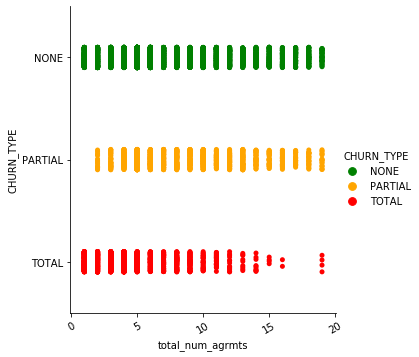

In [188]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib.ticker as tkr

color_dict = dict({'NONE':'green',
                   'PARTIAL':'orange',
                   'TOTAL':'red'
                  })

plt.figure(figsize=(15, 20))
#plot_df = basetable_jnl_display[basetable_jnl_display['total_bookings'] < 2000000]
#plot_df = basetable_jnl_display[basetable_jnl_display['total_mean_bookings'] < 500000]
#plot_df = basetable_jnl_display[basetable_jnl_display['total_bookings_per_year'] < 500000]
#plot_df = basetable_jnl_display[basetable_jnl_display['total_days_since_last_agreement'] < 3000]
plot_df = basetable_jnl_display[basetable_jnl_display['total_num_agrmts'] < 20]

g = sns.catplot(data=plot_df, 
                x='total_num_agrmts', y='CHURN_TYPE', hue='CHURN_TYPE', 
               palette=color_dict, legend='full', order=['NONE','PARTIAL','TOTAL'])
g.set_xticklabels(rotation=30)

for ax in g.axes[0]:
    ax.xaxis.set_major_formatter(
        tkr.FuncFormatter(reformat_large_tick_values))





# JOURNALS MODEL

### Identify if class imbalance exists

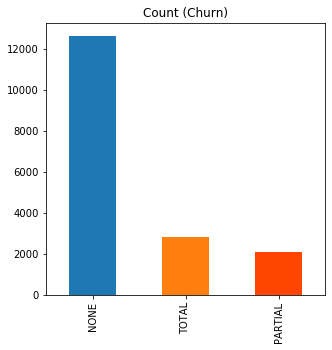

In [189]:
basetable_jnl_display.CHURN_TYPE.value_counts().plot(kind='bar', title='Count (Churn)', 
                                                     color=colors, figsize=(5,5));

## Resampling
A widely adopted technique for dealing with highly unbalanced datasets is called resampling. It consists of removing samples from the majority class (under-sampling) and / or adding more examples from the minority class (over-sampling).

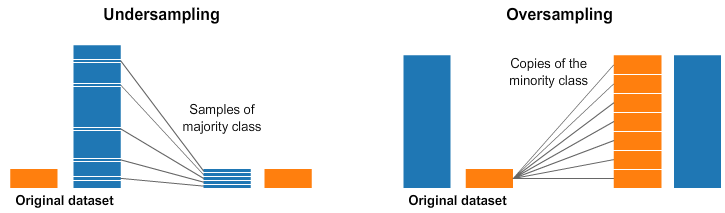

Despite the advantage of balancing classes, these techniques also have their weaknesses (there is no free lunch). The simplest implementation of over-sampling is to duplicate random records from the minority class, which can cause overfitting. In under-sampling, the simplest technique involves removing random records from the majority class, which can cause loss of information.

We implement a basic example, which uses the DataFrame.sample method to get random samples each class:

In [190]:
# Class count
count_class_NONE, count_class_PARTIAL, count_class_TOTAL = basetable_jnl_display.CHURN_TYPE.value_counts()

# Divide by class
df_class_NONE = basetable_jnl_display[basetable_jnl_display['CHURN_TYPE'] == 'NONE']
df_class_PARTIAL = basetable_jnl_display[basetable_jnl_display['CHURN_TYPE'] == 'PARTIAL']
df_class_TOTAL = basetable_jnl_display[basetable_jnl_display['CHURN_TYPE'] == 'TOTAL']

### Random under-sampling

Random under-sampling:
TOTAL      2813
PARTIAL    2091
NONE       2091
Name: CHURN_TYPE, dtype: int64


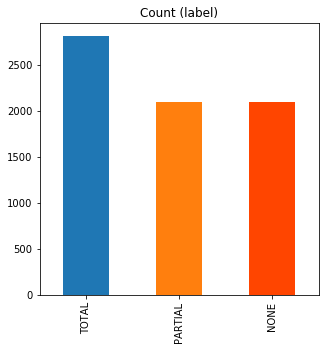

In [191]:
df_class_NONE_under = df_class_NONE.sample(count_class_TOTAL)
df_class_PARTIAL_under = df_class_PARTIAL.sample(count_class_TOTAL)

df_test_under = pd.concat([df_class_NONE_under, df_class_PARTIAL_under, df_class_TOTAL], axis=0)

print('Random under-sampling:')
print(df_test_under.CHURN_TYPE.value_counts())

df_test_under.CHURN_TYPE.value_counts().plot(kind='bar', title='Count (label)', 
                                             color=colors, figsize=(5,5));

## Random Over-sampling

Random over-sampling:
PARTIAL    12634
TOTAL      12634
NONE       12634
Name: CHURN_TYPE, dtype: int64


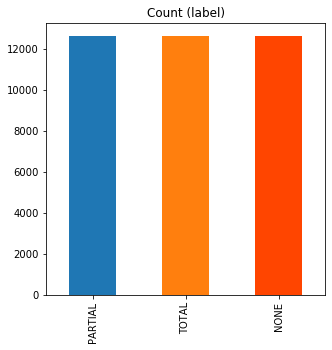

In [192]:
df_class_PARTIAL_over = df_class_PARTIAL.sample(count_class_NONE, replace=True)
df_class_TOTAL_over = df_class_TOTAL.sample(count_class_NONE, replace=True)
df_test_over = pd.concat([df_class_NONE, df_class_PARTIAL_over, df_class_TOTAL_over], axis=0)

print('Random over-sampling:')
print(df_test_over.CHURN_TYPE.value_counts())

df_test_over.CHURN_TYPE.value_counts().plot(kind='bar', title='Count (label)', 
                                            color=colors, figsize=(5,5));

In [193]:
# We work with random oversampling as this gives us more samples to train data
modeltable_jnl_display = df_test_over

In [194]:
modeltable_jnl_display = modeltable_jnl_display.set_index(['SIS Id  (Agreement SIS)', 'Product Line Level 2'])

### Variable encoding
We keep a dataframe for display as this helps to have a easily explainable features, at the same time for model development we want to have numeric variables
so we encode categorical varibles for model development. 

In [195]:
modeltable, le_dict = encode_labels(modeltable_jnl_display.copy(), ['over_million_year', 'Classification',
                                                      'CONSORTIUM', 'HIERARCHY_TYPE',
                                                      'cust_booking_trend', 'cust_prod_booking_trend',
                                                      'CHURN_TYPE','COUNTRY_CHILD',                                        
                                                      'jnl_usage_trend', '3_yr_usg_change',
                                                      'visits_trend', 'time_trend', 
                                                      'pageviews_trend','user_trend',
                                                      'SIZE', 'TIER','gerd_trend'
                                      ])

Here we can see that our target variable CHURN_TYPE is encoded as below: <br>
    0: NONE <br>
    1: PARTIAL<br>
    2: TOTAL<br>

In [196]:
le_dict['CHURN_TYPE'].inverse_transform([0,1,2])

array(['NONE', 'PARTIAL', 'TOTAL'], dtype=object)

# View sumary of dataframes

In [197]:
pd.set_option("display.max_rows", 90)
get_data_frame_summary(modeltable_jnl_display)

,index,unique_values,unique_counts,na_counts,data_type,percent_missing
0,total_bookings,"[[500708928.91848654, 90079946.57200013, 68692...",7131,0,float64,0
49,num_risks_Very Low,"[[0.0, 2.0, 1.0]]",3,0,float64,0
56,num_nps,"[[3.0, 1.0, 2.0, 18.0, 4.0, 6.0, 8.0, 19.0, 5....",27,0,float64,0
55,num_owners_x,"[[2.0, 12.0, 39.0, 1.0, 17.0, 88.0, 3.0, 6.0, ...",74,0,float64,0
54,mean_days_to_initial_response,"[[0.0, 0.8707693750000001, 1.231716775868241, ...",3394,0,float64,0
53,max_days_to_initial_response,"[[0.0, 5.20266, 47.1442, 98.3448, 38.4664, 80....",3390,0,float64,0
52,max_days_to_close,"[[0.0, 54.8378, 114.882, 170.49200000000002, 4...",3586,0,float64,0
51,mean_days_to_close,"[[0.0, 7.792073500000001, 2.4605359131313063, ...",3593,0,float64,0
50,num_incidents,"[[2.0, 23.0, 4490.0, 1.0, 3623.0, 369.0, 18117...",881,0,float64,0
48,num_risks_Medium,"[[0.0, 1.0, 31.0, 4.0, 34.0, 16.0, 23.0, 3.0, ...",81,0,float64,0


In [198]:
get_data_frame_summary(modeltable)

,index,unique_values,unique_counts,na_counts,data_type,percent_missing
0,total_bookings,"[[500708928.91848654, 90079946.57200013, 68692...",7131,0,float64,0
49,num_risks_Very Low,"[[0.0, 2.0, 1.0]]",3,0,float64,0
56,num_nps,"[[3.0, 1.0, 2.0, 18.0, 4.0, 6.0, 8.0, 19.0, 5....",27,0,float64,0
55,num_owners_x,"[[2.0, 12.0, 39.0, 1.0, 17.0, 88.0, 3.0, 6.0, ...",74,0,float64,0
54,mean_days_to_initial_response,"[[0.0, 0.8707693750000001, 1.231716775868241, ...",3394,0,float64,0
53,max_days_to_initial_response,"[[0.0, 5.20266, 47.1442, 98.3448, 38.4664, 80....",3390,0,float64,0
52,max_days_to_close,"[[0.0, 54.8378, 114.882, 170.49200000000002, 4...",3586,0,float64,0
51,mean_days_to_close,"[[0.0, 7.792073500000001, 2.4605359131313063, ...",3593,0,float64,0
50,num_incidents,"[[2.0, 23.0, 4490.0, 1.0, 3623.0, 369.0, 18117...",881,0,float64,0
48,num_risks_Medium,"[[0.0, 1.0, 31.0, 4.0, 34.0, 16.0, 23.0, 3.0, ...",81,0,float64,0


In [199]:
feature_names = np.setdiff1d(modeltable.columns, ['CHURN_TYPE'])
print(len(feature_names))
feature_names

77


array(['3_yr_mean_usage', '3_yr_usg_change', '3_yr_usg_change_pct',
       'CONSORTIUM', 'COUNTRY_CHILD', 'Classification', 'HIERARCHY_TYPE',
       'HIER_LEVEL', 'SIZE', 'TERRITORY_OWNERAGENT', 'TERRITORY_OWNERAM',
       'TERRITORY_OWNERCC', 'TERRITORY_OWNERCCSD', 'TERRITORY_OWNERCMD',
       'TERRITORY_OWNERCMM', 'TERRITORY_OWNERRAD', 'TERRITORY_OWNERRM',
       'TERRITORY_OWNERRSSD', 'TERRITORY_OWNERSD', 'TERRITORY_OWNERSSM',
       'TERRITORY_OWNERSSMCC', 'TIER', 'cust_booking_trend',
       'cust_prod_booking_trend', 'gerd_churn_year', 'gerd_trend',
       'gerd_yoy_change', 'jnl_usage_trend', 'max_days_to_close',
       'max_days_to_initial_response', 'max_hier', 'max_nps',
       'mean_days_to_close', 'mean_days_to_initial_response', 'mean_nps',
       'min_nps', 'num_activities_Email', 'num_activities_Face to Face',
       'num_activities_Online', 'num_activities_Other',
       'num_activities_Phone', 'num_activities_Virtual', 'num_child',
       'num_incidents', 'num_nps', 'n

In [200]:
modeltable[feature_names].describe()

,3_yr_mean_usage,3_yr_usg_change,3_yr_usg_change_pct,CONSORTIUM,COUNTRY_CHILD,Classification,HIERARCHY_TYPE,HIER_LEVEL,SIZE,TERRITORY_OWNERAGENT,...,total_days_since_first_agreement,total_days_since_last_agreement,total_length_of_relationship,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,user_trend,users_3_year_change,visits_3_year_change,visits_trend
count,37902,37902,37902,37902,37902,37902,37902,37902,37902,37902,...,37902,37902,37902,37902,37902,37902,37902,37902,37902,37902
mean,75219,3,586,1,23,1,0,0,1,0,...,1966,789,4,9869,7,5,0,0,0,0
std,233723,3,9262,0,13,1,0,1,1,0,...,500,360,2,46102,6,4,0,0,0,0
min,0,0,-100,0,0,0,0,0,0,0,...,467,128,1,-57413,1,0,0,0,0,0
25%,379,1,-1,1,14,0,0,0,1,0,...,1923,462,3,1461,4,3,0,0,0,0
50%,4409,2,8,1,19,0,0,0,1,0,...,1923,827,5,3060,5,5,0,0,0,0
75%,31597,6,44,1,36,1,1,1,2,0,...,2288,1192,5,5221,8,6,0,0,0,0
max,4315515,8,538350,1,42,6,1,5,3,1,...,3749,2653,9,2383492,100,71,0,0,0,0


In [201]:
rows = np.random.randint(2, size=len(modeltable)).astype('bool')

In [202]:
#sample = modeltable[rows]
#sample_display = modeltable_jnl_display[rows]
sample = modeltable
sample_display = modeltable_jnl_display
sample.shape
sample_display.shape

(37902, 78)

In [203]:
sample['CHURN_TYPE'].value_counts()

2    12634
1    12634
0    12634
Name: CHURN_TYPE, dtype: int64

## Reducing Dimensions

Here we will first plot the Pearson correlation heatmap and see the correlation of independent variables with the output variable CHURN. <br>
We will only select features that have correlation of above 0.5 (taking absolute value) with the output variable. <br>
The correlation coefficient has values between -1 to 1<br>
— A value closer to 0 implies weaker correlation (exact 0 implying no correlation)<br>
— A value closer to 1 implies stronger positive correlation<br>
— A value closer to -1 implies stronger negative correlation<br>

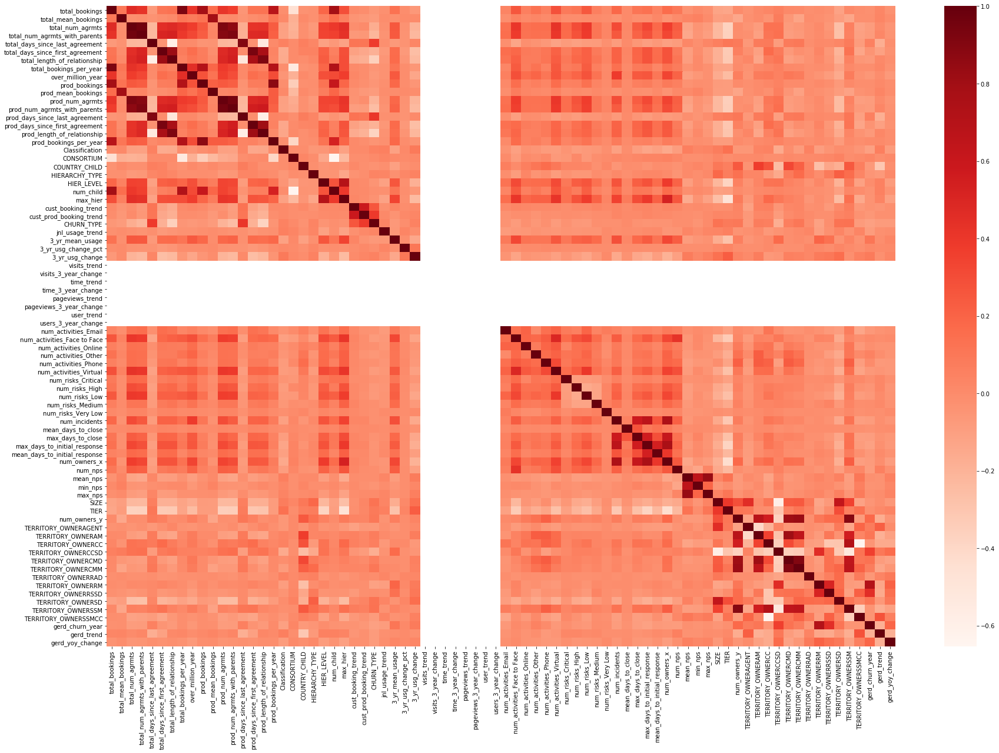

In [204]:
#Using Pearson Correlation
plt.figure(figsize=(30,20))
cor = sample.corr()
sns.heatmap(cor, annot=False, cmap=plt.cm.Reds)
plt.show()

In [205]:
# As these are Journals tere is no webtraffic data and hence you see white gaps

In [206]:
sample = sample.drop(['user_trend','users_3_year_change',
                      'visits_trend','visits_3_year_change',
                      'time_trend','time_3_year_change',
                      'pageviews_trend','pageviews_3_year_change'
                      ], axis=1)
cor = sample.corr()

In [207]:
#Correlation with output variable
cor_target = abs(cor["CHURN_TYPE"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target > 0.2]
relevant_features

total_num_agrmts_with_parents     0
total_days_since_last_agreement   0
total_length_of_relationship      0
prod_num_agrmts_with_parents      0
prod_days_since_last_agreement    0
prod_length_of_relationship       0
cust_booking_trend                0
cust_prod_booking_trend           0
CHURN_TYPE                        1
Name: CHURN_TYPE, dtype: float64

## Identify features highly correlated with each other

Keep only one variable if two variable are highly correlated with each other (>0.75)

In [208]:
TRESHOLD = 0.75

columns = np.full((cor.shape[0],), True, dtype=bool)
for i in range(cor.shape[0]):
    for j in range(i+1, cor.shape[0]):
        if cor.iloc[i,j] >= TRESHOLD:
            if columns[j]:
                columns[j] = False

selected_columns = sample.columns[columns]
sample = sample[selected_columns]
sample_display = sample_display[sample.columns]

In [209]:
sample.columns

Index(['total_bookings', 'total_mean_bookings', 'total_num_agrmts',
       'total_days_since_last_agreement', 'total_days_since_first_agreement',
       'over_million_year', 'Classification', 'CONSORTIUM', 'COUNTRY_CHILD',
       'HIERARCHY_TYPE', 'HIER_LEVEL', 'max_hier', 'cust_booking_trend',
       'cust_prod_booking_trend', 'CHURN_TYPE', 'jnl_usage_trend',
       '3_yr_mean_usage', '3_yr_usg_change_pct', '3_yr_usg_change',
       'num_activities_Email', 'num_activities_Face to Face',
       'num_activities_Online', 'num_activities_Other', 'num_activities_Phone',
       'num_activities_Virtual', 'num_risks_Critical', 'num_risks_High',
       'num_risks_Low', 'num_risks_Medium', 'num_risks_Very Low',
       'num_incidents', 'mean_days_to_close', 'max_days_to_close',
       'max_days_to_initial_response', 'mean_days_to_initial_response',
       'num_nps', 'mean_nps', 'min_nps', 'SIZE', 'TIER', 'num_owners_y',
       'TERRITORY_OWNERAGENT', 'TERRITORY_OWNERAM', 'TERRITORY_OWNERCC',
   

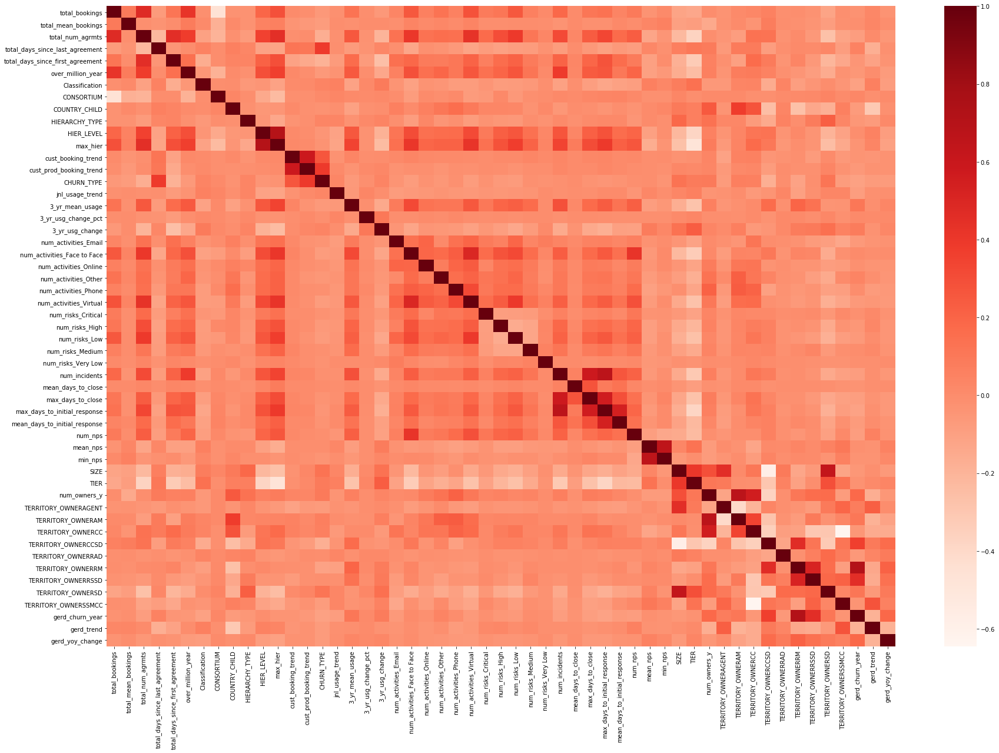

In [210]:
#Using Pearson Correlation
plt.figure(figsize=(30,20))
cor = sample.corr()
sns.heatmap(cor, annot=False, cmap=plt.cm.Reds)
plt.show()

In [211]:
X = sample.loc[:, sample.columns != 'CHURN_TYPE']
y = sample['CHURN_TYPE']

X_display = sample_display.loc[:, sample_display.columns != 'CHURN_TYPE']
y_display = sample_display['CHURN_TYPE']

# Following are the columns that we use in model development so these are the same columns that we will select in target for model application

In [212]:
X.columns

Index(['total_bookings', 'total_mean_bookings', 'total_num_agrmts',
       'total_days_since_last_agreement', 'total_days_since_first_agreement',
       'over_million_year', 'Classification', 'CONSORTIUM', 'COUNTRY_CHILD',
       'HIERARCHY_TYPE', 'HIER_LEVEL', 'max_hier', 'cust_booking_trend',
       'cust_prod_booking_trend', 'jnl_usage_trend', '3_yr_mean_usage',
       '3_yr_usg_change_pct', '3_yr_usg_change', 'num_activities_Email',
       'num_activities_Face to Face', 'num_activities_Online',
       'num_activities_Other', 'num_activities_Phone',
       'num_activities_Virtual', 'num_risks_Critical', 'num_risks_High',
       'num_risks_Low', 'num_risks_Medium', 'num_risks_Very Low',
       'num_incidents', 'mean_days_to_close', 'max_days_to_close',
       'max_days_to_initial_response', 'mean_days_to_initial_response',
       'num_nps', 'mean_nps', 'min_nps', 'SIZE', 'TIER', 'num_owners_y',
       'TERRITORY_OWNERAGENT', 'TERRITORY_OWNERAM', 'TERRITORY_OWNERCC',
       'TERRITORY

# XGB

In [213]:
import xgboost
import shap
import matplotlib.pylab as pl
from sklearn.model_selection import train_test_split
shap.initjs()

### Split the data between training and testing

In [214]:

# create a train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
d_train = xgboost.DMatrix(X_train, label=y_train)
d_test = xgboost.DMatrix(X_test, label=y_test)

Check the target variable

In [215]:
y_test

SIS Id  (Agreement SIS)  Product Line Level 2             
ECR-460261               Journals Electronic Subscriptions    1
ECR-438536               Journals Electronic Subscriptions    0
ECR-1076796              Journals Electronic Subscriptions    2
ECR-521136               Journals Electronic Subscriptions    1
ECR-1559                 Journal Level Sales                  0
                                                             ..
ECR-30892863             Journals Electronic Subscriptions    0
ECR-450201               Journals Electronic Subscriptions    2
ECR-2138                 Journal Level Sales                  1
ECR-56281                Journals Electronic Subscriptions    0
ECR-593012               Journals Electronic Subscriptions    2
Name: CHURN_TYPE, Length: 7581, dtype: int32

## Train Model

<b> Simple model without tuned parameters </b>

In [216]:
params = {
    'max_depth': 6,
    'objective': 'multi:softmax',  # error evaluation for multiclass training
    'num_class': 3,
    'n_gpus': 0
}

In [217]:
bst = xgboost.train(params, d_train)

In [218]:
pred = bst.predict(d_test)


In [219]:
pd.Series(pred).value_counts()

1    3372
2    2451
0    1758
dtype: int64

In [220]:
y_test.value_counts()

2    2585
0    2524
1    2472
Name: CHURN_TYPE, dtype: int64

In [221]:
from sklearn.metrics import classification_report

print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.93      0.65      0.76      2524
           1       0.71      0.97      0.82      2472
           2       0.92      0.88      0.90      2585

    accuracy                           0.83      7581
   macro avg       0.85      0.83      0.83      7581
weighted avg       0.86      0.83      0.83      7581



In [222]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, pred)
cm

array([[1632,  725,  167],
       [  56, 2399,   17],
       [  70,  248, 2267]], dtype=int64)

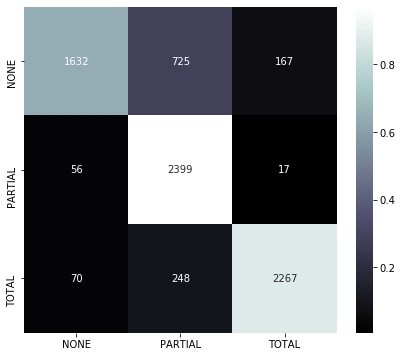

In [223]:
def plot_confusion_matrix(cm, classes, normalized=True, cmap='bone'):
    plt.figure(figsize=[7, 6])
    norm_cm = cm
    if normalized:
        norm_cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        sns.heatmap(norm_cm, annot=cm, fmt='g', xticklabels=classes, yticklabels=classes, cmap=cmap)
        #plt.savefig('confusion-matrix.png')

plot_confusion_matrix(cm, ['NONE', 'PARTIAL', 'TOTAL'])

### Above we see good level of accuracy precision and recall
We further tune the model by varying the hyperparameters of our model to ensure that we have a generalized model that is not overfitting the data

learning_rate: <br>
max_depth: Used to control over-fitting as higher depth will allow model to learn relations very specific to a particular sample <br>
n_estimators:  <br>
reg_lambda: L2 regularization term on weights, this is used to reduce overfitting <br>
gamma: Makes the algorithm conservative. A node is split only when the resulting split gives a positive reduction in the loss function. Gamma specifies the minimum loss reduction required to make a split <b>
    
random_state: The random number seed. <br>

In [224]:
# Tuned Model
xgbc = xgboost.XGBClassifier(learning_rate=0.3,
                    n_estimators=120,
                    max_depth=3,
                    min_child_weight=0,
                    gamma=0,
                    reg_lambda=1,
                    subsample=1,
                    colsample_bytree=0.75,
                    scale_pos_weight=1,
                    objective='multi:softprob',
                    num_class=3,
                    random_state=42)

In [225]:
start_time = time.time()
model = xgbc.fit(X_train, y_train, eval_metric='mlogloss')
print(f'Model training completed in {round((time.time() - start_time)/60, 2)} mins for {len(X_train)} samples')

Model training completed in 0.32 mins for 30321 samples


In [226]:
pred = model.predict(X_test)
proba = model.predict_proba(X_test)

In [227]:
from sklearn.metrics import classification_report

print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.93      0.75      0.83      2524
           1       0.78      0.95      0.86      2472
           2       0.93      0.91      0.92      2585

    accuracy                           0.87      7581
   macro avg       0.88      0.87      0.87      7581
weighted avg       0.88      0.87      0.87      7581



In [228]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, pred)
cm

array([[1889,  485,  150],
       [  80, 2358,   34],
       [  72,  168, 2345]], dtype=int64)

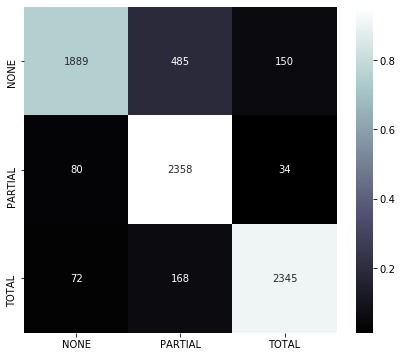

In [229]:
def plot_confusion_matrix(cm, classes, normalized=True, cmap='bone'):
    plt.figure(figsize=[7, 6])
    norm_cm = cm
    if normalized:
        norm_cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        sns.heatmap(norm_cm, annot=cm, fmt='g', xticklabels=classes, yticklabels=classes, cmap=cmap)
        #plt.savefig('confusion-matrix.png')

plot_confusion_matrix(cm, ['NONE', 'PARTIAL', 'TOTAL'])

In [230]:
pd.Series(pred).value_counts()

1    3011
2    2529
0    2041
dtype: int64

In [231]:
y_test.value_counts()

2    2585
0    2524
1    2472
Name: CHURN_TYPE, dtype: int64

In [232]:
proba

array([[5.0972617e-01, 3.8766548e-01, 1.0260835e-01],
       [2.8822461e-01, 1.4121391e-01, 5.7056147e-01],
       [6.8550126e-04, 1.4847741e-04, 9.9916601e-01],
       ...,
       [6.3425913e-03, 9.9334115e-01, 3.1621614e-04],
       [9.9814320e-01, 1.4910001e-03, 3.6576722e-04],
       [3.7847275e-01, 2.4375755e-01, 3.7776965e-01]], dtype=float32)

In [233]:
proba.max(axis=1)

array([0.50972617, 0.57056147, 0.999166  , ..., 0.99334115, 0.9981432 ,
       0.37847275], dtype=float32)

### Here After parameter tuning the model predictions are more accurate.

# Feature importance

<b> Feature Importance by Weights </b>

The number of times a feature is used to split the data across all trees.

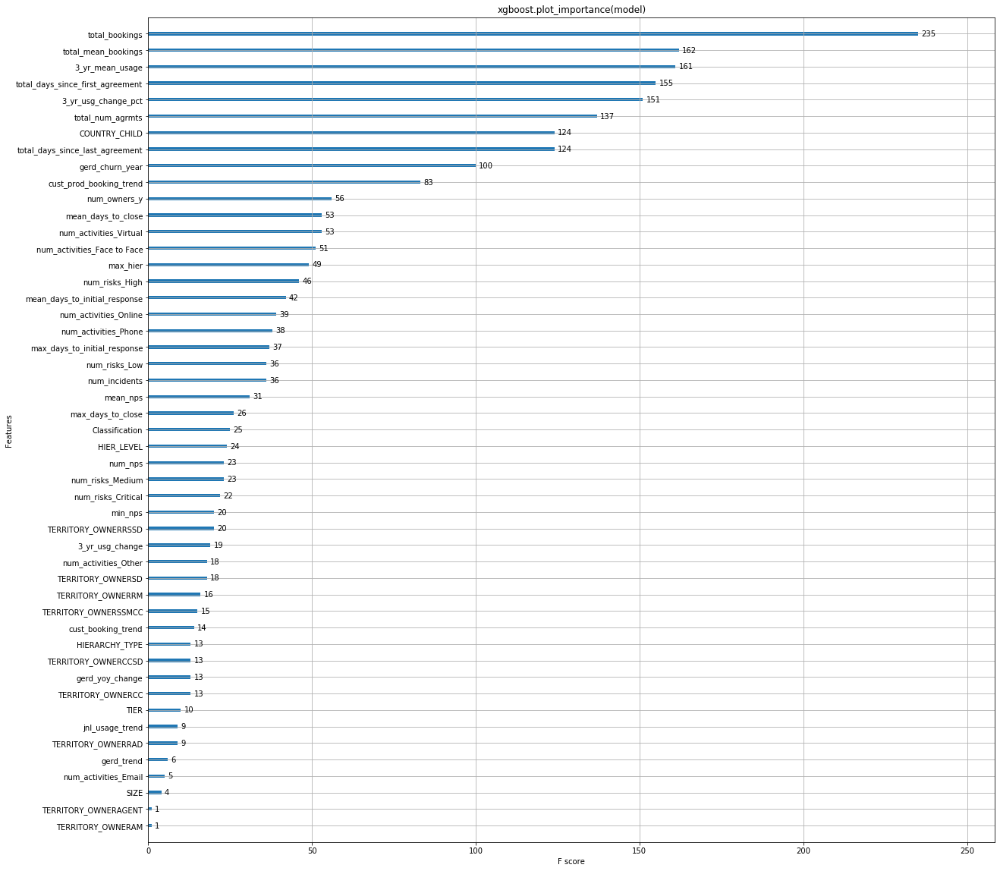

In [234]:
pl.rcParams['figure.figsize'] = [20, 20]

xgboost.plot_importance(model)
pl.title("xgboost.plot_importance(model)")
pl.show()

We see above that  the following features are important by weights <br>
1- prod_mean_Bookings <br>
2- prod_bookings <br>
3- prod_bookings_per_year <br>
4- total_mean_bookings <br>
5- prod_days_since_last_agreement <br>

<b> Feature Importance by Cover </b>

The number of times a feature is used to split the data across all trees weighted by the number of training data points that go through those splits.

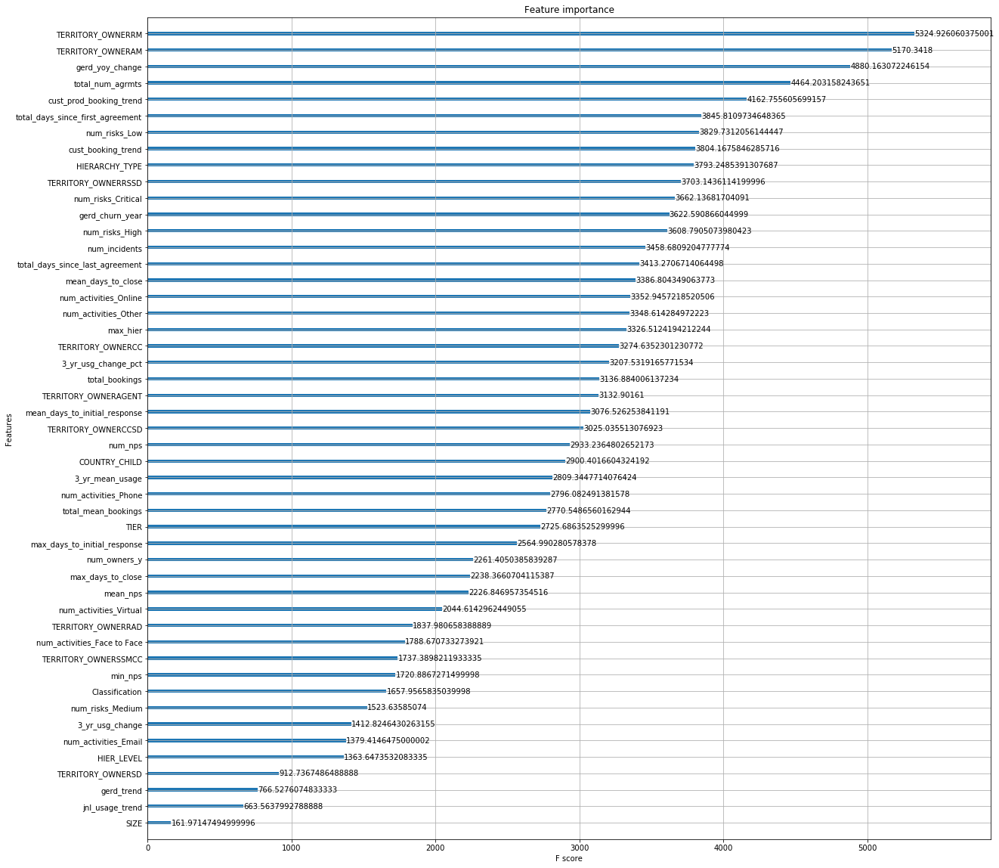

In [235]:
xgboost.plot_importance(model, importance_type="cover")

We see above that  the following features are important by cover <br>
1- TERRIOTRY_OWNERAGENT <br>
2- cust_prod_booking_trend <br>
3- visits_trend <br>
4- visits_3_year_change <br>
5- users_3_year_change <br>

<b> Feature Importance by Gain </b>

The average training loss reduction gained when using a feature for splitting.

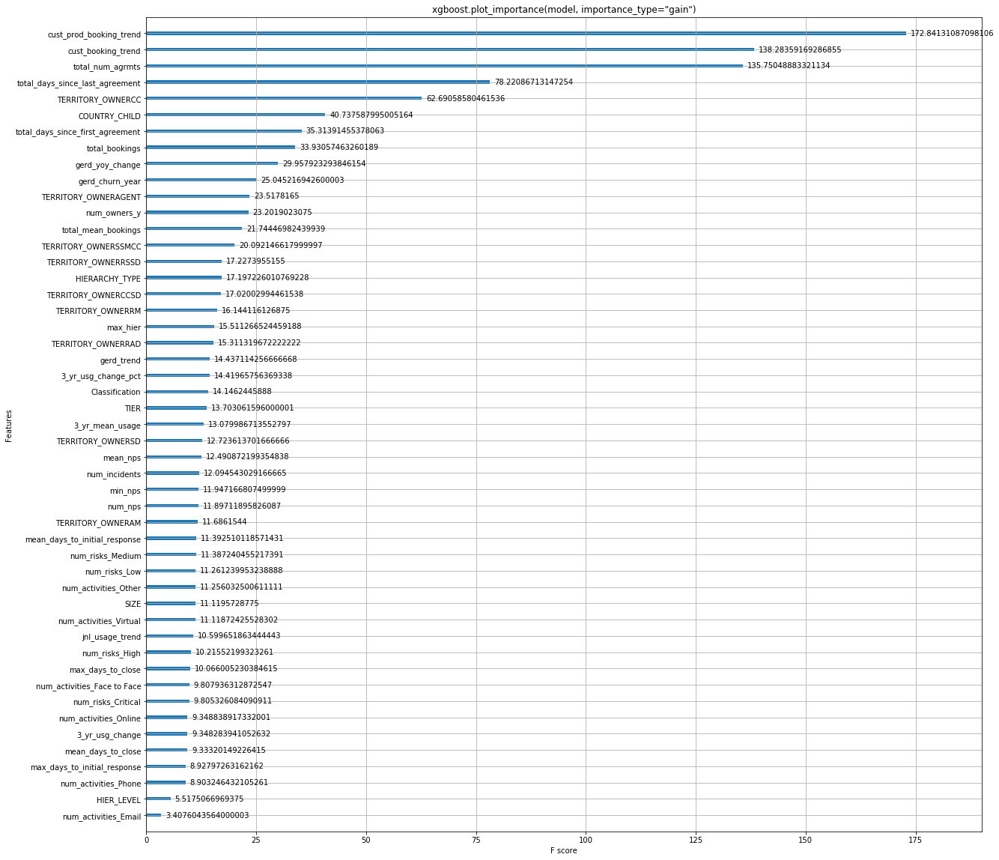

In [236]:
xgboost.plot_importance(model, importance_type="gain")
pl.title('xgboost.plot_importance(model, importance_type="gain")')
pl.show()

We see above that  the following features are important by gain <br>


## Explain predictions

In [237]:
# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


Visualize a single prediction
Note that we use the "display values" data frame so we get nice strings instead of category codes.

In [238]:
for which_class in range(0,3):
    display(shap.force_plot(explainer.expected_value[which_class], shap_values[which_class][1], X_display.iloc[1,:]))

<b>Visualize many predictions</b>
To keep the browser happy we only visualize 1,000 individuals.

In [239]:
shap.force_plot(explainer.expected_value[1], shap_values[1][:1000,:], X_display.iloc[:1000,:])

<b>Bar chart of mean importance </b>
This takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

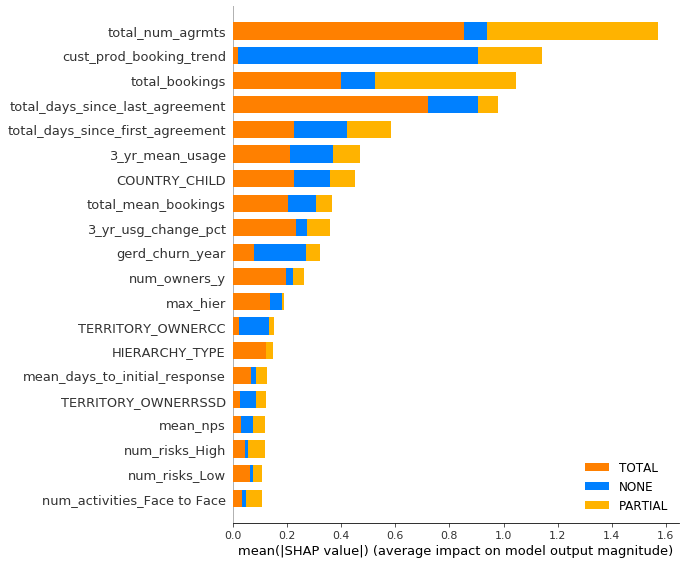

In [240]:
from matplotlib import colors as plt_colors

# class names
classes = ['NONE', 'PARTIAL', 'TOTAL']

# set RGB tuple per class
colors = [(0, 0.5, 1), (1, 0.7, 0), (1, 0.5, 0)]

# get class ordering from shap values
class_inds = np.argsort([-np.abs(shap_values[i]).mean() for i in range(len(shap_values))])

# create listed colormap
cmap = plt_colors.ListedColormap(np.array(colors)[class_inds])


# plot
shap.summary_plot(shap_values, X_display, color=cmap, class_names=classes)

<b> Variable most significat for predicting class 2 i.e. Total Churn </b>

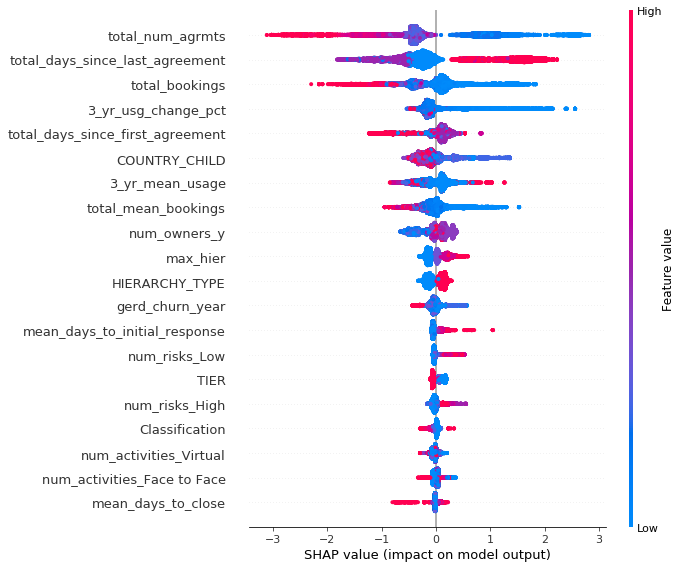

In [241]:
shap.summary_plot(shap_values[2], X)

<b> Variable most significat for predicting class 1 i.e. Partial Churn </b>

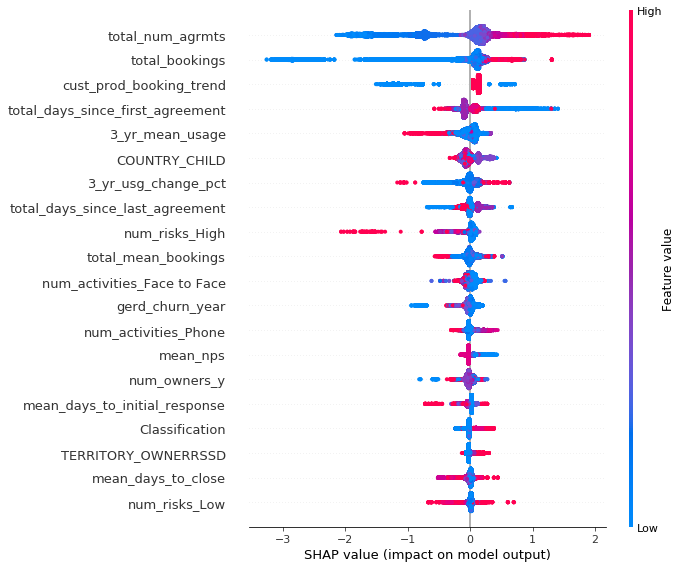

In [242]:
shap.summary_plot(shap_values[1], X)

SHAP Summary Plot
Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for records (i.e. customer x product combinations) in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. 

Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

# Simplified model

We keep the top 5 predictive variales in order to simplify the model

In [243]:
keep_features = ['total_num_agrmts', 'total_days_since_last_agreement', 'cust_prod_booking_trend', 'total_bookings',
                 '3_yr_mean_usage', '3_yr_usg_change_pct', 'gerd_churn_year', 'CHURN_TYPE']

In [244]:
simple_sample = sample[keep_features]
simple_sample_display = sample_display[keep_features]

X = simple_sample.loc[:, simple_sample.columns != 'CHURN_TYPE']
y = simple_sample['CHURN_TYPE']

X_display = simple_sample_display.loc[:, simple_sample_display.columns != 'CHURN_TYPE']
y_display = simple_sample_display['CHURN_TYPE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

In [245]:

xgbc = xgboost.XGBClassifier(learning_rate=0.5,
                    n_estimators=120,
                    max_depth=3,
                    min_child_weight=0,
                    gamma=0,
                    reg_lambda=1,
                    subsample=1,
                    colsample_bytree=0.75,
                    scale_pos_weight=1,
                    objective='multi:softprob',
                    num_class=3,
                    random_state=42)

In [246]:
start_time = time.time()
model = xgbc.fit(X_train, y_train, eval_metric='mlogloss')
print(f'Model training completed in {round((time.time() - start_time)/60, 2)} mins for {len(X_train)} samples')

Model training completed in 0.08 mins for 30321 samples


In [247]:
pred = model.predict(X_test)
proba = model.predict_proba(X_test)

In [248]:
simple_sample_display['CHURN_TYPE'].value_counts()

PARTIAL    12634
TOTAL      12634
NONE       12634
Name: CHURN_TYPE, dtype: int64

In [249]:
from sklearn.metrics import classification_report

print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.92      0.74      0.82      2524
           1       0.78      0.95      0.85      2472
           2       0.92      0.90      0.91      2585

    accuracy                           0.86      7581
   macro avg       0.87      0.86      0.86      7581
weighted avg       0.87      0.86      0.86      7581



In [250]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, pred)
cm

array([[1870,  512,  142],
       [  81, 2342,   49],
       [  86,  160, 2339]], dtype=int64)

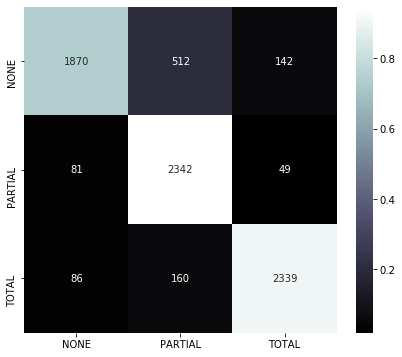

In [251]:
def plot_confusion_matrix(cm, classes, normalized=True, cmap='bone'):
    plt.figure(figsize=[7, 6])
    norm_cm = cm
    if normalized:
        norm_cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        sns.heatmap(norm_cm, annot=cm, fmt='g', xticklabels=classes, yticklabels=classes, cmap=cmap)
        #plt.savefig('confusion-matrix.png')

plot_confusion_matrix(cm, ['NONE', 'PARTIAL', 'TOTAL'])

In [252]:
pd.Series(pred).value_counts()

1    3014
2    2530
0    2037
dtype: int64

In [253]:
y_test.value_counts()

2    2585
0    2524
1    2472
Name: CHURN_TYPE, dtype: int64

## Explain predictions

In [254]:
# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

In [255]:
X.columns

Index(['total_num_agrmts', 'total_days_since_last_agreement',
       'cust_prod_booking_trend', 'total_bookings', '3_yr_mean_usage',
       '3_yr_usg_change_pct', 'gerd_churn_year'],
      dtype='object')

In [256]:
shap_df = pd.DataFrame(np.concatenate(shap_values))
shap_df.columns = X.columns
shap_df

,total_num_agrmts,total_days_since_last_agreement,cust_prod_booking_trend,total_bookings,3_yr_mean_usage,3_yr_usg_change_pct,gerd_churn_year
0,0,0,-0,1,0,-0,0
1,0,0,-0,1,0,-0,0
2,1,-1,-0,1,0,-0,1
3,1,-1,5,1,0,-0,1
4,-0,0,-0,0,0,-1,0
...,...,...,...,...,...,...,...
113701,1,-0,0,1,-0,-0,-0
113702,0,-1,0,2,-0,-0,-0
113703,-1,-0,0,-0,0,-0,-0
113704,1,1,0,0,0,-0,0


Visualize a single prediction
Note that we use the "display values" data frame so we get nice strings instead of category codes.

You can visualise how every feature and its values affects the prediction how the feature is pushing it higher or lower and the size of effect

In [257]:
shap.force_plot(explainer.expected_value[0], shap_values[0][1], X_display.iloc[1,:])

<b> Prediction explainer for each class <b>

In [258]:
for which_class in range(0,3):
    display(shap.force_plot(explainer.expected_value[which_class], shap_values[which_class][1], X_display.iloc[1,:]))

In [259]:
#Display all features and SHAP values
# df1=pd.DataFrame(data=shap_values[0][1].tolist(), columns=X.columns, index=[0])
# df2=pd.DataFrame(data=shap_values[1][1].tolist(), columns=X.columns, index=[1])
# df3=pd.DataFrame(data=shap_values[2][1].tolist(), columns=X.columns, index=[2])
# df=pd.concat([df1,df2,df3])
# display(df.transpose())

<b>Visualize many predictions</b>
To keep the browser happy we only visualize 1,000 individuals.

In [260]:
shap.force_plot(explainer.expected_value[2], shap_values[2][:1000,:], X_display.iloc[:1000,:])

<b>Bar chart of mean importance </b>
This takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

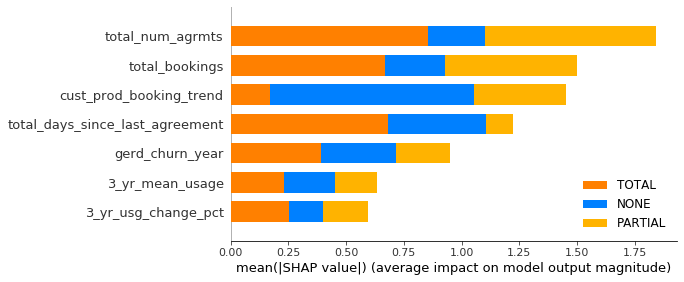

In [261]:
from matplotlib import colors as plt_colors

# class names
classes = ['NONE', 'PARTIAL', 'TOTAL']

# set RGB tuple per class
colors = [(0, 0.5, 1), (1, 0.7, 0), (1, 0.5, 0)]

# get class ordering from shap values
class_inds = np.argsort([-np.abs(shap_values[i]).mean() for i in range(len(shap_values))])

# create listed colormap
cmap = plt_colors.ListedColormap(np.array(colors)[class_inds])


# plot
shap.summary_plot(shap_values, X_display, color=cmap, class_names=classes)

<b> Variable most significat for predicting class 2 i.e. Total Churn </b>

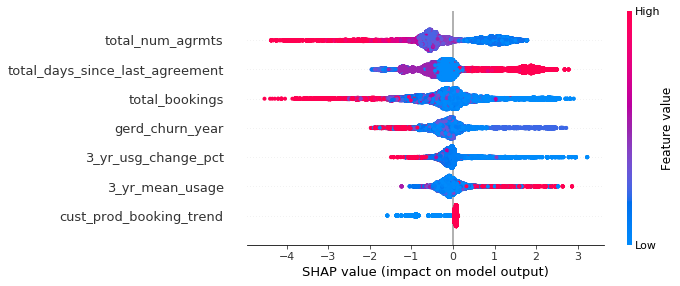

In [262]:
shap.summary_plot(shap_values[2], X)

<b> Variable most significat for predicting class 1 i.e. Partial Churn </b>

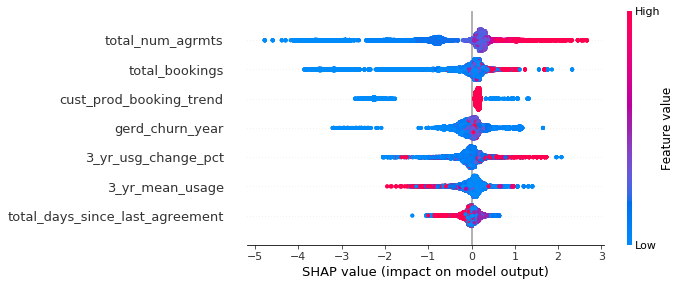

In [263]:
shap.summary_plot(shap_values[1], X)

## Explain predictions

 SHAP partial dependence plot for total_num_agrmts on TOTAL_CHURN


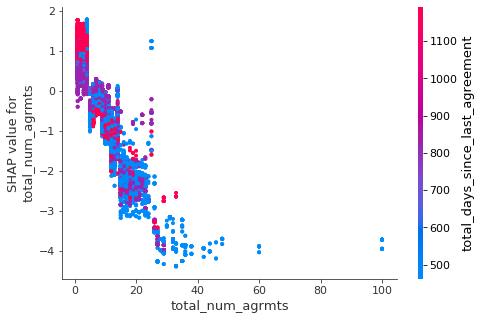

 SHAP partial dependence plot for total_num_agrmts on PARTIAL_CHURN


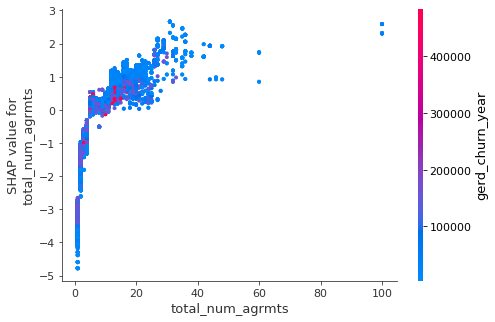

 SHAP partial dependence plot for total_days_since_last_agreement on TOTAL_CHURN


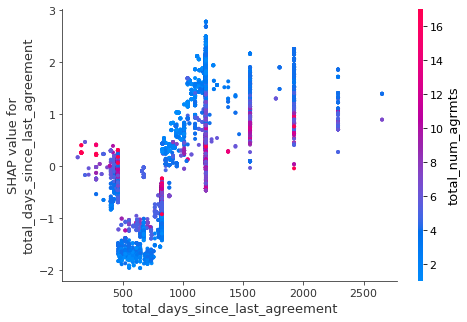

 SHAP partial dependence plot for total_days_since_last_agreement on PARTIAL_CHURN


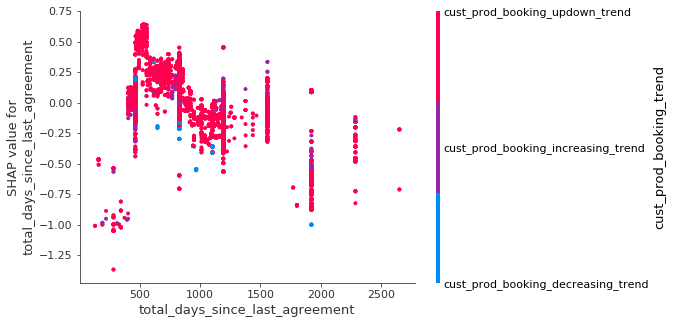

 SHAP partial dependence plot for cust_prod_booking_trend on TOTAL_CHURN


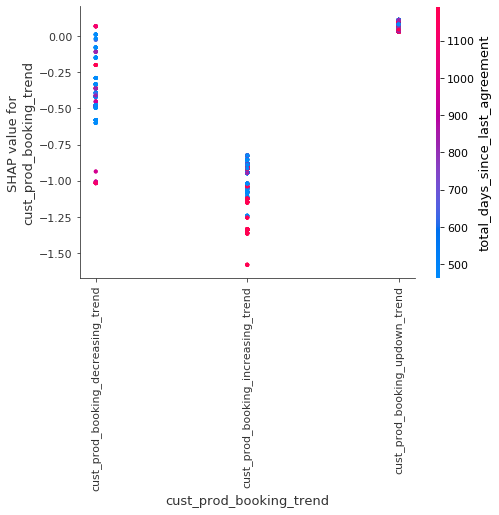

 SHAP partial dependence plot for cust_prod_booking_trend on PARTIAL_CHURN


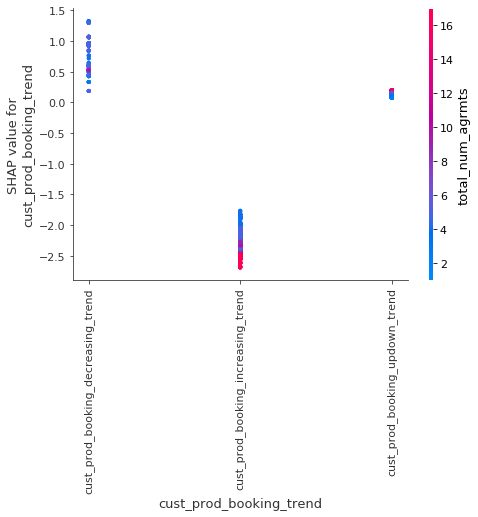

 SHAP partial dependence plot for total_bookings on TOTAL_CHURN


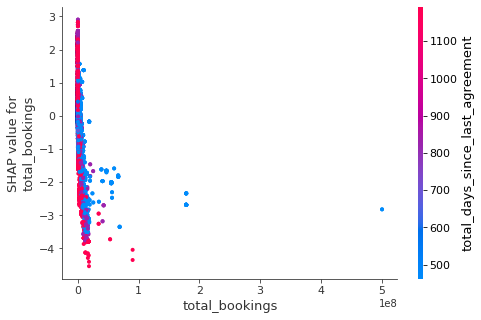

 SHAP partial dependence plot for total_bookings on PARTIAL_CHURN


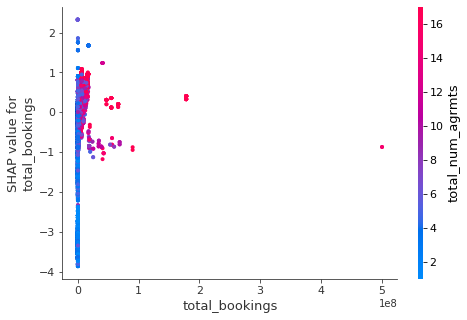

 SHAP partial dependence plot for 3_yr_mean_usage on TOTAL_CHURN


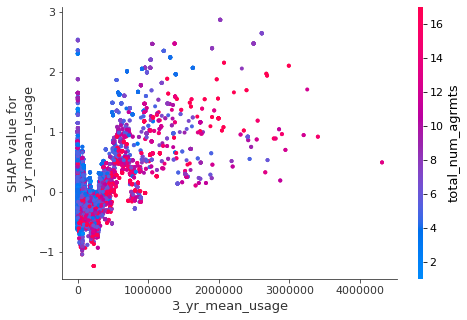

 SHAP partial dependence plot for 3_yr_mean_usage on PARTIAL_CHURN


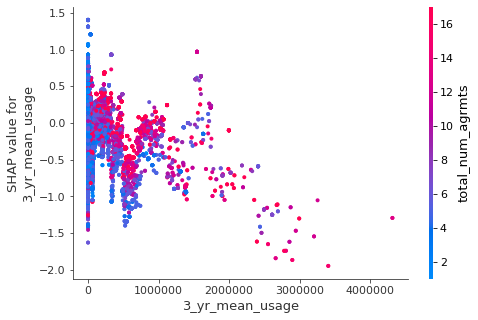

 SHAP partial dependence plot for 3_yr_usg_change_pct on TOTAL_CHURN


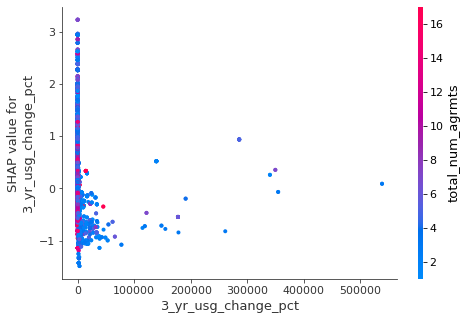

 SHAP partial dependence plot for 3_yr_usg_change_pct on PARTIAL_CHURN


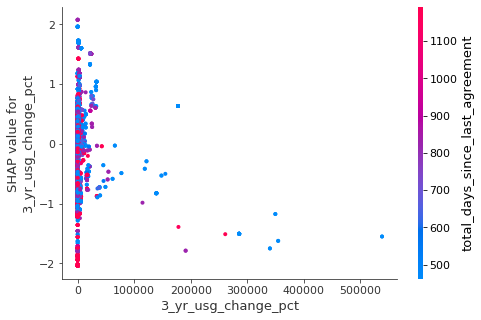

 SHAP partial dependence plot for gerd_churn_year on TOTAL_CHURN


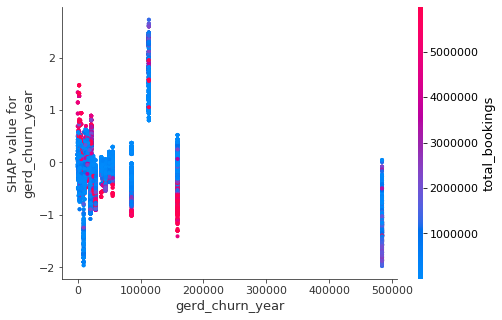

 SHAP partial dependence plot for gerd_churn_year on PARTIAL_CHURN


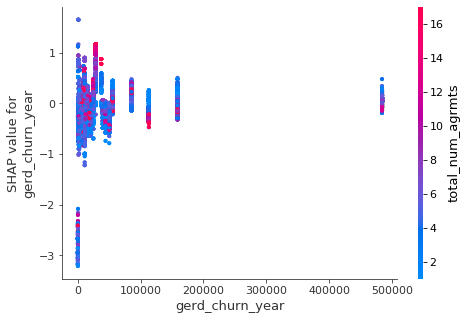

In [264]:
keep_features.remove('CHURN_TYPE')
for this_feature in keep_features:
#     print(f' SHAP partial dependence plot for {this_feature} on NO_CHURN')
#     shap.dependence_plot(this_feature, shap_values[0], X, display_features=X_display)
    
    print(f' SHAP partial dependence plot for {this_feature} on TOTAL_CHURN')
    shap.dependence_plot(this_feature, shap_values[2], X, display_features=X_display)
    
    print(f' SHAP partial dependence plot for {this_feature} on PARTIAL_CHURN')
    shap.dependence_plot(this_feature, shap_values[1], X, display_features=X_display)

In [265]:
# def wrapped_fn(one+):
#     print(example.shape)
#     df = pd.DataFrame(data=example.reshape(1,-1),
#             columns=X_test.columns)
        
#     pp = model.predict_proba(df)
#     print(pp)
#     return np.hstack(pp)

In [266]:
# pp = model.predict_proba(X_test.iloc[[1]])
# print(pp)
# np.hstack(pp)

In [267]:
# xgb_prediction(X_test.iloc[1,:])

In [268]:
# explainer_lime = LimeTabularExplainer(X_train.to_numpy(),
#                                       feature_names=X_train.columns.tolist(),
#                                       categorical_features=X_train.cust_prod_booking_trend,
#                                       categorical_names=['cust_prod_booking_trend'],
#                                       class_names=[0,1,2], mode='classification',
#                                       training_labels=y_train)

# Save Journals Model

In [269]:
# Serialise and save model
pickle.dump(model, open("../models/journals_xgb.pickle.dat", "wb"))

# SOLUTIONS MODEL DEVELOPMENT

### Identify if class imbalance exists

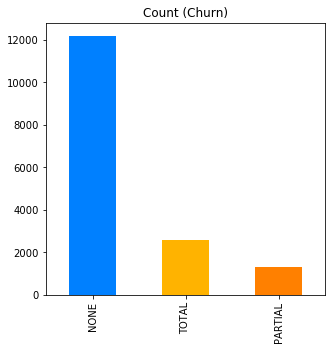

In [270]:
basetable_sln_display.CHURN_TYPE.value_counts().plot(kind='bar', title='Count (Churn)', 
                                                     color=colors, figsize=(5,5));

## Resampling
A widely adopted technique for dealing with highly unbalanced datasets is called resampling. It consists of removing samples from the majority class (under-sampling) and / or adding more examples from the minority class (over-sampling).

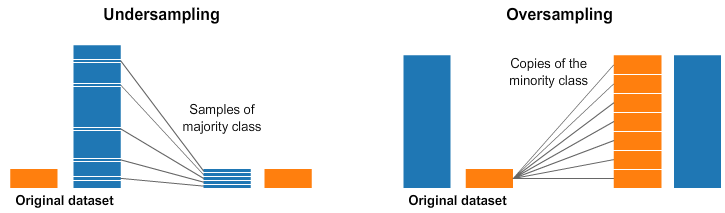

Despite the advantage of balancing classes, these techniques also have their weaknesses (there is no free lunch). The simplest implementation of over-sampling is to duplicate random records from the minority class, which can cause overfitting. In under-sampling, the simplest technique involves removing random records from the majority class, which can cause loss of information.

We implement a basic example, which uses the DataFrame.sample method to get random samples each class:

In [271]:
# Class count
count_class_NONE, count_class_PARTIAL, count_class_TOTAL = basetable_sln_display.CHURN_TYPE.value_counts()

# Divide by class
df_class_NONE = basetable_sln_display[basetable_sln_display['CHURN_TYPE'] == 'NONE']
df_class_PARTIAL = basetable_sln_display[basetable_sln_display['CHURN_TYPE'] == 'PARTIAL']
df_class_TOTAL = basetable_sln_display[basetable_sln_display['CHURN_TYPE'] == 'TOTAL']

### Random under-sampling

Random under-sampling:
TOTAL      2584
PARTIAL    1323
NONE       1323
Name: CHURN_TYPE, dtype: int64


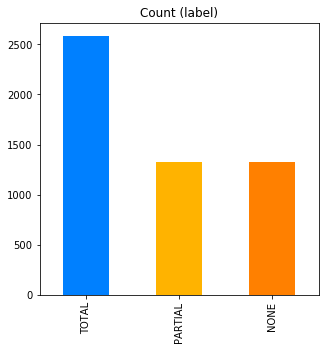

In [272]:
df_class_NONE_under = df_class_NONE.sample(count_class_TOTAL)
df_class_PARTIAL_under = df_class_PARTIAL.sample(count_class_TOTAL)

df_test_under = pd.concat([df_class_NONE_under, df_class_PARTIAL_under, df_class_TOTAL], axis=0)

print('Random under-sampling:')
print(df_test_under.CHURN_TYPE.value_counts())

df_test_under.CHURN_TYPE.value_counts().plot(kind='bar', title='Count (label)', 
                                             color=colors, figsize=(5,5));

## Random Over-sampling

Random over-sampling:
PARTIAL    12188
TOTAL      12188
NONE       12188
Name: CHURN_TYPE, dtype: int64


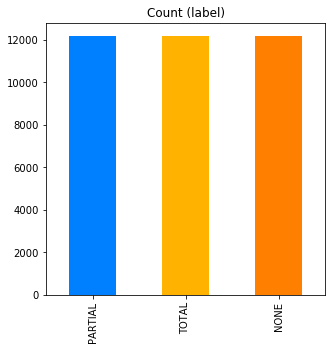

In [273]:
df_class_PARTIAL_over = df_class_PARTIAL.sample(count_class_NONE, replace=True)
df_class_TOTAL_over = df_class_TOTAL.sample(count_class_NONE, replace=True)
df_test_over = pd.concat([df_class_NONE, df_class_PARTIAL_over, df_class_TOTAL_over], axis=0)

print('Random over-sampling:')
print(df_test_over.CHURN_TYPE.value_counts())

df_test_over.CHURN_TYPE.value_counts().plot(kind='bar', title='Count (label)', 
                                            color=colors, figsize=(5,5));

In [274]:
# We work with random oversampling as this gives us more samples to train data
modeltable_sln_display = df_test_over

In [275]:
modeltable_sln_display = modeltable_sln_display.set_index(['SIS Id  (Agreement SIS)', 'Product Line Level 2'])

In [276]:
modeltable, le_dict = encode_labels(modeltable_sln_display.copy(), ['over_million_year', 'Classification',
                                                      'CONSORTIUM', 'HIERARCHY_TYPE',
                                                      'cust_booking_trend', 'cust_prod_booking_trend',
                                                      'CHURN_TYPE','COUNTRY_CHILD',                                        
                                                      'jnl_usage_trend', '3_yr_usg_change',
                                                      'visits_trend', 'time_trend', 
                                                      'pageviews_trend','user_trend',
                                                      'SIZE', 'TIER', 'gerd_trend'
                                      ])

In [277]:
# basetable = encode_columns(basetable, ['over_million_year', 'CONSORTIUM', 'HIERARCHY_TYPE'
#                                        'Classification', 'cust_trend', 'prod_trend',
#                                        'SIZE', 'TIER', 
#                                        'jnl_usage_trend', 'visits_trend', 'time_trend', 'pageviews_trend','user_trend' 
#                                       ])

# View sumary of dataframes

In [278]:
pd.set_option("display.max_rows", 90)
get_data_frame_summary(modeltable_sln_display)

,index,unique_values,unique_counts,na_counts,data_type,percent_missing
0,total_bookings,"[[43689779.066460006, 4424004.5325000025, 6223...",5559,0,float64,0
49,num_risks_Very Low,"[[0.0, 2.0, 1.0]]",3,0,float64,0
56,num_nps,"[[1.0, 2.0, 18.0, 3.0, 4.0, 6.0, 5.0, 7.0, 8.0...",27,0,float64,0
55,num_owners_x,"[[1.0, 39.0, 17.0, 88.0, 3.0, 6.0, 65.0, 8.0, ...",74,0,float64,0
54,mean_days_to_initial_response,"[[0.0, 1.231716775868241, 2.0943820554862835, ...",2693,0,float64,0
53,max_days_to_initial_response,"[[0.0, 47.1442, 98.3448, 38.4664, 80.4874, 2.3...",2693,0,float64,0
52,max_days_to_close,"[[0.0, 114.882, 170.49200000000002, 49.0646, 8...",2882,0,float64,0
51,mean_days_to_close,"[[0.0, 2.4605359131313063, 4.79215498658844, 4...",2885,0,float64,0
50,num_incidents,"[[1.0, 4490.0, 3623.0, 369.0, 18117.0, 20.0, 4...",828,0,float64,0
48,num_risks_Medium,"[[1.0, 0.0, 4.0, 34.0, 23.0, 3.0, 67.0, 2.0, 1...",81,0,float64,0


In [279]:
get_data_frame_summary(modeltable)

,index,unique_values,unique_counts,na_counts,data_type,percent_missing
0,total_bookings,"[[43689779.066460006, 4424004.5325000025, 6223...",5559,0,float64,0
49,num_risks_Very Low,"[[0.0, 2.0, 1.0]]",3,0,float64,0
56,num_nps,"[[1.0, 2.0, 18.0, 3.0, 4.0, 6.0, 5.0, 7.0, 8.0...",27,0,float64,0
55,num_owners_x,"[[1.0, 39.0, 17.0, 88.0, 3.0, 6.0, 65.0, 8.0, ...",74,0,float64,0
54,mean_days_to_initial_response,"[[0.0, 1.231716775868241, 2.0943820554862835, ...",2693,0,float64,0
53,max_days_to_initial_response,"[[0.0, 47.1442, 98.3448, 38.4664, 80.4874, 2.3...",2693,0,float64,0
52,max_days_to_close,"[[0.0, 114.882, 170.49200000000002, 49.0646, 8...",2882,0,float64,0
51,mean_days_to_close,"[[0.0, 2.4605359131313063, 4.79215498658844, 4...",2885,0,float64,0
50,num_incidents,"[[1.0, 4490.0, 3623.0, 369.0, 18117.0, 20.0, 4...",828,0,float64,0
48,num_risks_Medium,"[[1.0, 0.0, 4.0, 34.0, 23.0, 3.0, 67.0, 2.0, 1...",81,0,float64,0


In [280]:
# feature_names = ['bookings', 'num_contracts', 'num_parents', 'days_since_last_agreement', 'length_of_relationship',
#                  'mean_visits', 'mean_time_spent', 'mean_page_views','mean_active_users']

feature_names = np.setdiff1d(modeltable.columns, ['CHURN_TYPE'])
print(len(feature_names))
feature_names

77


array(['3_yr_mean_usage', '3_yr_usg_change', '3_yr_usg_change_pct',
       'CONSORTIUM', 'COUNTRY_CHILD', 'Classification', 'HIERARCHY_TYPE',
       'HIER_LEVEL', 'SIZE', 'TERRITORY_OWNERAGENT', 'TERRITORY_OWNERAM',
       'TERRITORY_OWNERCC', 'TERRITORY_OWNERCCSD', 'TERRITORY_OWNERCMD',
       'TERRITORY_OWNERCMM', 'TERRITORY_OWNERRAD', 'TERRITORY_OWNERRM',
       'TERRITORY_OWNERRSSD', 'TERRITORY_OWNERSD', 'TERRITORY_OWNERSSM',
       'TERRITORY_OWNERSSMCC', 'TIER', 'cust_booking_trend',
       'cust_prod_booking_trend', 'gerd_churn_year', 'gerd_trend',
       'gerd_yoy_change', 'jnl_usage_trend', 'max_days_to_close',
       'max_days_to_initial_response', 'max_hier', 'max_nps',
       'mean_days_to_close', 'mean_days_to_initial_response', 'mean_nps',
       'min_nps', 'num_activities_Email', 'num_activities_Face to Face',
       'num_activities_Online', 'num_activities_Other',
       'num_activities_Phone', 'num_activities_Virtual', 'num_child',
       'num_incidents', 'num_nps', 'n

In [281]:
modeltable[feature_names].describe()

,3_yr_mean_usage,3_yr_usg_change,3_yr_usg_change_pct,CONSORTIUM,COUNTRY_CHILD,Classification,HIERARCHY_TYPE,HIER_LEVEL,SIZE,TERRITORY_OWNERAGENT,...,total_days_since_first_agreement,total_days_since_last_agreement,total_length_of_relationship,total_mean_bookings,total_num_agrmts,total_num_agrmts_with_parents,user_trend,users_3_year_change,visits_3_year_change,visits_trend
count,36564,36564,36564,36564,36564,36564,36564,36564,36564,36564,...,36564,36564,36564,36564,36564,36564,36564,36564,36564,36564
mean,0,0,0,1,25,1,0,1,1,0,...,1862,688,4,15864,12,9,1,219,400,1
std,0,0,0,0,15,1,0,1,0,0,...,561,313,2,31349,12,10,1,9024,16323,1
min,0,0,0,0,0,0,0,0,0,0,...,463,97,1,-33179,1,0,0,-100,-100,0
25%,0,0,0,1,12,0,0,0,1,0,...,1558,462,2,3499,4,2,0,0,0,0
50%,0,0,0,1,26,0,0,0,1,0,...,1923,554,4,9098,7,5,0,0,0,0
75%,0,0,0,1,41,1,1,1,1,0,...,2288,827,5,17288,16,12,0,0,0,0
max,0,0,0,1,42,6,1,5,3,1,...,3810,2653,10,849151,87,81,3,1061400,1930600,3


In [282]:
modeltable.shape

(36564, 78)

In [283]:
rows = np.random.randint(2, size=len(modeltable)).astype('bool')

In [284]:
#sample = modeltable[rows]
#sample_display = modeltable_jnl_display[rows]
sample = modeltable
sample_display = modeltable_sln_display
sample.shape
sample_display.shape

(36564, 78)

In [285]:
sample['CHURN_TYPE'].value_counts()

2    12188
1    12188
0    12188
Name: CHURN_TYPE, dtype: int64

## Reducing Dimensions

Here we will first plot the Pearson correlation heatmap and see the correlation of independent variables with the output variable CHURN. 
We will only select features that have correlation of above 0.5 (taking absolute value) with the output variable.
The correlation coefficient has values between -1 to 1
— A value closer to 0 implies weaker correlation (exact 0 implying no correlation)
— A value closer to 1 implies stronger positive correlation
— A value closer to -1 implies stronger negative correlation

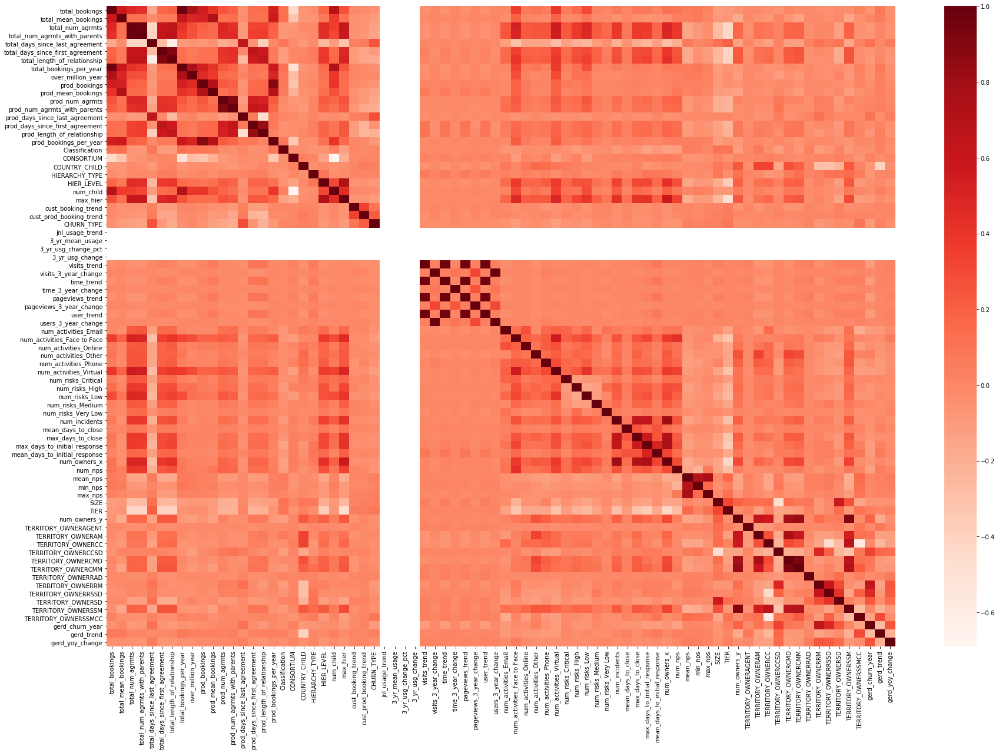

In [286]:
#Using Pearson Correlation
plt.figure(figsize=(30,20))
cor = sample.corr()
sns.heatmap(cor, annot=False, cmap=plt.cm.Reds)
plt.show()

In [287]:
# As these are Solutions tere is no usage data and hence you see white gaps

In [288]:
sample = sample.drop(['jnl_usage_trend','3_yr_mean_usage',
                      '3_yr_usg_change_pct','3_yr_usg_change'
                      ], axis=1)
cor = sample.corr()

In [289]:
#Correlation with output variable
cor_target = abs(cor["CHURN_TYPE"])
#Selecting highly correlated features
relevant_features = cor_target[cor_target > 0.2]
relevant_features

total_days_since_last_agreement   0
prod_days_since_last_agreement    0
prod_length_of_relationship       0
cust_prod_booking_trend           0
CHURN_TYPE                        1
Name: CHURN_TYPE, dtype: float64

## Identify features highly correlated with each other

In [290]:
TRESHOLD = 0.75

columns = np.full((cor.shape[0],), True, dtype=bool)
for i in range(cor.shape[0]):
    for j in range(i+1, cor.shape[0]):
        if cor.iloc[i,j] >= TRESHOLD:
            if columns[j]:
                columns[j] = False

selected_columns = sample.columns[columns]
sample = sample[selected_columns]
sample_display = sample_display[sample.columns]

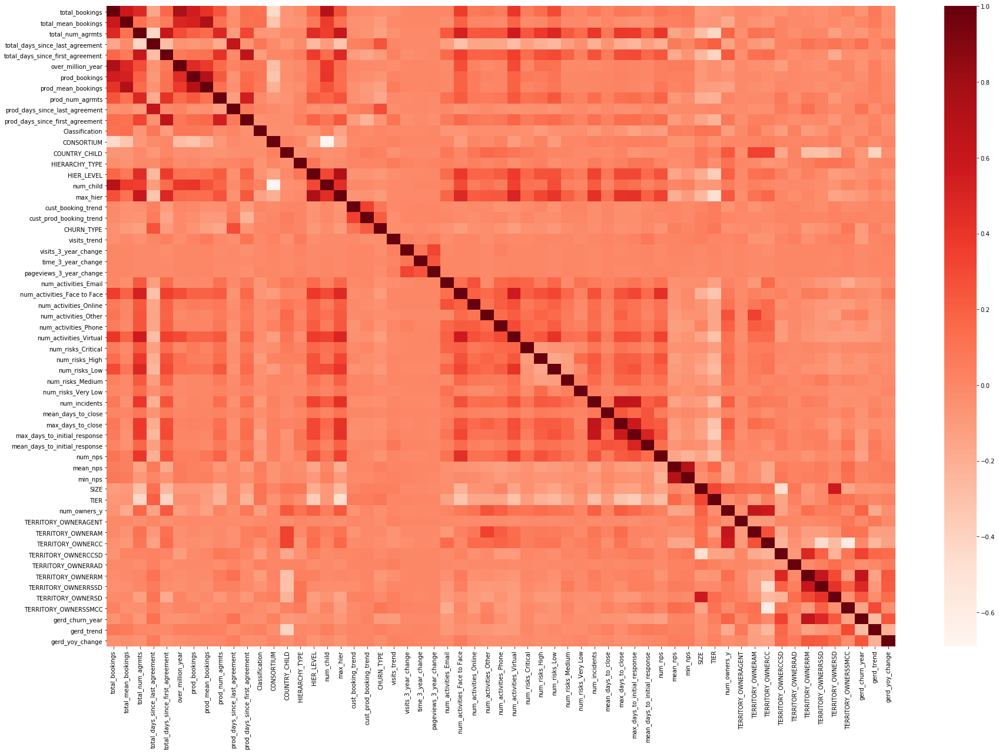

In [291]:
#Using Pearson Correlation
plt.figure(figsize=(30,20))
cor = sample.corr()
sns.heatmap(cor, annot=False, cmap=plt.cm.Reds)
plt.show()

In [292]:
X = sample.loc[:, sample.columns != 'CHURN_TYPE']
y = sample['CHURN_TYPE']

X_display = sample_display.loc[:, sample_display.columns != 'CHURN_TYPE']
y_display = sample_display['CHURN_TYPE']

In [293]:
X.columns

Index(['total_bookings', 'total_mean_bookings', 'total_num_agrmts',
       'total_days_since_last_agreement', 'total_days_since_first_agreement',
       'over_million_year', 'prod_bookings', 'prod_mean_bookings',
       'prod_num_agrmts', 'prod_days_since_last_agreement',
       'prod_days_since_first_agreement', 'Classification', 'CONSORTIUM',
       'COUNTRY_CHILD', 'HIERARCHY_TYPE', 'HIER_LEVEL', 'num_child',
       'max_hier', 'cust_booking_trend', 'cust_prod_booking_trend',
       'visits_trend', 'visits_3_year_change', 'time_3_year_change',
       'pageviews_3_year_change', 'num_activities_Email',
       'num_activities_Face to Face', 'num_activities_Online',
       'num_activities_Other', 'num_activities_Phone',
       'num_activities_Virtual', 'num_risks_Critical', 'num_risks_High',
       'num_risks_Low', 'num_risks_Medium', 'num_risks_Very Low',
       'num_incidents', 'mean_days_to_close', 'max_days_to_close',
       'max_days_to_initial_response', 'mean_days_to_initial_resp

# XGB

In [294]:
import xgboost
import shap
import matplotlib.pylab as pl
from sklearn.model_selection import train_test_split
shap.initjs()

In [295]:

# create a train/test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)
d_train = xgboost.DMatrix(X_train, label=y_train)
d_test = xgboost.DMatrix(X_test, label=y_test)

In [296]:
y_test

SIS Id  (Agreement SIS)  Product Line Level 2
ECR-1758                 Reaxys                  1
ECR-932991               Geofacets               0
ECR-304                  Pure                    1
ECR-384287               eBooks                  1
ECR-396881               Knovel                  2
                                                ..
ECR-10257289             Digital Commons         2
ECR-332397               Funding Solutions       0
ECR-413742               Reaxys                  0
ECR-1041506              Reaxys                  1
ECR-178                  SCOPUS                  0
Name: CHURN_TYPE, Length: 7313, dtype: int32

## Train Model

<b> Simple model without tuned parameters </b>

In [297]:
params = {
    'max_depth': 6,
    'objective': 'multi:softmax',  # error evaluation for multiclass training
    'num_class': 3,
    'n_gpus': 0
}

In [298]:
bst = xgboost.train(params, d_train)

In [299]:
pred = bst.predict(d_test)


In [300]:
pd.Series(pred).value_counts()

1    3117
2    2507
0    1689
dtype: int64

In [301]:
y_test.value_counts()

2    2516
0    2400
1    2397
Name: CHURN_TYPE, dtype: int64

In [302]:
from sklearn.metrics import classification_report

print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.90      0.64      0.75      2400
           1       0.72      0.94      0.81      2397
           2       0.93      0.92      0.92      2516

    accuracy                           0.83      7313
   macro avg       0.85      0.83      0.83      7313
weighted avg       0.85      0.83      0.83      7313



In [303]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, pred)
cm

array([[1526,  733,  141],
       [ 110, 2244,   43],
       [  53,  140, 2323]], dtype=int64)

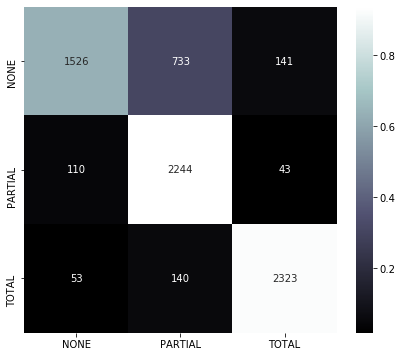

In [304]:
def plot_confusion_matrix(cm, classes, normalized=True, cmap='bone'):
    plt.figure(figsize=[7, 6])
    norm_cm = cm
    if normalized:
        norm_cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        sns.heatmap(norm_cm, annot=cm, fmt='g', xticklabels=classes, yticklabels=classes, cmap=cmap)
        #plt.savefig('confusion-matrix.png')

plot_confusion_matrix(cm, ['NONE', 'PARTIAL', 'TOTAL'])

### Above we see good level of accuracy precision and recall

### Below is a model where we tune learning rate, regularisation lambda and other params to improve the model

In [305]:
xgbc = xgboost.XGBClassifier(learning_rate=0.5,
                             n_estimators=120, 
                             max_depth=3,
                             gamma=0,
                             reg_lambda=1,
                             subsample=1,
                             colsample_bytree=0.75,
                             scale_pos_weight=1,                             
                             objective='multi:softprob',
                             num_class=3,random_state=42)

In [306]:
model = xgbc.fit(X_train, y_train, eval_metric='mlogloss')


In [307]:
pred = model.predict(X_test)
proba = model.predict_proba(X_test)

In [308]:
from sklearn.metrics import classification_report

print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.96      0.80      0.87      2400
           1       0.85      0.98      0.91      2397
           2       0.96      0.97      0.96      2516

    accuracy                           0.92      7313
   macro avg       0.92      0.92      0.92      7313
weighted avg       0.92      0.92      0.92      7313



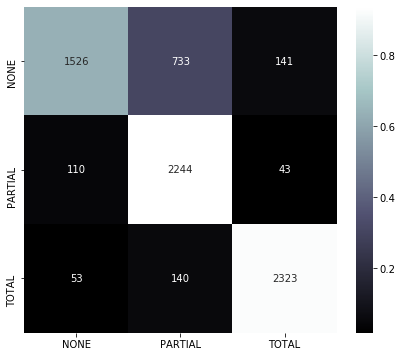

In [309]:
plot_confusion_matrix(cm, ['NONE', 'PARTIAL', 'TOTAL'])

In [310]:
pd.Series(pred).value_counts()

1    2750
2    2561
0    2002
dtype: int64

In [311]:
y_test.value_counts()

2    2516
0    2400
1    2397
Name: CHURN_TYPE, dtype: int64

In [312]:
proba

array([[1.5630624e-01, 8.1558704e-01, 2.8106706e-02],
       [9.3961591e-01, 5.6471091e-02, 3.9130487e-03],
       [2.2373880e-01, 7.5303227e-01, 2.3228928e-02],
       ...,
       [7.9541785e-01, 6.7048571e-03, 1.9787724e-01],
       [1.4263551e-01, 8.3368635e-01, 2.3678169e-02],
       [9.9822551e-01, 1.5445675e-03, 2.2986864e-04]], dtype=float32)

In [313]:
proba.max(axis=1)

array([0.81558704, 0.9396159 , 0.75303227, ..., 0.79541785, 0.83368635,
       0.9982255 ], dtype=float32)

### Here After parameter tuning the model predictions are more accurate.

In [314]:
# Classic feature attribution

<b> Feature Importance by Weights </b>

The number of times a feature is used to split the data across all trees.

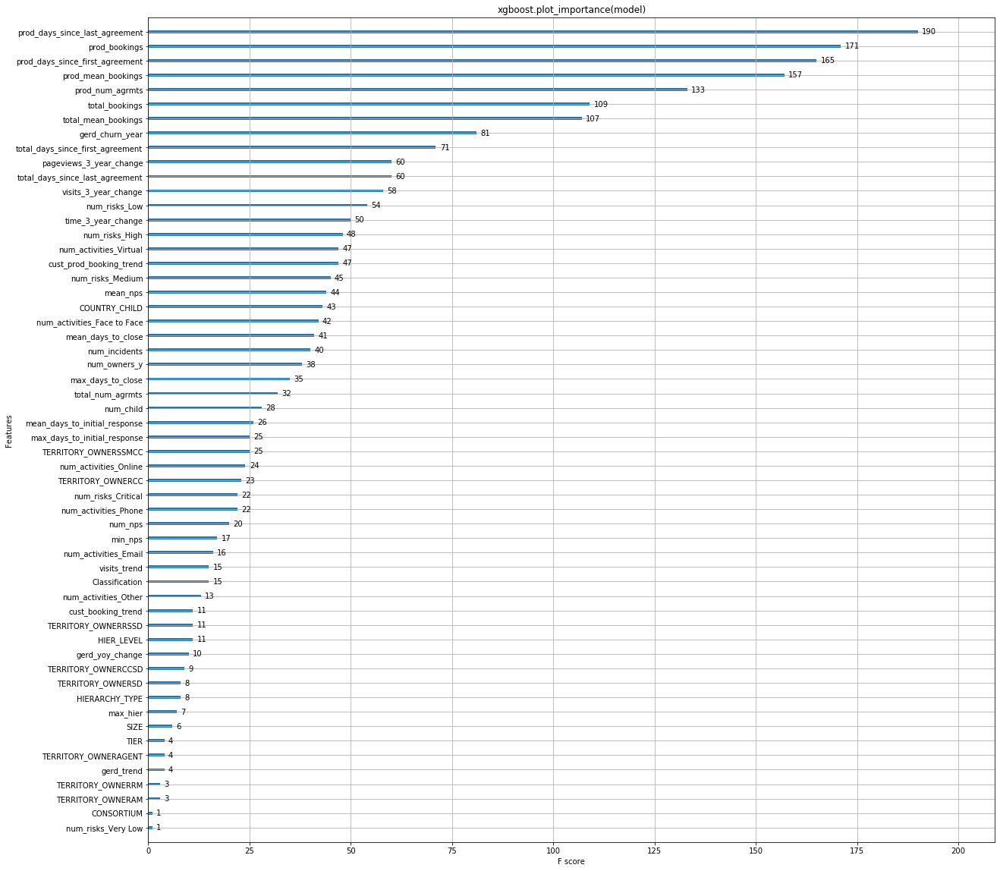

In [315]:
pl.rcParams['figure.figsize'] = [20, 20]

xgboost.plot_importance(model)
pl.title("xgboost.plot_importance(model)")
pl.show()

We see above that  the following features are important by weights <br>
1- prod_mean_Bookings <br>
2- prod_bookings <br>
3- prod_bookings_per_year <br>
4- total_mean_bookings <br>
5- prod_days_since_last_agreement <br>

<b> Feature Importance by Cover </b>

The number of times a feature is used to split the data across all trees weighted by the number of training data points that go through those splits.

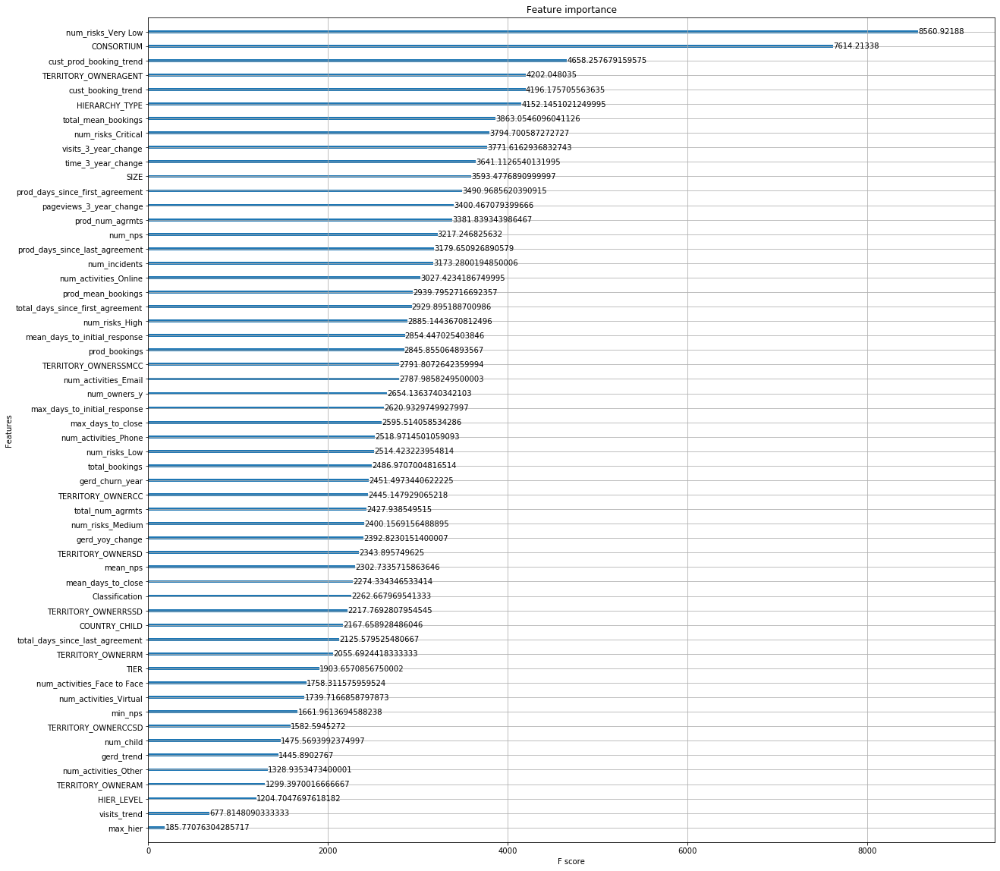

In [316]:
xgboost.plot_importance(model, importance_type="cover")

We see above that  the following features are important by cover <br>
1- TERRIOTRY_OWNERAGENT <br>
2- cust_prod_booking_trend <br>
3- visits_trend <br>
4- visits_3_year_change <br>
5- users_3_year_change <br>

<b> Feature Importance by Gain </b>

The average training loss reduction gained when using a feature for splitting.

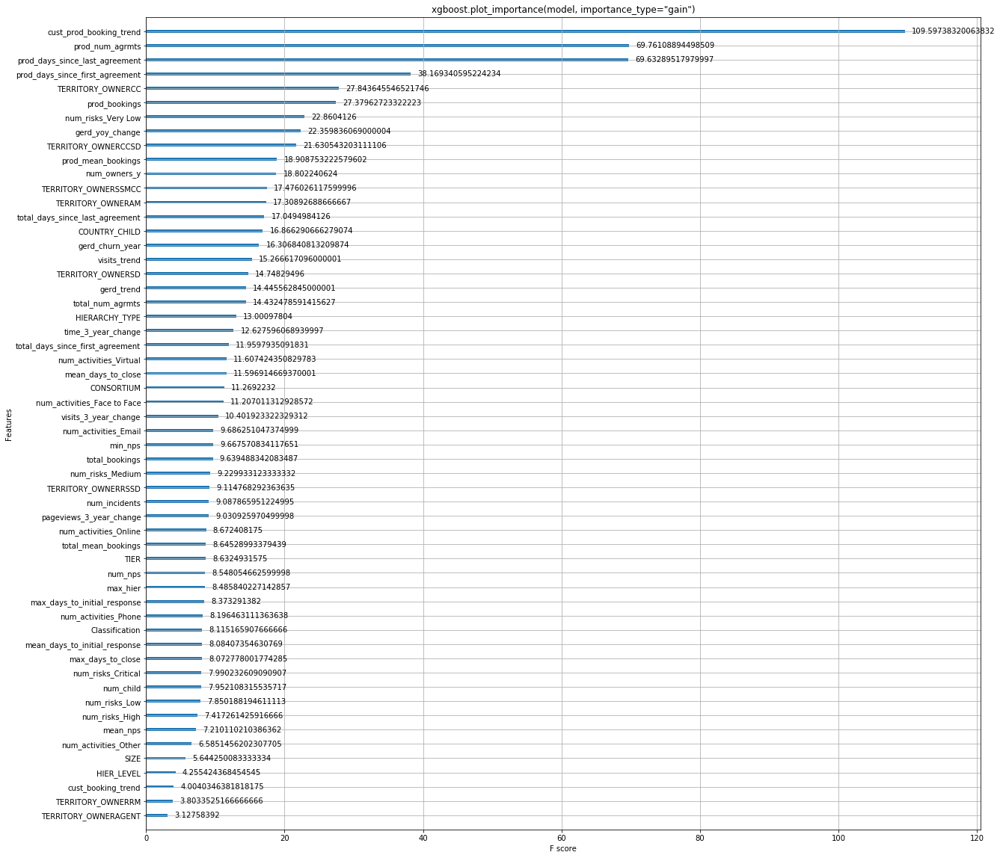

In [317]:
xgboost.plot_importance(model, importance_type="gain")
pl.title('xgboost.plot_importance(model, importance_type="gain")')
pl.show()

We see above that  the following features are important by gain <br>
1- cust_prod_booking_trend <br>
2- prod_num_agrmts_with_parents <br>
3- prod_num_agrmnts <br>
4- visits_trend <br>
5- TERRIOTRY_OWNERAGENT <br>

## Explain predictions

In [318]:
# this takes a minute or two since we are explaining over 
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

Setting feature_perturbation = "tree_path_dependent" because no background data was given.


Visualize a single prediction
Note that we use the "display values" data frame so we get nice strings instead of category codes.

In [319]:
for which_class in range(0,3):
    display(shap.force_plot(explainer.expected_value[which_class], shap_values[which_class][1], X_display.iloc[1,:]))

<b>Visualize many predictions</b>
To keep the browser happy we only visualize 1,000 individuals.

In [320]:
shap.force_plot(explainer.expected_value[1], shap_values[1][:10,:], X_display.iloc[:10,:])

<b>Bar chart of mean importance </b>
This takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

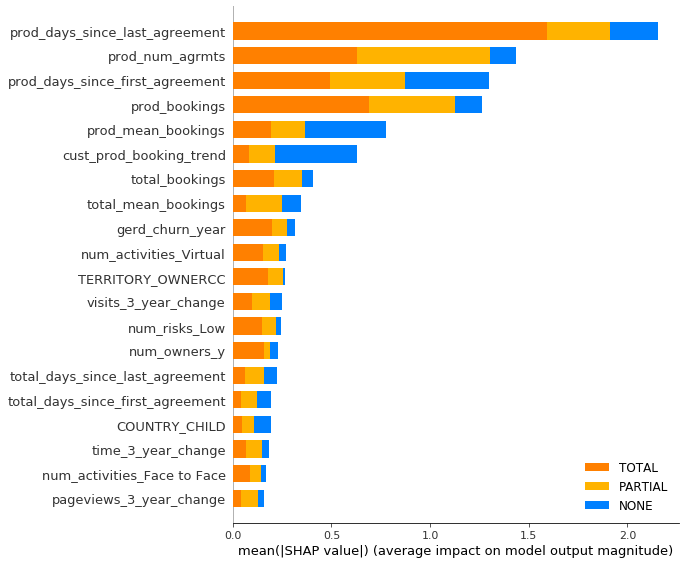

In [321]:
from matplotlib import colors as plt_colors

# class names
classes = ['NONE', 'PARTIAL', 'TOTAL']

# set RGB tuple per class
colors = [(0, 0.5, 1), (1, 0.7, 0), (1, 0.5, 0)]

# get class ordering from shap values
class_inds = np.argsort([-np.abs(shap_values[i]).mean() for i in range(len(shap_values))])

# create listed colormap
cmap = plt_colors.ListedColormap(np.array(colors)[class_inds])


shap.summary_plot(shap_values, X_display, color=cmap, class_names=classes)

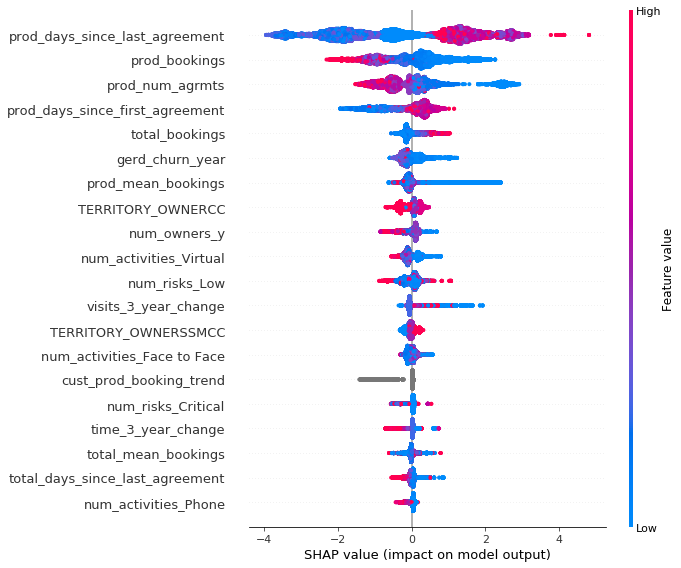

In [322]:
shap.summary_plot(shap_values[2], X_display)

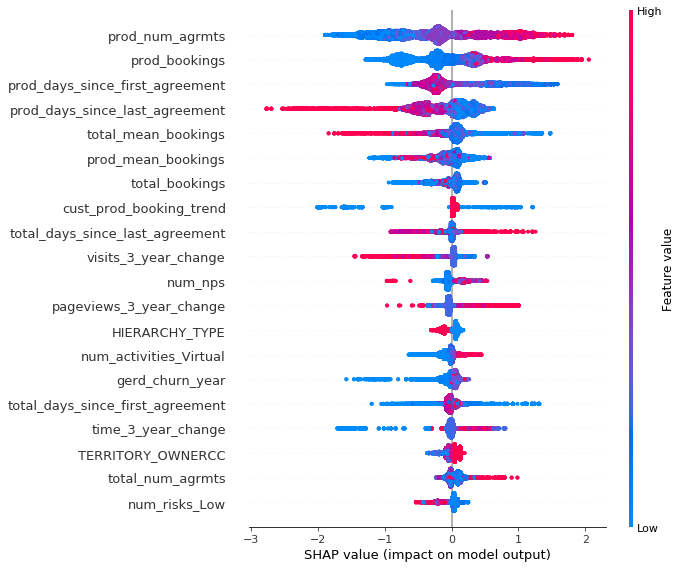

In [323]:
shap.summary_plot(shap_values[1], X)

SHAP Summary Plot
Rather than use a typical feature importance bar chart, we use a density scatter plot of SHAP values for each feature to identify how much impact each feature has on the model output for individuals in the validation dataset. Features are sorted by the sum of the SHAP value magnitudes across all samples. It is interesting to note that the relationship feature has more total model impact than the captial gain feature, but for those samples where capital gain matters it has more impact than age. In other words, capital gain effects a few predictions by a large amount, while age effects all predictions by a smaller amount.

Note that when the scatter points don't fit on a line they pile up to show density, and the color of each point represents the feature value of that individual.

# Furhter we simplufy mode keep the top features

In [324]:
keep_features = ['prod_num_agrmts', 'prod_mean_bookings', 'prod_days_since_last_agreement', 
                 'prod_days_since_first_agreement',
                 'total_mean_bookings', 'num_activities_Virtual',
                 'gerd_churn_year', 'CHURN_TYPE']

In [325]:
simple_sample = sample[keep_features]
simple_sample_display = sample_display[keep_features]

X = simple_sample.loc[:, simple_sample.columns != 'CHURN_TYPE']
y = simple_sample['CHURN_TYPE']

X_display = simple_sample_display.loc[:, simple_sample_display.columns != 'CHURN_TYPE']
y_display = simple_sample_display['CHURN_TYPE']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=7)

In [326]:

xgbc = xgboost.XGBClassifier(learning_rate=0.5,
                    n_estimators=120,
                    max_depth=4,
                    min_child_weight=0,
                    gamma=0,
                    reg_lambda=1,
                    subsample=1,
                    colsample_bytree=0.75,
                    scale_pos_weight=1,
                    objective='multi:softprob',
                    num_class=3,
                    random_state=42)

In [327]:
start_time = time.time()
model = xgbc.fit(X_train, y_train, eval_metric='mlogloss')
print(f'Model training completed in {round((time.time() - start_time)/60, 2)} mins for {len(X_train)} samples')

Model training completed in 0.12 mins for 29251 samples


In [328]:
pred = model.predict(X_test)
proba = model.predict_proba(X_test)

In [329]:
from sklearn.metrics import classification_report

print(classification_report(y_test, pred))

              precision    recall  f1-score   support

           0       0.96      0.83      0.89      2400
           1       0.87      0.97      0.92      2397
           2       0.96      0.98      0.97      2516

    accuracy                           0.93      7313
   macro avg       0.93      0.93      0.93      7313
weighted avg       0.93      0.93      0.93      7313



In [334]:
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(y_test, pred)
cm

array([[1991,  324,   85],
       [  61, 2323,   13],
       [  26,   13, 2477]], dtype=int64)

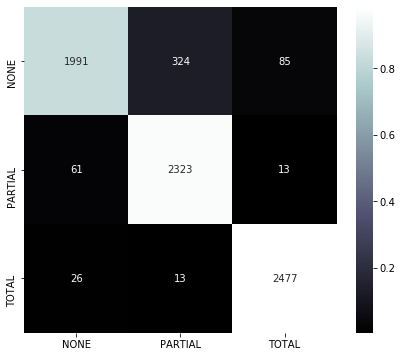

In [335]:
def plot_confusion_matrix(cm, classes, normalized=True, cmap='bone'):
    plt.figure(figsize=[7, 6])
    norm_cm = cm
    if normalized:
        norm_cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        sns.heatmap(norm_cm, annot=cm, fmt='g', xticklabels=classes, yticklabels=classes, cmap=cmap)
        #plt.savefig('confusion-matrix.png')

plot_confusion_matrix(cm, ['NONE', 'PARTIAL', 'TOTAL'])

In [336]:
pd.Series(pred).value_counts()

1    2660
2    2575
0    2078
dtype: int64

In [337]:
y_test.value_counts()

2    2516
0    2400
1    2397
Name: CHURN_TYPE, dtype: int64

## Explain predictions

In [338]:
# this takes a minute or two since we are explaining over 30 thousand samples in a model with over a thousand trees
explainer = shap.TreeExplainer(model)
shap_values = explainer.shap_values(X)

In [339]:
shap_values

[array([[ 0.58239925,  1.771694  ,  0.40513793, ...,  0.22754855,
          0.20323859,  0.09836665],
        [ 0.58239925,  1.771694  ,  0.40513793, ...,  0.22754855,
          0.20323859,  0.09836665],
        [-0.08934008, -0.07947257,  1.177424  , ...,  0.6377682 ,
          0.01709495,  0.23220922],
        ...,
        [ 0.17579833, -0.28230956, -0.36582455, ..., -0.17257468,
          0.03201031,  0.2144317 ],
        [ 0.05825303, -0.09986906,  0.15853015, ..., -0.05024428,
         -0.06801019, -0.6011503 ],
        [ 0.09607601, -0.21793923, -0.7901855 , ..., -0.24931413,
          0.00701986,  0.13451645]], dtype=float32),
 array([[-0.17254691,  0.135125  ,  0.3458997 , ...,  0.02600269,
          1.0817844 , -0.3313805 ],
        [-0.17254691,  0.135125  ,  0.3458997 , ...,  0.02600269,
          1.0817844 , -0.3313805 ],
        [ 1.0426258 ,  0.24348487, -2.0898988 , ..., -0.13557373,
          0.3237366 , -0.27220201],
        ...,
        [-2.0259445 , -1.039823  , -1.3111304 , ..., -0.3372663 ,
         -0.4085968 , -0.13625865],
        [-0.12550354,  0.04451249,  0.6444363 , ...,  0.06838856,
         -0.23573548, -0.11821774],
        [-2.010496  , -0.5622858 , -0.98038906, ..., -1.2261354 ,
          0.14463651, -0.40598232]], dtype=float32),
 array([[-0.9068055 , -1.5277591 , -2.0328279 , ..., -0.16926512,
         -0.9924148 ,  0.01490316],
        [-0.9068055 , -1.5277591 , -2.0328279 , ..., -0.16926512,
         -0.9924148 ,  0.01490316],
        [-1.878971  , -1.8010397 , -0.83068454, ..., -0.31175402,
         -1.1311638 , -0.37235057],
        ...,
        [ 0.9004041 ,  1.1306523 ,  1.4745618 , ...,  0.15981545,
          0.52294326,  0.28031492],
        [-0.01327348,  0.14655867, -1.236285  , ..., -0.02347465,
          0.57813   ,  1.8144686 ],
        [ 1.4455842 ,  0.98359036,  1.4019146 , ...,  0.32117665,
         -0.17161871,  0.7965633 ]], dtype=float32)]

In [340]:
X.columns

Index(['prod_num_agrmts', 'prod_mean_bookings',
       'prod_days_since_last_agreement', 'prod_days_since_first_agreement',
       'total_mean_bookings', 'num_activities_Virtual', 'gerd_churn_year'],
      dtype='object')

In [341]:
shap_df = pd.DataFrame(np.concatenate(shap_values))
shap_df.columns = X.columns
shap_df

,prod_num_agrmts,prod_mean_bookings,prod_days_since_last_agreement,prod_days_since_first_agreement,total_mean_bookings,num_activities_Virtual,gerd_churn_year
0,1,2,0,-0,0,0,0
1,1,2,0,-0,0,0,0
2,-0,-0,1,-0,1,0,0
3,-0,-0,1,-0,1,0,0
4,0,0,0,6,1,0,0
...,...,...,...,...,...,...,...
109687,3,0,2,-1,0,0,-0
109688,2,0,2,1,0,-0,-0
109689,1,1,1,-1,0,1,0
109690,-0,0,-1,0,-0,1,2


Visualize a single prediction
Note that we use the "display values" data frame so we get nice strings instead of category codes.

You can visualise how every feature and its values affects the prediction how the feature is pushing it higher or lower and the size of effect

In [342]:
shap.force_plot(explainer.expected_value[0], shap_values[0][1], X_display.iloc[1,:])

In [343]:
for which_class in range(0,3):
    display(shap.force_plot(explainer.expected_value[which_class], shap_values[which_class][1], X_display.iloc[1,:]))

<b>Visualize many predictions</b>
To keep the browser happy we only visualize 1,000 individuals.

In [344]:
shap.force_plot(explainer.expected_value[2], shap_values[2][:1000,:], X_display.iloc[:1000,:])

<b>Bar chart of mean importance </b>
This takes the average of the SHAP value magnitudes across the dataset and plots it as a simple bar chart.

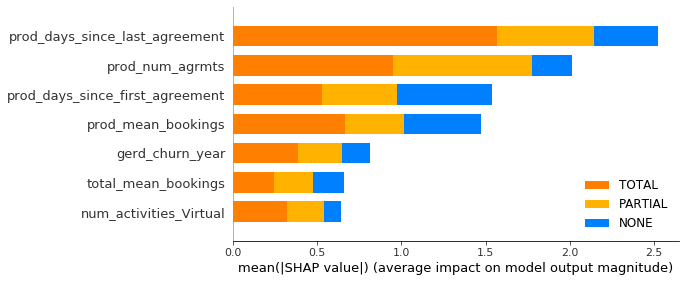

In [345]:
from matplotlib import colors as plt_colors

# class names
classes = ['NONE', 'PARTIAL', 'TOTAL']

# set RGB tuple per class
colors = [(0, 0.5, 1), (1, 0.7, 0), (1, 0.5, 0)]

# get class ordering from shap values
class_inds = np.argsort([-np.abs(shap_values[i]).mean() for i in range(len(shap_values))])

# create listed colormap
cmap = plt_colors.ListedColormap(np.array(colors)[class_inds])


shap.summary_plot(shap_values, X_display, color=cmap, class_names=classes)

<b> Variable most significat for predicting class 2 i.e. Total Churn </b>

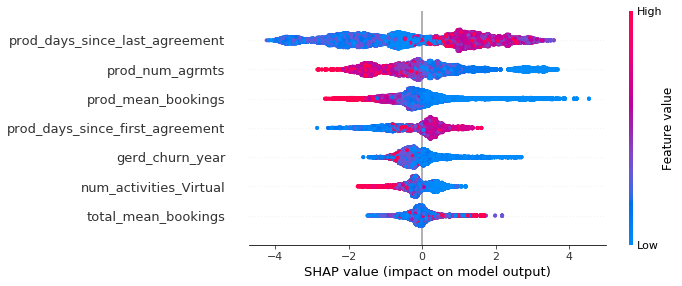

In [346]:
shap.summary_plot(shap_values[2], X)

<b> Variable most significat for predicting class 1 i.e. Partial Churn </b>

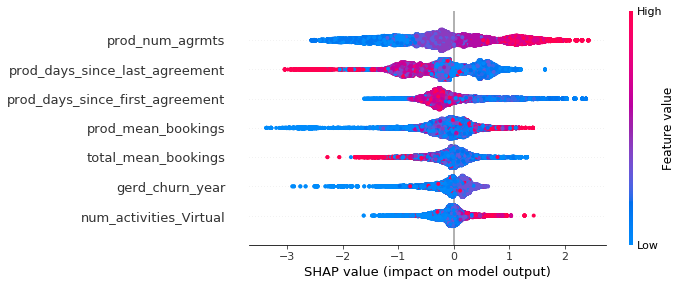

In [345]:
shap.summary_plot(shap_values[1], X)

<h1> SHAP Dependence Plots </h1>

While a SHAP summary plot gives a general overview of each feature a SHAP dependence plot show how the model output varies by feauture value. Note that every dot is a customer x product record, and the vertical dispersion at a single feature value results from interaction effects in the model. The feature used for coloring is automatically chosen to highlight what might be driving these interactions.

 SHAP partial dependence plot for prod_num_agrmts on NO_CHURN


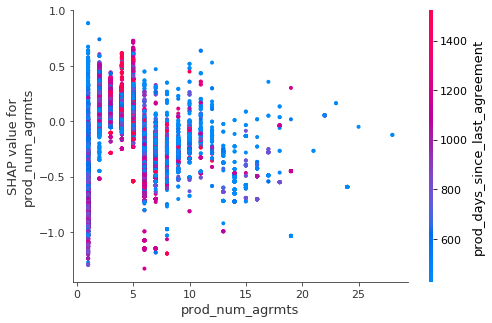

 SHAP partial dependence plot for prod_num_agrmts on TOTAL_CHURN


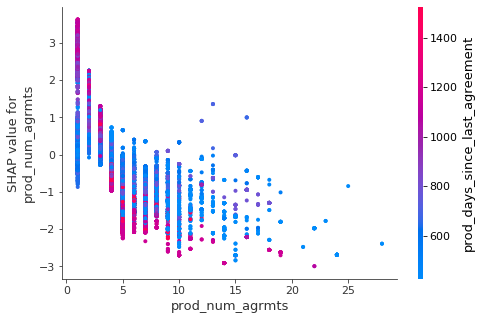

 SHAP partial dependence plot for prod_num_agrmts on PARTIAL_CHURN


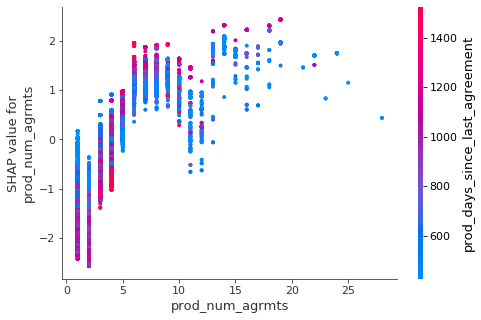

 SHAP partial dependence plot for prod_mean_bookings on NO_CHURN


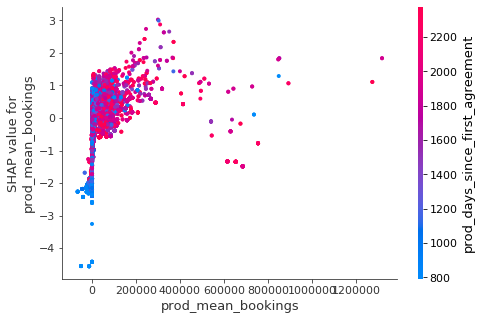

 SHAP partial dependence plot for prod_mean_bookings on TOTAL_CHURN


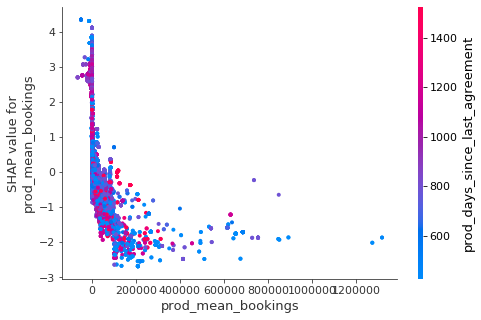

 SHAP partial dependence plot for prod_mean_bookings on PARTIAL_CHURN


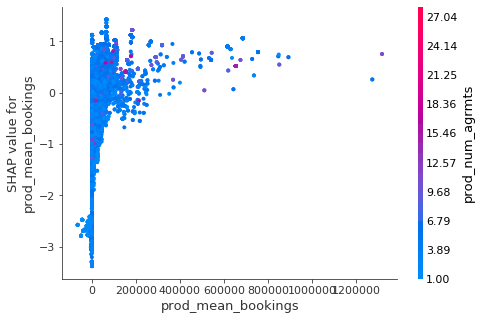

 SHAP partial dependence plot for prod_days_since_last_agreement on NO_CHURN


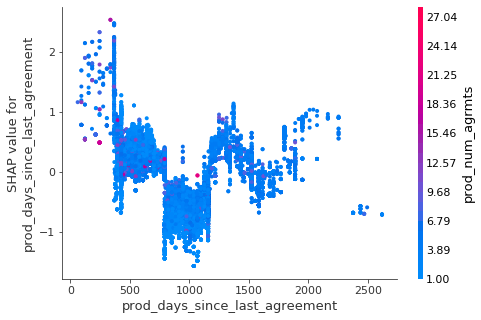

 SHAP partial dependence plot for prod_days_since_last_agreement on TOTAL_CHURN


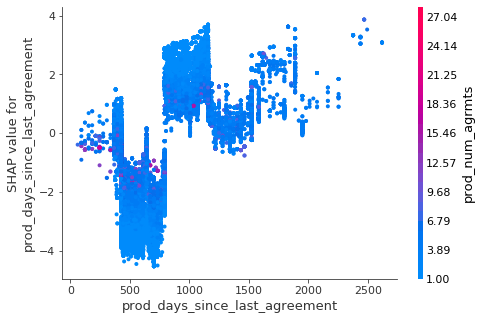

 SHAP partial dependence plot for prod_days_since_last_agreement on PARTIAL_CHURN


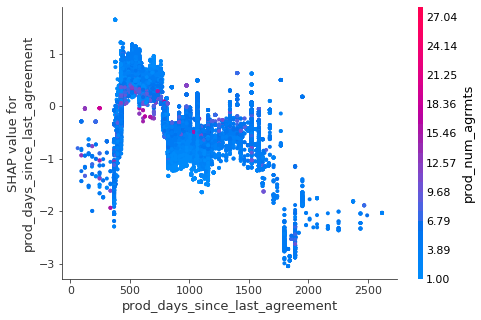

 SHAP partial dependence plot for prod_days_since_first_agreement on NO_CHURN


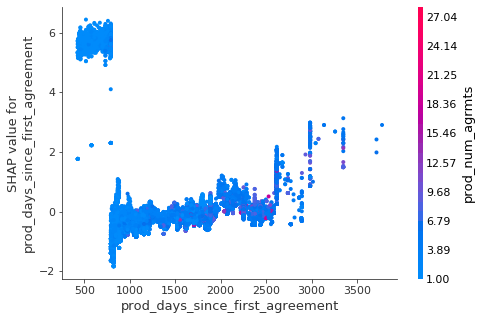

 SHAP partial dependence plot for prod_days_since_first_agreement on TOTAL_CHURN


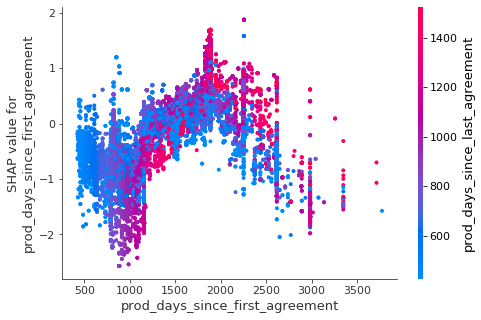

 SHAP partial dependence plot for prod_days_since_first_agreement on PARTIAL_CHURN


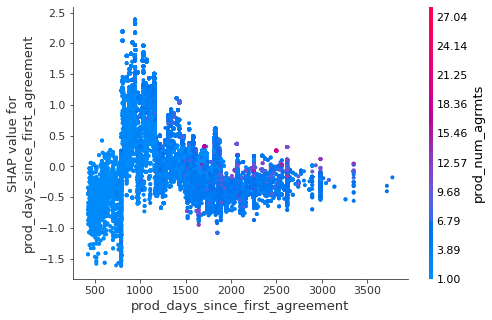

 SHAP partial dependence plot for total_mean_bookings on NO_CHURN


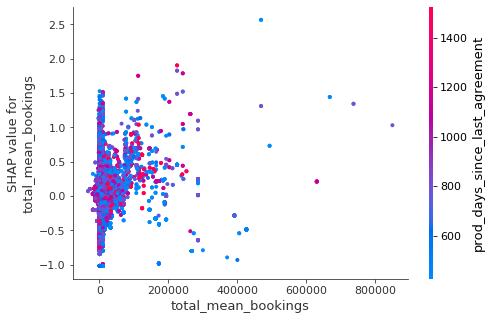

 SHAP partial dependence plot for total_mean_bookings on TOTAL_CHURN


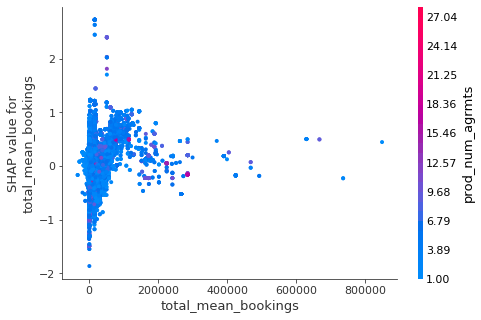

 SHAP partial dependence plot for total_mean_bookings on PARTIAL_CHURN


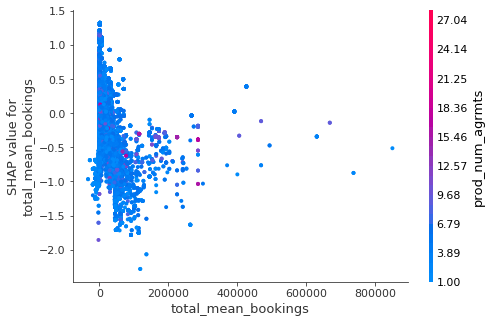

 SHAP partial dependence plot for num_activities_Virtual on NO_CHURN


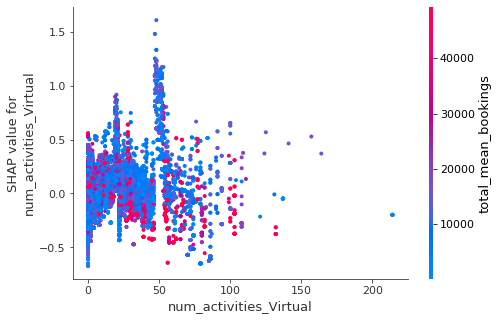

 SHAP partial dependence plot for num_activities_Virtual on TOTAL_CHURN


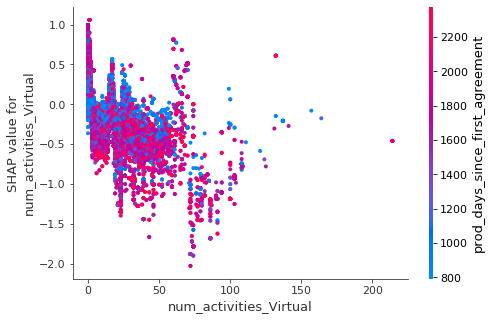

 SHAP partial dependence plot for num_activities_Virtual on PARTIAL_CHURN


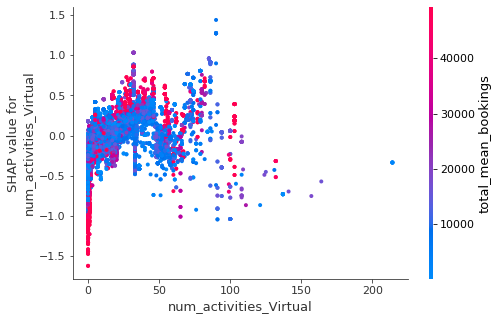

 SHAP partial dependence plot for gerd_churn_year on NO_CHURN


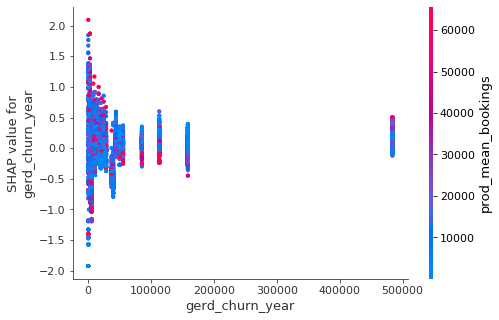

 SHAP partial dependence plot for gerd_churn_year on TOTAL_CHURN


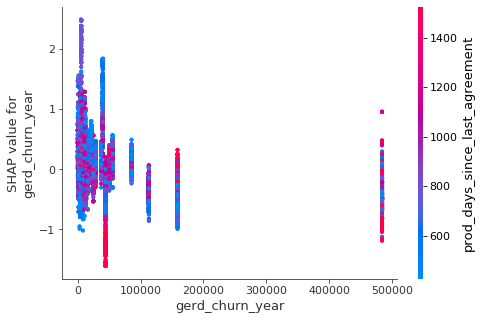

 SHAP partial dependence plot for gerd_churn_year on PARTIAL_CHURN


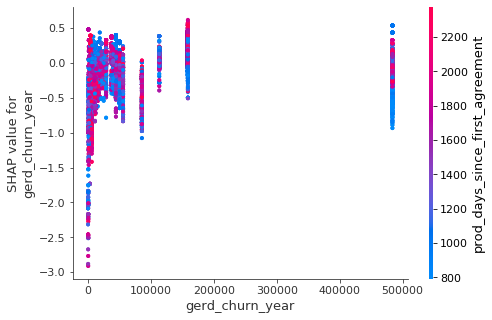

In [347]:
keep_features.remove('CHURN_TYPE')
for this_feature in keep_features:
#     print(f' SHAP partial dependence plot for {this_feature} on NO_CHURN')
#     shap.dependence_plot(this_feature, shap_values[0], X, display_features=X_display)
    
    print(f' SHAP partial dependence plot for {this_feature} on TOTAL_CHURN')
    shap.dependence_plot(this_feature, shap_values[2], X, display_features=X_display)
    
    print(f' SHAP partial dependence plot for {this_feature} on PARTIAL_CHURN')
    shap.dependence_plot(this_feature, shap_values[1], X, display_features=X_display)

# Save Model

In [348]:
# Serialise and save model
pickle.dump(model, open("../models/solutions_xgb.pickle.dat", "wb"))